This document is a supplemtary material for the following manuscript:

Non-B DNA: A major contributor to small- and large-scale variation in nucleotide substitution frequencies across the genome, by Guiblet, Cremona, et al.

# Table of contents

Objective

Liraries

* 1 Gathering datasets
  * 1.1 Diversity - Simons Genome Diversity Project
  * 1.2 Divergence
  * 1.3 G-quadruplex annotation with Quadron
    * 1.3.1 Distribution of Quadron scores and lengths of loci
	* 1.3.2 Compute G4 weighted scores
  * 1.4 Other non-B DNA motifs
  * 1.5 RepeatMasker
  * 1.6 Genic Regions
  * 1.7 phastCons
  * 1.8 Genehancer
  * 1.9 Lamina Associated Domains (LADs)
  * 1.10 CpG Islands
  * 1.11 Datasets from previous study
    * 1.11.1 Weighted replication timing
    * 1.11.2 Average recombination rate
  * 1.12 GC Content
  * 1.13 Distances from telomeres and centromeres
  * 1.14 ENCODE
  * 1.15 Mappability

* 2 Creating the NCNR subgenome

* 3 Merging all predictors and responses in one dataframe

* 4 Perform multiple regression
  * 4.1 Preprocessing
  * 4.2 Regression

File index

# Objective

Study the contribution of non-B DNA structures to the regional variations in mutation rate.

We will perform a multiple linear regression for each of the three responses of interest.

$\begin{pmatrix} SGDP \\ Divergence  \end{pmatrix}$ **~**
$\begin{pmatrix} G4s + APhased + Direct + Inverted + Mirror +\\
ZDNA +  GCcontent  \cdots \end{pmatrix}$

# Libraries

Load the following library. They will be necessary for the rest of the notebook.

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import sklearn
from sklearn import preprocessing
from sklearn import linear_model
import pandas as pd
import sys
import re
import os

# 1. Gathering datasets

We will divide the genomes in 1Mb (100kb or 10kb) windows. Each will have a coverage or score for the following predictors:

- G4s loci weighted by stability scores
- Other non-B DNA loci
- Homo - Pongo Divergence
- Simmons Genome Diversity Project
- RepeatMasker
- Functional Elements
- Replication Timing
- Recombination Rates
- DNAse Hypersensitive Sites
- GCcontent
- ...

## 1.1 Diversity -  Simons Genome Diversity Project

Data downloaded at https://cgc-accounts.sbgenomics.com/ . Files are sequencing projects for each individual. They were filtered and merged (see following command lines) to obtain a collection of unique SNPs in the sequenced population.

```
tar zxvf *output_archive.tar.gz
gunzip *vcf.gz
grep -h 'PASS' *filter.vcf > WholeSGDPsnps.vcf
```

In [ ]:
#preprocess.py
#Make this a script in your local directory and run with python.
#It is too much computation for a Jupyter notebook and will produce bad output.


#Input the VCF file
#Output a BED file with MAF in the dataset.

import sys
import re

infile = open('WholeSGDPsnps.vcf', 'r+')
outfile = open('WholeSGDPsnps.bed', 'w')

variants = {}
n_individuals = 267 # Number of individuals in the dataset

for line in infile:
        array = line.strip().split('\t')
        if len(array) > 9 and line[0] != '#':
                chrom, position, ref, alts = array[0], array[1], array[3], array[4]
                start = position
                end = position
                info = array[7]
                AF = re.search('[\;][A][F][=][0-9,\.]+', info).group()[4:]
                key = chrom+'|'+start+'|'+end
                if key not in variants:
                    variants[key] = [0,0,0,0,'',''] # A T G C ref alts

                variants[key][4] = variants[key][4] + ref
                AF = AF.split(',')
                i = 0
                for alt in alts.split(','):
                    if alt == 'A':
                        variants[key][0] += float(AF[i])
                    elif alt == 'T':
                        variants[key][1] += float(AF[i])
                    elif alt == 'G':
                        variants[key][2] += float(AF[i])
                    elif alt == 'C':
                        variants[key][3] += float(AF[i])
                    else:
                        print('ERROR\t'+str(array))

                    variants[key][5] = variants[key][5] + alt
                    i += 1

for variant in variants:
    chrom, start, end = variant.split('|')
    allele_freqs = [x / n_individuals for x in variants[variant][:4]]
    max_freq = max(allele_freqs)

    ref = ''
    for allele in set(variants[variant][4]):
        ref = ref + str(allele)

    alts = ''
    for allele in set(variants[variant][5]):
        alts = alts + str(allele)

    indices = [i for i,n in enumerate(allele_freqs) if n == max_freq]

    alt = ''

    for index in indices:
        if index == 0:
            alt = alt+'A'
        elif index == 1:
            alt = alt+'T'
        elif index == 2:
            alt = alt+'G'
        elif index == 3:
            alt = alt+'C'

    outfile.write('chr'+chrom+'\t'+start+'\t'+end+'\t'+ref+'\t'+alt+'\t'+str(max_freq)+'\t'+alts+'\n')                                                                                

Output is **WholeSGDPsnps.bed**.

## 1.2 Divergence

Divergence file obtained from our previous study:

"Long-read sequencing technology indicates genome- wide effects of non-B DNA on polymerization speed and error rate", by Guiblet, Cremona, et al.

In [ ]:
DivergenceGFF = open('../../kinetics_bk/Divergence/WG_SNPS.gff', 'rt')
DivergenceBED = open('divergence.bed', 'w+')

for line in DivergenceGFF:
    array = line.strip().split('\t')
    chrom, start, end , homo, pongo = array[0], array[3], array[4], array[6], array[7]
    start = str(int(start)-1)
    DivergenceBED.write('chr'+chrom+'\t'+start+'\t'+end+'\t'+homo+'\t'+pongo+'\n')

Output is **divergence.bed**.

## 1.3 G-quadruplex annotation with Quadron

Install Quadron based on the author's documentation:

https://github.com/aleksahak/Quadron/blob/master/README.pdf

Run Quadron in R. The beginning was slightly altered for the inputs to be used as arguments. See the following. It might not be necessary to make such modification on your system.

```
#QuadronCustom.R
args <- commandArgs(trailingOnly = TRUE)

print("NOTE: Loading Quadron core...", quote=FALSE)
load("Quadron.lib")

Quadron(FastaFile= args[1],
        OutFile  = args[2],
        nCPU     = as.numeric(args[3]),
        SeqPartitionBy = 1000000)
```

Run Quadron in bash
```
Rscript QuadronCustom.R $in1 $in2 $in3
```

I ran Quadron for each chromosome separately to speed up the process. The next script merges all the outputs in a BED file.

In [ ]:
#MergeAndFilter.py
#Make this a script in your local directory and run with python.
#It is too much computation for a Jupyter notebook and will produce bad output.


import re

QuadronBed = open('hs37d5.quadron.bed', 'w+')

chroms = range(1,23)

for chrom in chroms:
    chrom = str(chrom)
    QuadronOutput = open('chr'+chrom+'_hs37d5.quadron', 'rt')

    for line in QuadronOutput:
        array = re.compile("[ ]+").split(line.strip())
        if array[0] == 'DATA:':
            position, strand, length, score, motif = array[1], array[2], array[3], array[4], array[5]
            start = str(int(position)-1)
            end = str(int(start)+int(length))
            QuadronBed.write('chr'+chrom+'\t'+str(start)+'\t'+str(end)+'\t'+motif+'\t'+length+'\t'+strand+'\t'+score+'\n')

Output is **hs37d5.quadron.bed** .

### 1.3.1 Distribution of Quadron scores and loci lengths.

In [ ]:
%%bash

#Retrieve the scores
cut -f 7 hs37d5.quadron.bed > hs37d5.quadron.scores

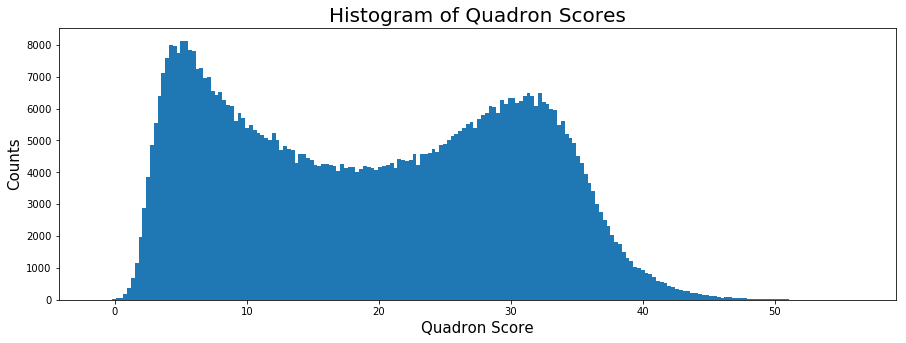

In [536]:

#Plot the scores as an histogram

scores_file = open('hs37d5.quadron.scores', 'rt')

scores = []

for line in scores_file:
    score = line.strip()
    if score != 'NA':
        scores.append(float(score))

fig, ax = plt.subplots(figsize=(15, 5))
hist = ax.hist(scores, bins=200)
title = ax.set_title('Histogram of Quadron Scores', fontsize=20)
ylabel = ax.set_ylabel('Counts', fontsize=15)
xlabel = ax.set_xlabel('Quadron Score', fontsize=15)

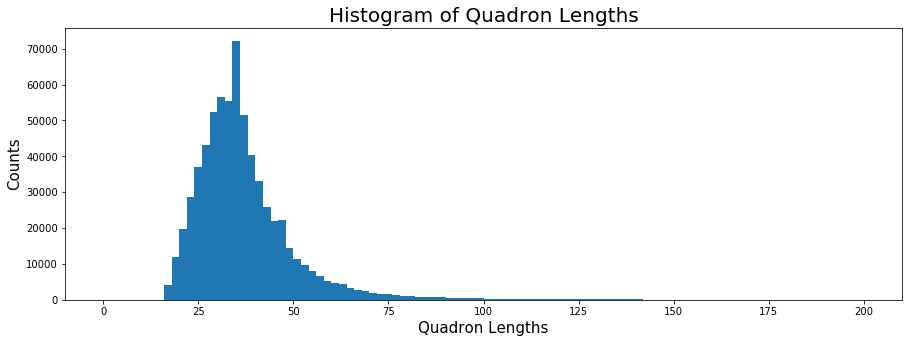

In [537]:

#Retrieve the lenghts and plot as an histogram

bedfile = open('../Quadron/hs37d5.quadron.bed', 'rt')

lengths = []

for line in bedfile:
    chrom, start, end, motif, length, strand, score = line.strip().split('\t')
    lengths.append(int(end)-int(start)+1)
    
fig, ax = plt.subplots(figsize=(15, 5))
hist = ax.hist(lengths, bins=100, range=(0,200))
title = ax.set_title('Histogram of Quadron Lengths', fontsize=20)
ylabel = ax.set_ylabel('Counts', fontsize=15)
xlabel = ax.set_xlabel('Quadron Lengths', fontsize=15)

### 1.3.2 Computed G4 weighted scores in windows

The pipeline to create hg19_1Mb_noGap.bed was retrieved from the previous study "Human L1 Transposition Dynamics Unraveled with Functional Data Analysis" by 
Di Chen and Marzia Cremona.



Intersecting 1Mb windows with G4 loci

```
bedtools intersect -a hg19_1Mb_noGap.bed -b NCNRQuadron.bed -wa -wb -loj > G4Intersect_1Mb
```

In [13]:
#Compute weighted score and output a BED file


intersectfile = open('G4Intersect_1Mb', 'rt')
outfile = open('WeightedScore_1Mb.bed', 'w+')


parsedwindows = {}

for line in intersectfile:
    array = line.strip().split('\t')
    if array[3] != '.': #remove windows without intersect
        chrom, windowstart, windowend, motifstart, motifend, score = array[0], int(array[1]), int(array[2]), \
            int(array[4]), int(array[5]), float(array[9])

        key = chrom+'|'+str(windowstart)+'|'+str(windowend)

        if key not in parsedwindows:
            parsedwindows[key] = 0

        if motifstart >= windowstart and motifend <= windowend:
            length = motifend - motifstart

        elif motifstart < windowstart and motifend <= windowend:
            length = motifend - windowstart

        elif motifstart >= windowstart and motifend > windowend:
            length = windowend - motifstart

        elif motifstart < windowstart and motifend > windowend:
            length = windowend - windowstart

        try:
            parsedwindows[key] += score * length
        except:
            print(array, length)

#print(parsedwindows)
for window in parsedwindows:
    chrom, start, end = window.split('|')
    outfile.write(chrom+'\t'+str(start)+'\t'+str(end)+'\t'+str(parsedwindows[window])+'\n')

## 1.4 Additionnal non-B DNA motifs from non-B DB

Files downloaded from non-B DB (https://nonb-abcc.ncifcrf.gov/apps/Query-GFF/feature/)

Loci with unexpectedly long motif will be removed as they are unlikely to be real non-B DNA loci.

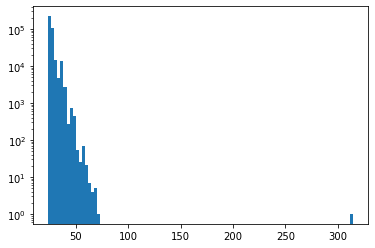

In [5]:
#infile = open('GFF/WG_Clean/APhasedRepeats', 'rt')
infile = open('../G4Flanks/APhasedRepeats.bed')

lengths = []
for line in infile:
    array = line.strip().split('\t')
    #print(array)
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        length = int(end) - int(start) + 1
        lengths.append(length)
        
hist = plt.hist(lengths, bins=100)
plt.yscale('log', nonposy='clip')

Let's remove this suspicious 300 nucleotides locus.

In [7]:
#infile = open('GFF/WG_Clean/APhasedRepeats', 'rt')
infile = open('../G4Flanks/APhasedRepeats.bed')
outfile = open('APhasedRepeats.bed', 'w+')

counts = 0
for line in infile:
    array = line.strip().split('\t')
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        start = str(int(start)-1)
        length = int(end) - int(start) + 1
        if length < 300:
            outfile.write(chrom+'\t'+start+'\t'+end+'\n')
        else:
            counts +=1
            
print("Removed "+str(counts)+" locus(i)")

Removed 1 locus(i)


Output is **APhasedRepeats.bed**.

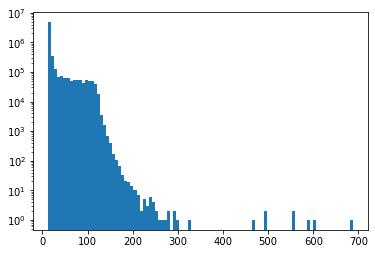

In [12]:
#infile = open('GFF/WG_Clean/InvertedRepeats', 'rt')
infile = open('../G4Flanks/InvertedRepeats.bed')

lengths = []
for line in infile:
    array = line.strip().split('\t')
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        length = int(end) - int(start) + 1
        lengths.append(length)
        
hist = plt.hist(lengths, bins=100)
plt.yscale('log', nonposy='clip')

Let's remove the suspicious >400 nucleotides loci.

In [13]:
#infile = open('GFF/WG_Clean/InvertedRepeats', 'rt')
infile = open('../G4Flanks/InvertedRepeats.bed')
outfile = open('InvertedRepeats.bed', 'w+')

counts = 0
for line in infile:
    array = line.strip().split('\t')
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        start = str(int(start)-1)
        length = int(end) - int(start) + 1
        if length < 400:
            outfile.write(chrom+'\t'+start+'\t'+end+'\n')
        else:
            counts +=1
            
print("Removed "+str(counts)+" locus(i)")

Removed 8 locus(i)


Output is **InvertedRepeats.bed**.

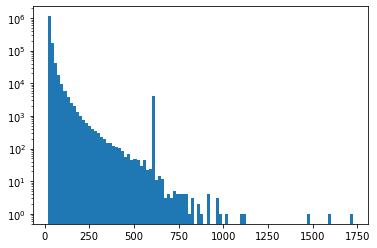

In [14]:
#infile = open('GFF/WG_Clean/DirectRepeats', 'rt')
infile = open('../G4Flanks/DirectRepeats.bed')

lengths = []
for line in infile:
    array = line.strip().split('\t')
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        length = int(end) - int(start) + 1
        lengths.append(length)
        
hist = plt.hist(lengths, bins=100)
plt.yscale('log', nonposy='clip')

Let's remove the suspicious >1250 nucleotides loci.

In [15]:
#infile = open('GFF/WG_Clean/DirectRepeats', 'rt')
infile = open('../G4Flanks/DirectRepeats.bed')
outfile = open('DirectRepeats.bed', 'w+')

counts = 0
for line in infile:
    array = line.strip().split('\t')
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        start = str(int(start)-1)
        length = int(end) - int(start) + 1
        if length < 1250:
            outfile.write(chrom+'\t'+start+'\t'+end+'\n')
        else:
            counts +=1
            
print("Removed "+str(counts)+" locus(i)")

Removed 3 locus(i)


Output is **DirectRepeats.bed**.

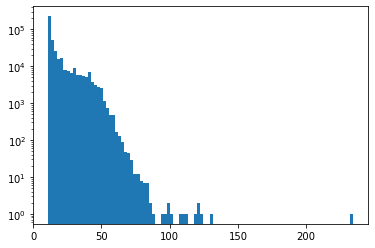

In [16]:
#infile = open('GFF/WG_Clean/ZDNAMotifs', 'rt')
infile = open('../G4Flanks/ZDNA.bed')

lengths = []
for line in infile:
    array = line.strip().split('\t')
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        length = int(end) - int(start) + 1
        lengths.append(length)
        
hist = plt.hist(lengths, bins=100)
plt.yscale('log', nonposy='clip')

Let's remove the suspicious >200 nucleotides locus.

In [17]:
#infile = open('GFF/WG_Clean/ZDNAMotifs', 'rt')
infile = open('../G4Flanks/ZDNA.bed')
outfile = open('ZDNAMotifs.bed', 'w+')

counts = 0
for line in infile:
    array = line.strip().split('\t')
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        start = str(int(start)-1)
        length = int(end) - int(start) + 1
        if length < 200:
            outfile.write(chrom+'\t'+start+'\t'+end+'\n')
        else:
            counts +=1
            
print("Removed "+str(counts)+" locus(i)")

Removed 1 locus(i)


Output is **ZDNAMotifs.bed**.

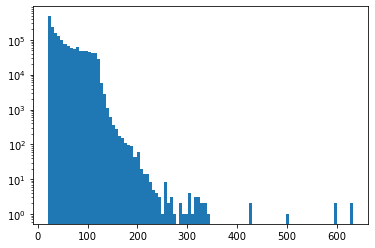

In [18]:
#infile = open('GFF/WG_Clean/MirrorRepeats', 'rt')
infile = open('../G4Flanks/MirrorRepeats.bed')

lengths = []
for line in infile:
    array = line.strip().split('\t')
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        length = int(end) - int(start) + 1
        lengths.append(length)
        
hist = plt.hist(lengths, bins=100)
plt.yscale('log', nonposy='clip')

Let's remove the suspicious >400 nucleotides locus.

In [19]:
#infile = open('GFF/WG_Clean/MirrorRepeats', 'rt')
infile = open('../G4Flanks/MirrorRepeats.bed')
outfile = open('MirrorRepeats.bed', 'w+')

counts = 0
for line in infile:
    array = line.strip().split('\t')
    #if len(array) == 7:
    if len(array) == 4:
        #chrom, start, end = array[0], array[3], array[4]
        chrom, start, end = array[0], array[1], array[2]
        start = str(int(start)-1)
        length = int(end) - int(start) + 1
        if length < 400:
            outfile.write(chrom+'\t'+start+'\t'+end+'\n')
        else:
            counts +=1
            
print("Removed "+str(counts)+" locus(i)")

Removed 7 locus(i)


Output is **MirrorRepeats.bed**.

## 1.5 RepeatMasker

- **Download hg19 chromOut.tar.gz at**

http://hgdownload.cse.ucsc.edu/goldenPath/hg19/bigZips/chromOut.tar.gz


Then extract the data, remove alternative contigs, save all in a directory and merge chromsomes 1-22 in a single file
```
tar zxvf chromOut.tar.gz
rm -r Un_gl0002*
rm -r *gl000*
rm -r *hap*
mkdir RepeatMaskedHg19
mv 1* 2* 3/ 4/ 5/ 6/ 7/ 8/ 9/ M/ X/ Y/ RepeatMaskedHg19/
cd RepeatMaskedHg19/
cat 1/chr1.fa.out 2/chr2.fa.out 3/chr3.fa.out 4/chr4.fa.out 5/chr5.fa.out 6/chr6.fa.out 7/chr7.fa.out 8/chr8.fa.out 9/chr9.fa.out 10/chr10.fa.out 11/chr11.fa.out 12/chr12.fa.out 13/chr13.fa.out 14/chr14.fa.out 15/chr15.fa.out 16/chr16.fa.out 17/chr17.fa.out 18/chr18.fa.out 19/chr19.fa.out 20/chr20.fa.out 21/chr21.fa.out 22/chr22.fa.out > autosomes.out
```

We spearate the RepeatMasker output in Interspersed elements and non-Interspersed elements (G4s overlap greatly with L1 and other TEs).

In [ ]:
#RM.py
import re

RepeatMasker = open('RepeatMaskedHg19/autosomes.out', 'rt')
RepeatMaskerBED = open('hg19RM_no_Interspersed.bed', 'w+')
InterspersedBED = open('hg19Interspersed.bed', 'w+')


chroms = []
for i in range(1,23):
    chroms.append('chr'+str(i))

i=0
for line in RepeatMasker:
    match = re.search('.*(chr[0-9]+)\s*([0-9]*)\s*([0-9]*)\s*\S*\s*\S\s*\S*\s*(\S*)\s*.*', line)
    
    if match:
        chrom = match.group(1)
        if chrom in chroms:
            start = match.group(2)
            end = match.group(3)
            repeat = match.group(4)
            #RepeatMaskerBED.write(chrom+'\t'+start+'\t'+end+'\t'+repeat+'\n')
            
            if 'LINE' in repeat or 'SINE' in repeat or 'LTR' in repeat or 'DNA' in repeat:
                InterspersedBED.write(chrom+'\t'+start+'\t'+end+'\t'+repeat+'\n')
            else:
                RepeatMaskerBED.write(chrom+'\t'+start+'\t'+end+'\t'+repeat+'\n')

Outputs are **hg19Interspersed.bed** and and **hg19RM_no_Interspersed.bed**.

## 1.6 Genic Regions

- **Download genic regions at UCSC genome browser**

https://genome.ucsc.edu/cgi-bin/hgTables?hgsid=910162269_z9vFrUVyGvQIjhr8xRHh5WkZnvRC&clade=mammal&org=Human&db=hg38&hgta_group=genes&hgta_track=refSeqComposite&hgta_table=0&hgta_regionType=genome&position=chr1%3A11%2C102%2C837-11%2C267%2C747&hgta_outputType=bed&hgta_outFileName=TUTR.bed

1kb up- and downstream regions, 3' and 5' UTRs, exons, and introns downloaded separately.

## 1.7 phastCons conserved elements

- **Download phastCons elemets**

phastCons elements were downloaded from:

https://genome.ucsc.edu/cgi-bin/hgTables?hgsid=729251481_GRjFzYE9ZOwDkM5YBjeN0AyHE3SH&clade=mammal&org=Human&db=hg19&hgta_group=compGeno&hgta_track=cons100way&hgta_table=phastConsElements100way&hgta_regionType=genome&position=chr1%3A66%2C998%2C251-67%2C000%2C355&hgta_outputType=wigData&hgta_outFileName=phastConsElements100way.bed

In [540]:

#Adding flanks to the phastCons elements

phastConsFile = open('phastConsElements100way.bed', 'rt')
output = open('phastConsElements100wayFlanked.bed', 'w+')


chroms = []

for i in range(1,23):
    chroms.append('chr'+str(i))
    
#print(chroms)

phastConsFile.readline() # remove heade

for line in phastConsFile:
    array=line.strip().split('\t')
    lineindex, chrom, start, end, name, score = array
    if chrom in chroms:
        windowstart = str(int(start) - 100)
        windowend = str(int(end) + 100)
        output.write(chrom+'\t'+windowstart+'\t'+windowend+'\n')


## 1.8 GeneHancer elements

- **Download Genehancer elemets**

https://genome.ucsc.edu/cgi-bin/hgTables?hgsid=729251481_GRjFzYE9ZOwDkM5YBjeN0AyHE3SH&boolshad.hgta_printCustomTrackHeaders=0&hgta_ctName=tb_geneHancerRegElementsDoubleElite&hgta_ctDesc=table+browser+query+on+geneHancerRegElementsDoubleElite&hgta_ctVis=pack&hgta_ctUrl=&fbUpBases=5000&fbDownBases=5000&hgta_doMainPage=cancel


In [258]:

#Adding flanks to the genehancer elements

phastConsFile = open('GeneHancerRegElementsDoubleElite.bed', 'rt')
output = open('GeneHancerRegElementsDoubleEliteFlanked.bed', 'w+')


chroms = []

for i in range(1,23):
    chroms.append('chr'+str(i))
    
for line in phastConsFile:
    array=line.strip().split('\t')
    chrom, start, end = array[:3]
    if chrom in chroms:
        windowstart = str(int(start) - 100)
        windowend = str(int(end) + 100)
        output.write(chrom+'\t'+windowstart+'\t'+windowend+'\n')


## 1.9 Lamina Associated Domains (LADs)

- **Download LADs from**

https://genome.ucsc.edu/cgi-bin/hgTables?hgsid=732378193_ZX0xSGfnbu3PWUbVfLinY0ey2L2s&clade=mammal&org=Human&db=hg19&hgta_group=regulation&hgta_track=laminB1Lads&hgta_table=0&hgta_regionType=genome&position=chr1%3A10%2C221-10%2C222&hgta_outputType=wigData&hgta_outFileName=LADs.bed

- **Format LADs file**

In [ ]:
#ladsformating.py
import sys

infile = open('LADs.bed', 'rt')

infile.readline()

for line in infile:
    array = line.strip().split('\t')
    print(array[1]+'\t'+array[2]+'\t'+array[3])

## 1.10 CpG Islands

- **CpG islands track downloaded from UCSC**


https://genome.ucsc.edu/cgi-bin/hgTables?hgsid=910174981_WSdgDINaiVg4OOuLNxpfWRAAI28w&clade=mammal&org=Human&db=hg19&hgta_group=allTracks&hgta_track=cpgIslandExt&hgta_table=0&hgta_regionType=genome&position=chr1%3A10%2C221-10%2C222&hgta_outputType=primaryTable&hgta_outFileName=CpGs.bed

## 1.11 Datasets from previous study

The following datasets were recovered from "Human L1 Transposition Dynamics Unraveled with Functional Data Analysis" by Di Chen and Marzia Cremona.

```
ReplicationTiming.Interval \ sex_averaged_rmap_hg19.bed \ DHS.bed \ RNA_pollII.bed \ CpG_Meth.bed \ CHH_Meth.bed \ CHG_Meth.bed \ 5hMc_Meth.bed \ RepOrigin.bed
```

### 1.11.1 Compute the weighted replication timing in each window

```
bedtools intersect -a hg19_1Mb_noGap.bed -b ReplicationTiming.Interval -wa -wb -loj > hg19_1Mb_noGap.RepTiming
```

In [3]:
intersectfile = open('hg19_1Mb_noGap.RepTiming', 'rt')
outfile = open('hg19_1Mb_noGap.RepTimingWeighted.bed', 'w+')

parsedwindows = {}

for line in intersectfile:
    array = line.strip().split('\t')
    if array[3] != '.': #remove windows without intersect
        chrom, windowstart, windowend, motifstart, motifend, score = array[0], int(array[1]), int(array[2]),\
            int(array[4]), int(array[5]), float(array[7])
        
        key = chrom+'|'+str(windowstart)+'|'+str(windowend)

        if key not in parsedwindows:
            parsedwindows[key] = 0

        if motifstart >= windowstart and motifend <= windowend:
            length = motifend - motifstart

        elif motifstart < windowstart and motifend <= windowend:
            length = motifend - windowstart

        elif motifstart >= windowstart and motifend > windowend:
            length = windowend - motifstart

        elif motifstart < windowstart and motifend > windowend:
            length = windowend - windowstart

        try:
            parsedwindows[key] += score * length
        except:
            print(array, length)

#print(parsedwindows)
for window in parsedwindows:
    chrom, start, end = window.split('|')
    outfile.write(chrom+'\t'+str(start)+'\t'+str(end)+'\t'+str(parsedwindows[window])+'\n')

### 1.11.2 Compute the average recombination rate in each window
```
bedtools intersect -a hg19_1Mb_noGap.bed -b sex_averaged_rmap_hg19.bed -wa -wb -loj > hg19_1Mb_noGap.rmap
```

In [9]:
intersectfile = open('hg19_1Mb_noGap.rmap', 'rt')
outfile = open('hg19_1Mb_noGap.rmapWeighted.bed', 'w+')

parsedwindows = {}

for line in intersectfile:
    array = line.strip().split('\t')
    if array[3] != '.': #remove windows without intersect
        chrom, windowstart, windowend, motifstart, motifend, score = array[0], int(array[1]), int(array[2]),\
            int(array[4]), int(array[5]), float(array[6])

        key = chrom+'|'+str(windowstart)+'|'+str(windowend)

        if key not in parsedwindows:
            parsedwindows[key] = 0

        if motifstart >= windowstart and motifend <= windowend:
            length = motifend - motifstart

        elif motifstart < windowstart and motifend <= windowend:
            length = motifend - windowstart

        elif motifstart >= windowstart and motifend > windowend:
            length = windowend - motifstart

        elif motifstart < windowstart and motifend > windowend:
            length = windowend - windowstart

        try:
            parsedwindows[key] += score * length
        except:
            print(array, length)

#print(parsedwindows)
for window in parsedwindows:
    chrom, start, end = window.split('|')
    outfile.write(chrom+'\t'+str(start)+'\t'+str(end)+'\t'+str(parsedwindows[window])+'\n')

## 1.2 GC Content

- **Compute the GC content in each window.**
```
bedtools getfasta -fi hg19.fa -bed hg19_1Mb_noGap.bed > hg19_1Mb_noGap.bed.getfa
```

In [9]:
#GCcounter.py
#Make this a script in your local directory and run with python.
#It is too much computation for a Jupyter notebook and will produce bad output.

import sys

infile = open(sys.argv[1], 'r+')

countedwindows = []

for line in infile:
    if line[0] == '>':
        line = line.strip()
        chrom = line.split(':')[0][1:]
        start, end = line.split(':')[1].split('-')
        key = chrom+'|'+start+'|'+end
        
    else:
        G = line.count('G') + line.count('g')
        C = line.count('C') + line.count('c')
        length = len(line.strip())
        GCcontent = float(G+C) / length
        print(chrom+'\t'+start+'\t'+end+'\t'+str(GCcontent))

        if key in countedwindows:
            print('ERROR')
            break
        
        else:
            countedwindows.append(key)

('chr1', '1000000', '2000000')


```
python GCcounter.py hg19_1Mb_noGap.bed.getfa > hg19_1Mb_noGap.GCcontent.bed
```
Output is **hg19_1Mb_noGap.GCcontent.bed**.

## 1.13 Distances from telomeres and centromeres

- **Compute the distances from telomeres and centromeres:**

First, we need to compute the midpoints:
```
awk '{ print $1"\t"$2"\t"$3"\t"(($2+$3)/2)}' hg19_1Mb_noGap.bed > hg19_1Mb_noGap.midpoints
```

In [ ]:
#TeloCentroDistance.py

#Make this a script in your local directory and run with python.
#It is too much computation for a Jupyter notebook and will produce bad output.

#Modified from Di Chen's TeloCentral.py

import sys
import re
import os

infile = open(sys.argv[1],'rt')
outfile = open(sys.argv[1]+'.distances', 'wt')

def my_dist(first_ix,my_ref1,my_ref2):
        return min(abs(my_ref1-first_ix),abs(my_ref2-first_ix))

TeloDict=dict([('chr1',249240621),('chr2',243189373),('chr3',198012430)\
              ,('chr4',191144276),('chr5',180905260),('chr6',171105067)\
              ,('chr7',159128663),('chr8',146354022),('chr9',141203431)\
              ,('chr10',135524747),('chr11',134996516),('chr12',133841895)\
              ,('chr13',115159878),('chr14',107339540),('chr15',102521392)\
              ,('chr16',90344753),('chr17',81185210),('chr18',78067248)\
              ,('chr19',59118983),('chr20',63015520),('chr21',48119895)\
              ,('chr22',51294566),('chrX',155260560),('chrY',59363566)])

CentroDict=dict([('chr1',(121535434,124535434)),('chr2',(92326171,95326171)),('chr3',(90504854,93504854))\
              ,('chr4',(49660117,52660117)),('chr5',(46405641,49405641)),('chr6',(58830166,61830166))\
              ,('chr7',(58054331,61054331)),('chr8',(43838887,46838887)),('chr9',(47367679,50367679))\
              ,('chr10',(39254935,42254935)),('chr11',(51644205,54644205)),('chr12',(34856694,37856694))\
              ,('chr13',(16000000,19000000)),('chr14',(16000000,19000000)),('chr15',(17000000,20000000))\
              ,('chr16',(35335801,38335801)),('chr17',(22263006,25263006)),('chr18',(15460898,18460898))\
              ,('chr19',(24681782,27681782)),('chr20',(26369569,29369569)),('chr21',(11288129,14288129))\
              ,('chr22',(13000000,16000000)),('chrX',(58632012,61632012)),('chrY',(10104553,13104553))])

for line in infile:
    array = line.strip().split('\t')
    chromosome = array[0]
    midpoint=int(array[3])
    Telo2=TeloDict[chromosome]
    Telo1=10000
    Centro1,Centro2=CentroDict[chromosome]
    TeloDist=my_dist(midpoint,Telo1,Telo2)
    CentroDist=my_dist(midpoint,Centro1,Centro2)
    outfile.write(line.strip()+'\t'+ str(TeloDist) +'\t'+ str(CentroDist) +'\n')

```
python TeloCentroDistance.py hg19_1Mb_noGap.midpoints
```

## 1.14 ENCODE

- **Downloads from ENCODE**

ENCODE file list in document: Cart - ENCODE.pdf
Files downloaded from the portal.

```
mv ENCFF996WEH.bigWig H1-hESC_H3K4me3.bigWig

mv ENCFF000AWW.bigWig H1-hESC_H3K36me3.bigWig
mv H3K4me3.bigWig H1-hESC_H3K4me3.bigWig
mv ENCFF000AXI.bigWig H1-hESC_H3K4me2.bigWig
mv ENCFF000AVN.bigWig H1-hESC_CTCF.bigWig
mv ENCFF000AXC.bigWig H1-hESC_H3K4me1.bigWig
mv ENCFF000AYA.bigWig H1-hESC_H3K9ac.bigWig
mv ENCFF000AVY.bigWig H1-hESC_H2AFZ.bigWig
mv ENCFF000AYI.bigWig H1-hESC_H4K20me1.bigWig
mv ENCFF000AWK.bigWig H1-hESC_H3K27ac.bigWig
mv ENCFF000AWE.bigWig H1-hESC_H3K9me3.bigWig
mv ENCFF000AWQ.bigWig H1-hESC_H3K27me3.bigWig
```

Then compute per window signal using the following:

In [ ]:
%%R
#Signal_processing.r

#Make this a script in your local directory and run with R
#It is too much computation for a Jupyter notebook and will produce bad output.


require(genomicranges)
require(rtracklayer)
require(parallel)


# names of HM bigWig files (no extension)
names=c('H1-hESC_CTCF','H1-hESC_H2AFZ','H1-hESC_H3K27ac','H1-hESC_H3K27me3','H1-hESC_H3K36me3','H1-hESC_H3K4me1','H1-hESC_H3K4me2','H1-hESC_H3K4me3','H1-hESC_H3K79me2','H1-hESC_H3K9ac','H1-hESC_H3K9me3','H1-hESC_H4K20me1')


# file 'your_windows.bed' is a bed file with columns chr start end of the 1 Mb windows where to compute the average HM signal
windows=import('hg19_1Mb_noGap.bed')


# setup parallel jobs
core_number <- detectCores()
worker_number <- core_number-1
cl <- makeCluster(worker_number,timeout=60*60*24*30) # 30 days time limit

n_windows_group <- floor(length(windows)/worker_number)
groups <- c(rep.int(1,length(windows)-worker_number*n_windows_group),
            rep(seq_len(worker_number),each=n_windows_group))
windows_groups <- split(windows,groups)

df <- data.frame(as.character(seqnames(windows)), start(windows)-1, end(windows))
colnames <- c('chrom', 'start', 'end')

for(name in names){
  message(name)
  colnames <- c(colnames, name)

  # file 'your_windows.bed' is a bed file with columns chr start end of the 1 Mb windows where to compute the average HM signal

  start=proc.time()
  # average signal in each 1 Mb window

  signal_1Mb=Reduce(c,parLapplyLB(cl,windows_groups,
                                  function(windows,name){
                                    require(rtracklayer)
                                    count=import(paste0(name,'.bigWig'),format="bw",which=windows)
                                    overlaps=findOverlaps(windows, count)
                                    overlaps_windows=queryHits(overlaps)
                                    overlaps_count=subjectHits(overlaps)
                                    count_splitted=split(count[subjectHits(overlaps)],queryHits(overlaps))

                                    return(
                                      mapply(function(count,i){
                                        if(length(count)==0)
                                          return(0)
                                        y=windows[i]
                                        if(start(count[1])<start(y))
                                          start(count[1])=start(y)
                                        if(end(tail(count,1))>end(y))
                                          end(count[length(count)])=end(y)
                                        return(sum(count$score*width(count))/width(y))
                                      },count_splitted,seq_along(count_splitted))
                                    )
                                  },name=name))
  end=proc.time()
  end-start

  # SAVE  signal_1Mb somewhere
  df <- cbind(df, as.vector(unlist(signal_1Mb)))    
  
}

stopCluster(cl)

colnames(df) <- colnames
df$start <- format(df$start, scientific=FALSE)
df$end <- format(df$end, scientific=FALSE)
write.table(df, file="hg19_1Mb_ENCODE.tab", sep="\t",row.names=FALSE, quote=FALSE)


```
Rscript Signal_processing.r
```

## 1.15 Mapability

- **Mapability file downloaded from UCSC**

In [ ]:
%%R
#Signal_processing_Mapability.r

#Make this a script in your local directory and run with R
#It is too much computation for a Jupyter notebook and will produce bad output.


require(genomicranges)
require(rtracklayer)
require(parallel)


# names of HM bigWig files (no extension)

names=c('wgEncodeCrgMapabilityAlign100mer')

# file 'your_windows.bed' is a bed file with columns chr start end of the 1 Mb windows where to compute the average HM signal
windows=import('hg19_1Mb_noGap.bed')


# setup parallel jobs
core_number <- detectCores()
worker_number <- core_number-1
cl <- makeCluster(worker_number,timeout=60*60*24*30) # 30 days time limit

n_windows_group <- floor(length(windows)/worker_number)
groups <- c(rep.int(1,length(windows)-worker_number*n_windows_group),
            rep(seq_len(worker_number),each=n_windows_group))
windows_groups <- split(windows,groups)

df <- data.frame(as.character(seqnames(windows)), start(windows)-1, end(windows))
colnames <- c('chrom', 'start', 'end')

for(name in names){
  message(name)
  colnames <- c(colnames, name)

  # file 'your_windows.bed' is a bed file with columns chr start end of the 1 Mb windows where to compute the average HM signal

  start=proc.time()
  # average signal in each 1 Mb window

  signal_1Mb=Reduce(c,parLapplyLB(cl,windows_groups,
                                  function(windows,name){
                                    require(rtracklayer)
                                    count=import(paste0(name,'.bigWig'),format="bw",which=windows)
                                    overlaps=findOverlaps(windows, count)
                                    overlaps_windows=queryHits(overlaps)
                                    overlaps_count=subjectHits(overlaps)
                                    count_splitted=split(count[subjectHits(overlaps)],queryHits(overlaps))

                                    return(
                                      mapply(function(count,i){
                                        if(length(count)==0)
                                          return(0)
                                        y=windows[i]
                                        if(start(count[1])<start(y))
                                          start(count[1])=start(y)
                                        if(end(tail(count,1))>end(y))
                                          end(count[length(count)])=end(y)
                                        return(sum(count$score*width(count))/width(y))
                                      },count_splitted,seq_along(count_splitted))
                                    )
                                  },name=name))
  end=proc.time()
  end-start

  # SAVE  signal_1Mb somewhere
  df <- cbind(df, as.vector(unlist(signal_1Mb)))    
  
}

stopCluster(cl)

colnames(df) <- colnames
df$start <- format(df$start, scientific=FALSE)
df$end <- format(df$end, scientific=FALSE)
write.table(df, file="hg19_1Mb_Mapability.tab", sep="\t",row.names=FALSE, quote=FALSE)


```
Rscript Signal_processing_Mapability.r
```

# 2. Creating the NCNR subgenome

- **Concatenate coding and repetitive elements. Introns were not considered as coding regions.**

```
cat hg19RM_no_Interspersed.bed hg19Interspersed.bed hg19Downstream5k_RefSeq.bed hg19Upstream5k_RefSeq.bed hg19Exons100pb_RefSeq.bed phastConsElements100wayFlanked.bed
GeneHancerRegElementsDoubleEliteFlanked.bed > CRgenome.bed

bedtools sort -i CRgenome.bed > CRgenome.sorted.bed
bedtools merge -i CRgenome.sorted.bed > CRgenome.merged.bed
```

- **Remove variants found in coding or repetitive regions. Introns were not considered coding regions.**


```
bedtools intersect -a highfreqsnps.bed -b CRgenome.merged.bed -v > NCNRhighfreqsnps.bed
bedtools intersect -a ../SGDP/WholeSGDPsnps.bed -b CRgenome.merged.bed -v > NCNRsgdp.bed
bedtools intersect -a ../SGDP/SingletonsSGDPsnps.bed -b CRgenome.merged.bed -v > NCNRSingletons.bed
bedtools intersect -a divergence.bed -b CRgenome.merged.bed -v > NCNRdivergence.bed
bedtools intersect -a DNMhg19.bed -b CRgenome.merged.bed -v > NCNRdnm.bed
```

- **Remove non-B motifs in coding or repetitive regions.**

```
bedtools intersect -a APhasedRepeats.bed -b CRgenome.merged.bed -v > NCNRAPhasedRepeats.bed
bedtools intersect -a InvertedRepeats.bed -b CRgenome.merged.bed -v > NCNRInvertedRepeats.bed
bedtools intersect -a DirectRepeats.bed -b CRgenome.merged.bed -v > NCNRDirectRepeats.bed
bedtools intersect -a ZDNAMotifs.bed -b CRgenome.merged.bed -v > NCNRZDNAMotifs.bed
bedtools intersect -a MirrorRepeats.bed -b CRgenome.merged.bed -v > NCNRMirrorRepeats.bed
bedtools intersect -a ../Quadron/hs37d5.quadron.bed -b CRgenome.merged.bed -v > NCNRQuadron.bed
```

- **Compute the reverse NCNR coverage of each window.**

In [ ]:
%%bash
bedtools coverage -a hg19_1Mb_noGap.bed -b CRgenome.merged.bed > hg19_1Mb_coverage

# 3. Merging all predictors and responses in one dataframe

- **Annotate all predictors based on coverage of windows**

In [ ]:
%%bash
bedtools annotate -both -i hg19_1Mb_noGap.bed -files NCNRQuadron.bed NCNRAPhasedRepeats.bed NCNRInvertedRepeats.bed NCNRDirectRepeats.bed NCNRZDNAMotifs.bed NCNRMirrorRepeats.bed NCNRsnps.bed NCNRsgdp.bed NCNRSingletons.bed NCNRdivergence.bed NCNRdnm.bed hg19RM_no_Interspersed.bed hg19Interspersed.bed hg19Upstream5k_RefSeq.bed hg19FUTR_RefSeq.bed hg19Exons_RefSeq.bed hg19Introns_RefSeq.bed hg19TUTR_RefSeq.bed hg19Downstream5k_RefSeq.bed DHS.bed RNA_pollII.bed CpG_Meth.bed CHH_Meth.bed CHG_Meth.bed 5hMc_Meth.bed CpGIsland.bed RepOrigin.bed LADs.bed Telo_Hexamere_hs37d5 > Annotate19Refseq_1Mb


- **How many Ns in each window?**

In [15]:
%%bash
bedtools getfasta -fi hg19.fa -bed hg19_1Mb_noGap.bed |  bioawk -c fastx '{print $name "\t" gsub(/N/, "", $seq)} ' > NCounts


- **Retrieving Quadron Scores**

In [1]:
%%bash
bedtools intersect -a hg19_1Mb_noGap.bed -b ../Quadron/hs37d5.quadron.bed -wa -wb -loj > G4Intersect

$G4_{weighted score} = mean_{score} \times G4_{coverage}$

In [12]:
#Merging.py

#Make this a script in your local directory and run with python.
#It is too much computation for a Jupyter notebook and will produce bad output.


import re
import pandas as pd
import numpy as np

AnnotateFile = open('Annotate19Refseq_1Mb', 'rt')
WeightedScoreFile = open('WeightedScore_1Mb.bed', 'rt')
NCountFile = open('NCounts_1Mb', 'rt')
NCNRcoverageFile = open('hg19_1Mb_coverage', 'rt')
GCContentFile = open('hg19_1Mb_noGap.GCcontent.bed', 'rt')
RepTimingFile = open('hg19_1Mb_noGap.RepTimingWeighted.bed', 'rt')
RMapFile = open('hg19_1Mb_noGap.rmapWeighted.bed', 'rt')
TeloCentroDistanceFile = open('hg19_1Mb_noGap.midpoints.distances', 'rt')
ENCODEFile = open('hg19_1Mb_ENCODE.tab', 'rt')
MapabilityFile = open('hg19_1Mb_Mapability.tab', 'rt')

WeightedScores = {}
for line in WeightedScoreFile:
    array = line.strip().split('\t')
    chrom, windowstart, windowend, score = array
    WeightedScores[chrom+'|'+windowstart+'|'+windowend] = score


RMaps = {}
for line in RMapFile:
    array = line.strip().split('\t')
    chrom, windowstart, windowend, score = array
    RMaps[chrom+'|'+windowstart+'|'+windowend] = score   
    
    
RepTimings = {}
for line in RepTimingFile:
    array = line.strip().split('\t')
    chrom, windowstart, windowend, score = array
    RepTimings[chrom+'|'+windowstart+'|'+windowend] = score     

#print(RepTimings)

Distances = {}
for line in TeloCentroDistanceFile:
    array = line.strip().split('\t')
    chrom, start, end, midpoint, TeloDist, CentroDist = array
    Distances[chrom+'|'+start+'|'+end] = [TeloDist, CentroDist]

NCounts = {}
for line in NCountFile:
    line = line.strip()
    array = re.split(':|-|\t', line)
    chrom, start, end, NCount = array
    NCounts[chrom+'|'+start+'|'+end] = NCount

GCContents = {}
for line in GCContentFile:
    line = line.strip()
    array = line.split('\t')
    chrom, start, end, GCContent = array
    GCContents[chrom+'|'+start+'|'+end] = GCContent
    
 
    
NCNRs = {}
for line in NCNRcoverageFile:
    array = line.strip().split('\t')
    #print(array)
    chrom, start, end, features, bases, length, coverage = array
    NCNRs[chrom+'|'+start+'|'+end] = coverage
    
ENCODEs = {}
ENCODEFile.readline()
for line in ENCODEFile:
    array = line.strip().split('\t')
    #print(array)
    chrom, start, end, CTCF, H2AFZ, H3K27ac, H3K27me3, H3K36me3, H3K4me1, H3K4me2, H3K4me3, H3K79me2, H3K9ac, H3K9me3, H4K20me1 = array
    start = str(int(start)) #removing blank characters
    end = str(int(end)) #removing blank characters
    ENCODEs[chrom+'|'+start+'|'+end] = [CTCF, H2AFZ, H3K27ac, H3K27me3, H3K36me3, H3K4me1, H3K4me2, H3K4me3, H3K79me2, H3K9ac, H3K9me3, H4K20me1]
    
Mapabilities = {}
MapabilityFile.readline()
for line in MapabilityFile:
    array = line.strip().split('\t')
    chrom, start, end, mapability = array
    start = str(int(start)) #removing blank characters
    end = str(int(end)) #removing blank characters
    Mapabilities[chrom+'|'+start+'|'+end] = mapability

rows = []
colnames = ['chrom', 'start', 'end', 'G4Cov', 'APhasedCov', 'InvertCov', 'DirectCov',\
            'ZCov', 'MirrorCov', 'WeightedScore', 'high1kGCov', 'SGDPCov', 'SingletonsCov', 'DiverCov', 'DNMCov', \
            'RM_No_InterspersedCov', 'InterspersedCov', 'UpStreamCov', 'FUTRCov', 'ExonCov', 'IntronCov',\
            'TUTRCov', 'DownStreamCov', 'NCount', 'InverseNCNRCov', 'GCContent', 'RepTiming', 'RecombRate', 'DHS',\
            'RNA_pollII','CpG_Meth', 'CHH_Meth', 'CHG_Meth', '5hMC_Meth', 'CpGIsland', 'RepOrigin', 'LADs',\
            'TeloDist', 'CentroDist', 'CTCF', 'H2AFZ', 'H3K27ac', 'H3K27me3', 'H3K36me3', 'H3K4me1', 'H3K4me2',\
            'H3K4me3', 'H3K79me2', 'H3K9ac', 'H3K9me3', 'H4K20me1', 'Telo_Hexamere', 'Mapability']

chroms = []
for i in range(1,23):
    chroms.append('chr'+str(i))

for line in AnnotateFile:
    try:
        array = line.strip().split('\t')

        chrom, start, end, G4Count, G4Cov, APhasedCount, APhasedCov, InvertCounts, InvertCov, DirectCounts, DirectCov,\
        ZCounts, ZCov, MirrorCounts, MirrorCov, HighCount, HighCov, SGDPCount, SGDPCov, SingletonsCount, SingletonsCov,\
        DiverCount, DiverCov, DNMCount, DNMCov, RMCount, RMCov, InterspersedCount, InterspersedCov, UpStreamCount,\
        UpStreamCov,FiveUTRCount, FiveUTRCov, ExonCount, ExonCov, IntronCount, IntronCov, ThreeUTRCount, ThreeUTRCov,\
        DownStreamCount, DownStreamCov, DHSCount, DHSCov, RNApollIICount, RNApollIICov, CpG_MethCount, CpG_MethCov,\
        CHH_MethCount, CHH_MethCov, CHG_MethCount, CHG_MethCov, FhMC_MethCount, FhMC_MethCov, CpGIslandCount,\
        CpGIslandCov, RepOriginCount, RepOriginCov, LADsCount, LADsCov, Telo_HexamereCount, Telo_HexamereCov = array
        

        if chrom in chroms:
            key = chrom+'|'+start+'|'+end
            NCount = NCounts[key]
            NCNRCoverage = NCNRs[key]
            GCContent = GCContents[key]
            if key in WeightedScores:
                WeightedScore = WeightedScores[key]
            else:
                WeightedScore = 0
            if key in RepTimings:
                RepTiming = RepTimings[key]
            else:
                RepTiming = 0
            if key in RMaps:
                RMap = RMaps[key]
            else:
                RMap = 0
            TeloDist, CentroDist = Distances[key]
            
            if key in ENCODEs:
                #print(key)
                CTCF, H2AFZ, H3K27ac, H3K27me3, H3K36me3, H3K4me1, H3K4me2, H3K4me3, H3K79me2, H3K9ac, H3K9me3, H4K20me1 = ENCODEs[key]
            else:
                print('Key not found')
                print(key)
            
            if key in Mapabilities:
                Mapability = Mapabilities[key]
            else:
                print('Key not found')
                print(key)
            
            rows.append([chrom, int(start), int(end), float(G4Cov), float(APhasedCov),\
                         float(InvertCov), float(DirectCov), float(ZCov), float(MirrorCov), float(WeightedScore),\
                         float(HighCov), float(SGDPCov), float(SingletonsCov), float(DiverCov),\
                         float(DNMCov), float(RMCov), float(InterspersedCov), float(UpStreamCov), float(FiveUTRCov),\
                         float(ExonCov), float(IntronCov), float(ThreeUTRCov), float(DownStreamCov), int(NCount),\
                         float(NCNRCoverage), float(GCContent), float(RepTiming), float(RMap), float(DHSCov), float(RNApollIICov),\
                         float(CpG_MethCov), float(CHH_MethCov), float(CHG_MethCov), float(FhMC_MethCov),\
                         float(CpGIslandCov), float(RepOriginCov), float(LADsCov), float(TeloDist), float(CentroDist), \
                         float(CTCF), float(H2AFZ), float(H3K27ac), float(H3K27me3), float(H3K36me3), float(H3K4me1),\
                         float(H3K4me2), float(H3K4me3), float(H3K79me2), float(H3K9ac), float(H3K9me3),\
                         float(H4K20me1), float(Telo_HexamereCov), float(Mapability)])
            
    except:
        print(line)
        continue
dataframe = pd.DataFrame(data=rows, columns=colnames)
pd.DataFrame.to_csv(dataframe, 'Intersects.csv')


# 4. Perform multiple regression

## 4.1 Preprocessing

In [1]:
%load_ext rpy2.ipython

/home/wilfried/conda/wil_works/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:14: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


In [2]:
%%R
#load the following libraries for the rest of the document

library(ggplot2)
library(RColorBrewer)
library(heatmap3)
library(gplots)
library(MASS)

- **Load and filter the data**

[1] 267


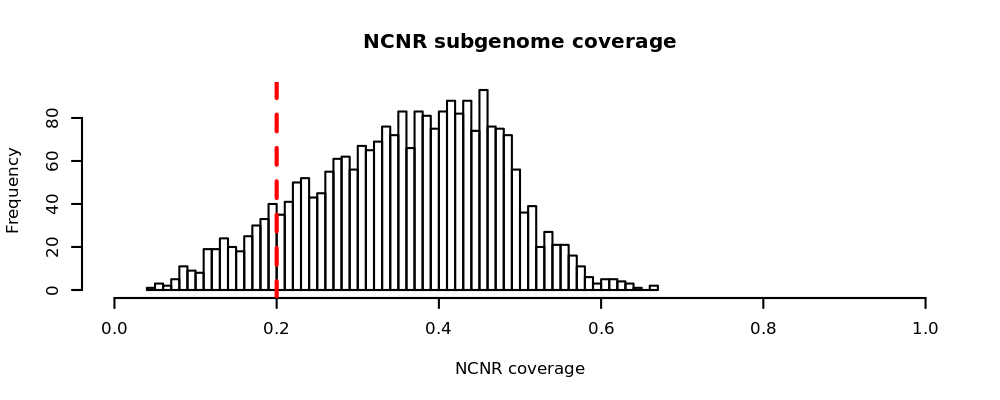

In [102]:
%%R -w 5 -h 2 --units in -r 200
rm(data)
data = read.csv("Intersects_1Mb.csv", header = TRUE)

# remove windows with gaps
sum(data$NCount>0)
data=data[data$NCount==0,] 

par(mfrow=c(1,1), cex=0.5)
hist(1-data$InverseNCNRCov, breaks = 50, xlim=c(0,1), main = 'NCNR subgenome coverage', xlab = 'NCNR coverage')
abline(v=0.2, col='red', lty=2, lwd=2)
sum((1-data$InverseNCNRCov)<0.2)


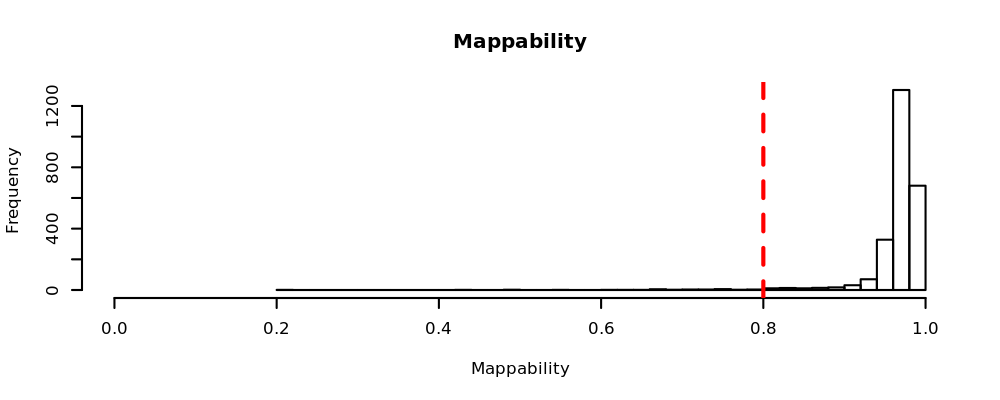

In [103]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
hist(data$Mapability, breaks = 50, xlim=c(0,1), main = 'Mappability', xlab = 'Mappability')
abline(v=0.8, col='red', lty=2, lwd=2)
sum(data$Mapability<0.8)

# filter out windows with low NCNR coverage and/or low mappability
data=data[(1-data$InverseNCNRCov)>=0.2,]
data=data[data$Mapability>=0.8,]

- **Fix variables measured only in NCNR subgenome**
Divide for NCNR coverage instead that for 1Mb.

Variables measured in NCNR: G4Cov, WeightedScore, APhasedCov, InvertedCov, DirectCov, ZCov, MirroCov, SGDPCov, High1kGCov, DiverCov, DNMCov, SingletonsCov.

In [104]:
%%R
data$G4Cov=data$G4Cov/(1-data$InverseNCNRCov)
data$WeightedScore=data$WeightedScore/(1-data$InverseNCNRCov)
data$APhasedCov=data$APhasedCov/(1-data$InverseNCNRCov)
data$InvertCov=data$InvertCov/(1-data$InverseNCNRCov)
data$DirectCov=data$DirectCov/(1-data$InverseNCNRCov)
data$ZCov=data$ZCov/(1-data$InverseNCNRCov)
data$MirrorCov=data$MirrorCov/(1-data$InverseNCNRCov)
data$SGDPCov=data$SGDPCov/(1-data$InverseNCNRCov)
data$high1kGCov=data$high1kGCov/(1-data$InverseNCNRCov)
data$DiverCov=data$DiverCov/(1-data$InverseNCNRCov)
data$DNMCov=data$DNMCov/(1-data$InverseNCNRCov)
data$DNMCov=data$SingletonsCov/(1-data$InverseNCNRCov)

- **Remove 12 outliers**
3 windows with no G4, 1 window with large InvertCov, 1 with large MirrorCov, 8 windows with small RNA_polIII, 1 with large H2AFZ, 1 with large H3K79me2

In [105]:
%%R
data = data[data$WeightedScore != 0,]
data = data[data$InvertCov < 0.08,]
data = data[data$MirrorCov < 0.05,]
data = data[data$RNA_pollII > 0.001,]
data = data[data$H2AFZ <10,]
data = data[data$H3K79me2 <30,]

#### Transform variables with skewed distribution

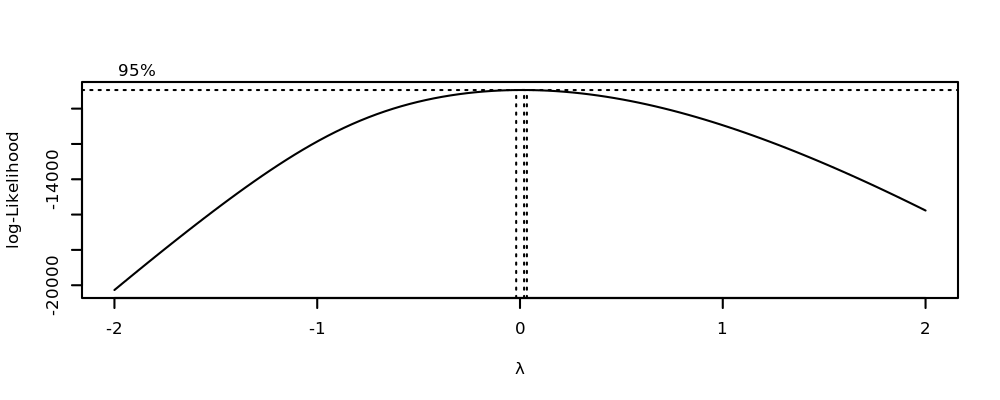

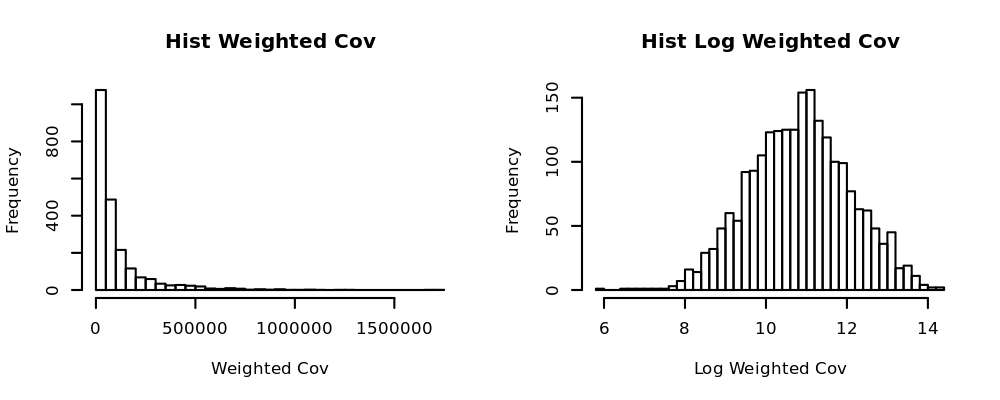

In [106]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$WeightedScore+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$WeightedScore, breaks = 50, main = "Hist Weighted Cov", xlab = "Weighted Cov")
hist(log(data$WeightedScore+1e-6), breaks = 50, main = "Hist Log Weighted Cov", xlab = "Log Weighted Cov")

data$WeightedScore=log(data$WeightedScore+1e-6)

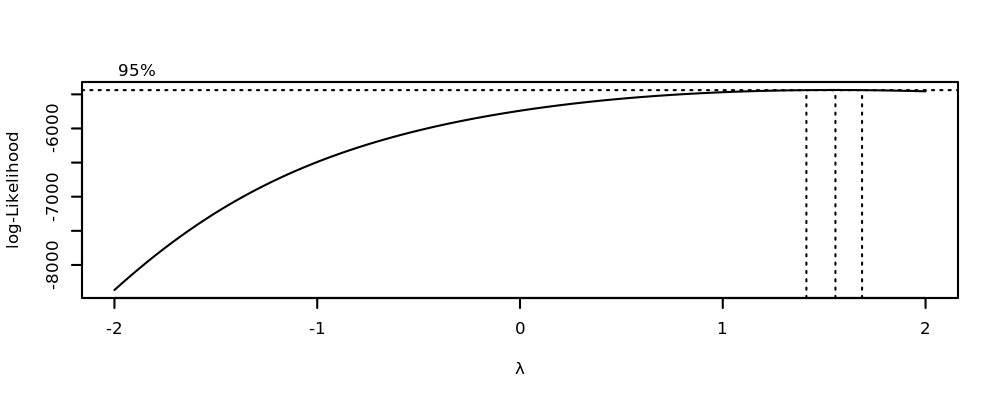

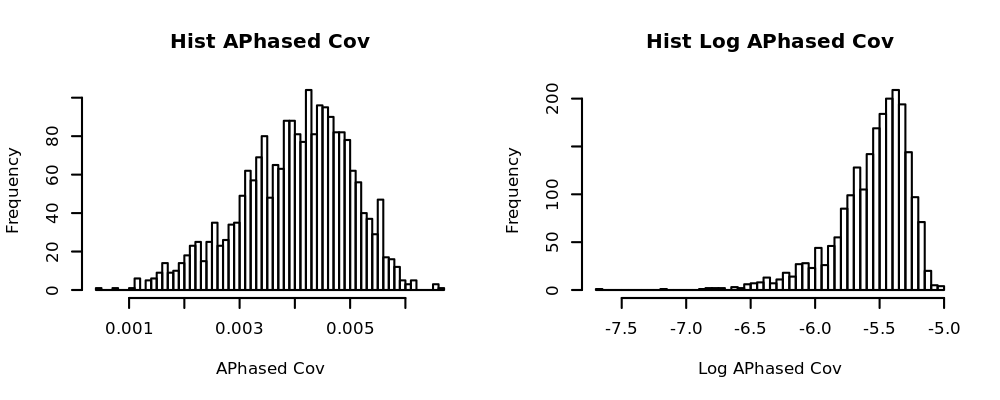

In [107]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$APhasedCov+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$APhasedCov, breaks = 50, main = "Hist APhased Cov", xlab = "APhased Cov")
hist(log(data$APhasedCov+1e-6), breaks = 50, main = "Hist Log APhased Cov", xlab = "Log APhased Cov")

# no need to transform, but changing the scale because it's too different from the other features
data$APhasedCov=data$APhasedCov*1000

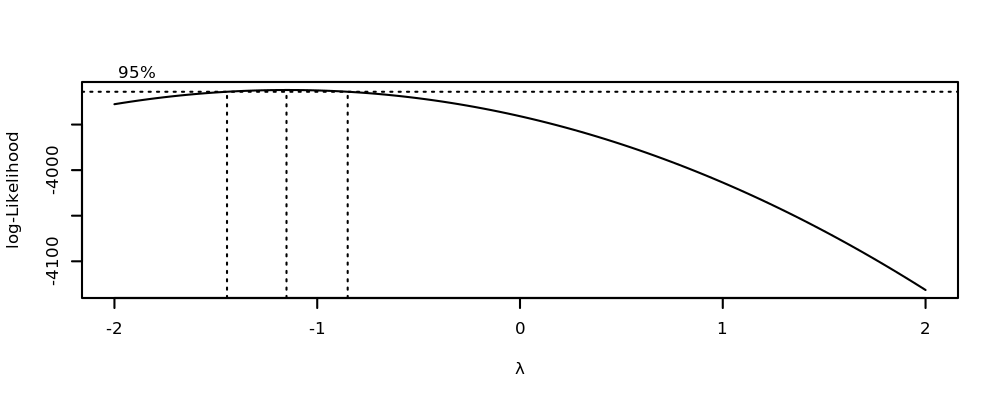

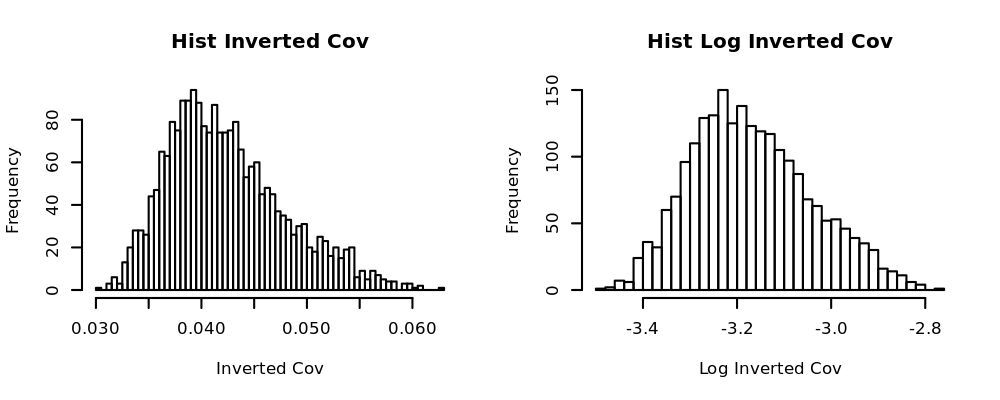

In [108]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$InvertCov+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$InvertCov, breaks = 50, main = "Hist Inverted Cov", xlab = "Inverted Cov")
hist(log(data$InvertCov+1e-6), breaks = 50, main = "Hist Log Inverted Cov", xlab = "Log Inverted Cov")

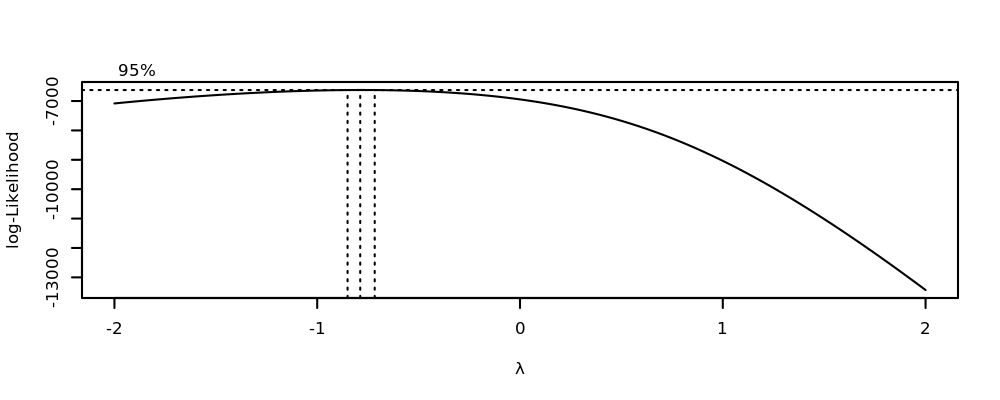

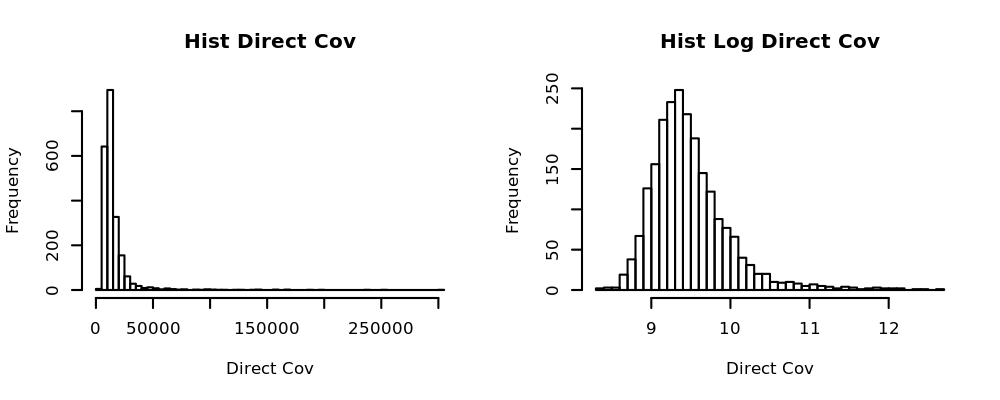

In [109]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
data$DirectCov=data$DirectCov*1000000/(1-data$InverseNCNRCov)
boxcox(I(data$DirectCov+0.1)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$DirectCov, breaks = 50, main = "Hist Direct Cov", xlab = "Direct Cov")
hist(log(data$DirectCov+0.1), breaks = 50, main = "Hist Log Direct Cov", xlab = "Direct Cov")
data$DirectCov=log(data$DirectCov+0.1)

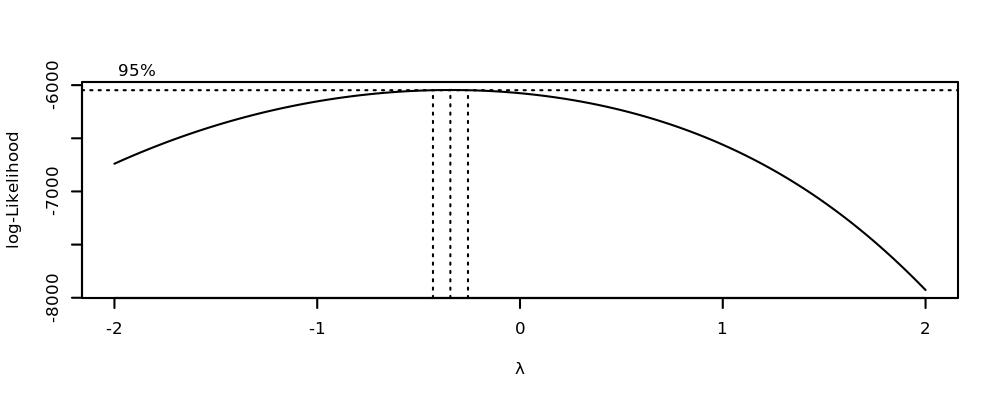

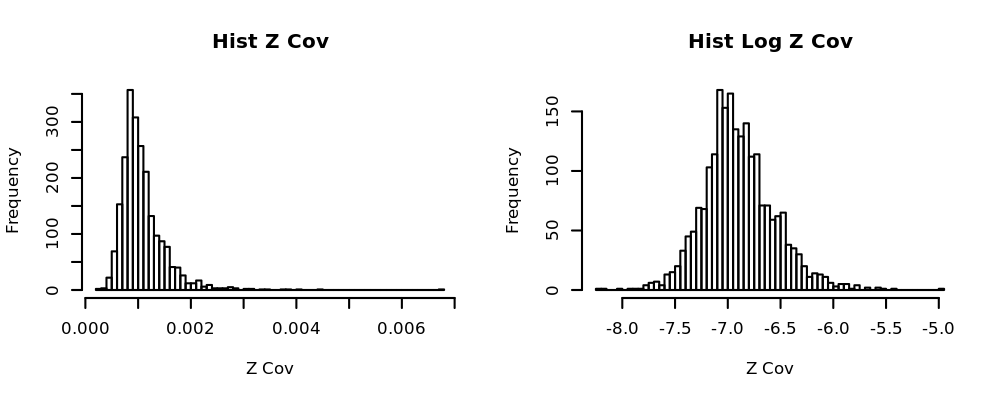

In [110]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$ZCov+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$ZCov, breaks = 50, main = "Hist Z Cov", xlab = "Z Cov")
hist(log(data$ZCov+1e-6), breaks = 50, main = "Hist Log Z Cov", xlab = "Z Cov")

data$ZCov=log(data$ZCov+1e-6)

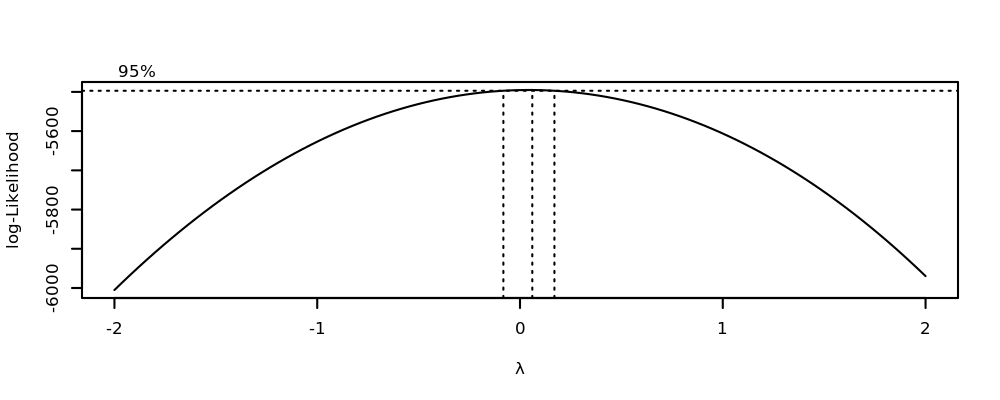

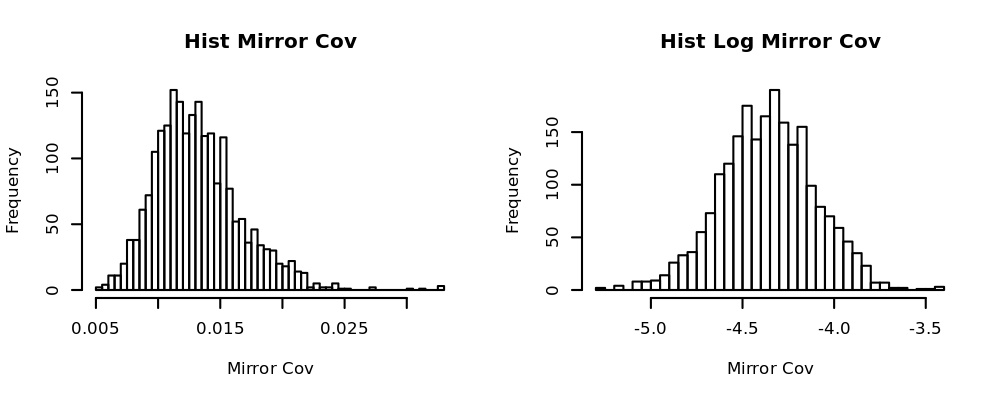

In [111]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$MirrorCov+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$MirrorCov, breaks = 50, main = "Hist Mirror Cov", xlab = "Mirror Cov")
hist(log(data$MirrorCov+1e-6), breaks = 50, main = "Hist Log Mirror Cov", xlab = "Mirror Cov")

data$MirrorCov=log(data$MirrorCov+1e-6)

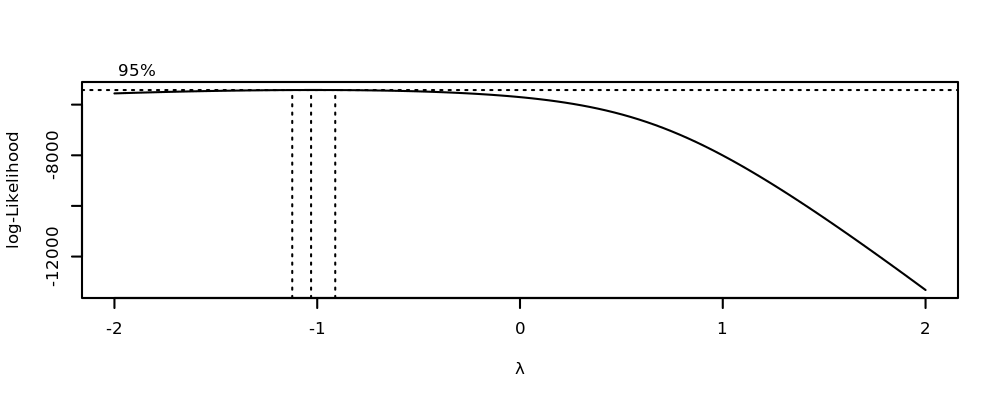

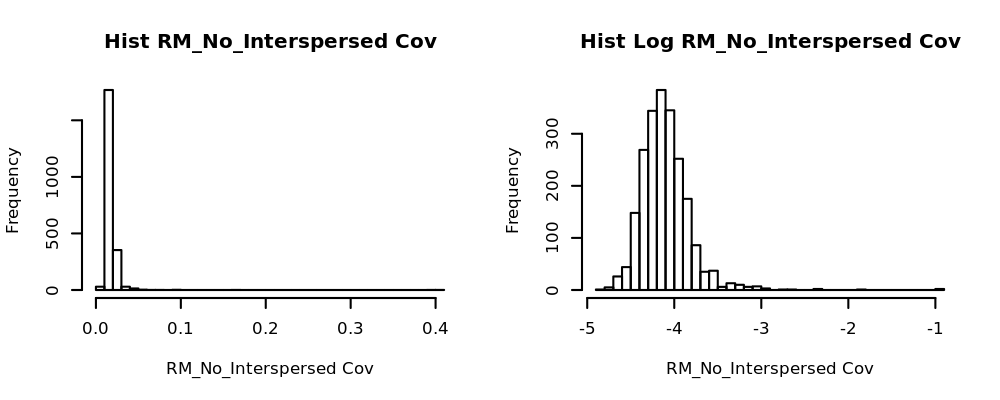

In [112]:
%%R -w 5 -h 2 --units in -r 200
#THIS IS NOT CURRENTLY USED. DELETE?
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$RM_No_InterspersedCov+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$RM_No_InterspersedCov, breaks = 50, main = "Hist RM_No_Interspersed Cov", xlab = "RM_No_Interspersed Cov")
hist(log(data$RM_No_InterspersedCov+1e-6), breaks = 50, main = "Hist Log RM_No_Interspersed Cov", xlab = "RM_No_Interspersed Cov")

data$RM_No_InterspersedCov=log(data$RM_No_InterspersedCov+1e-6)

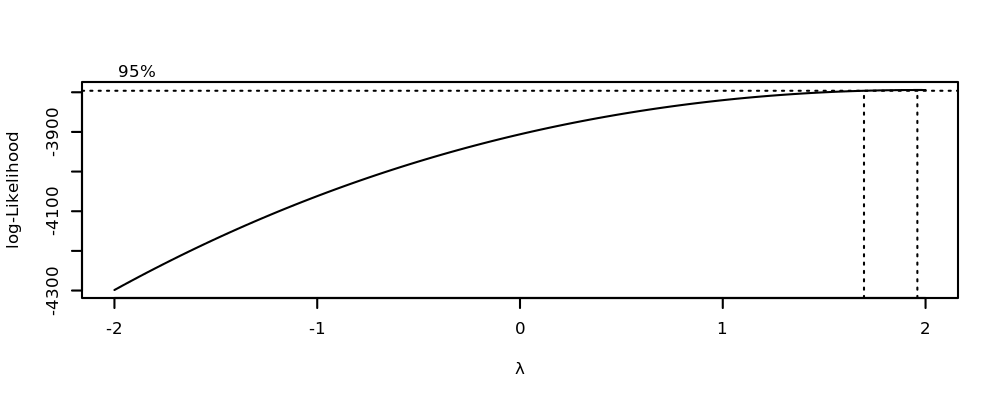

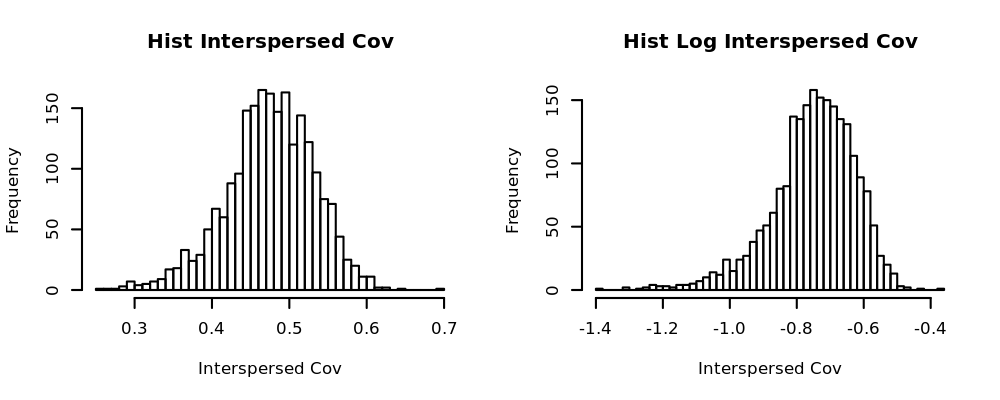

In [113]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$InterspersedCov+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$InterspersedCov, breaks = 50, main = "Hist Interspersed Cov", xlab = "Interspersed Cov")
hist(log(data$InterspersedCov+1e-6), breaks = 50, main = "Hist Log Interspersed Cov", xlab = "Interspersed Cov")

# no need to transform


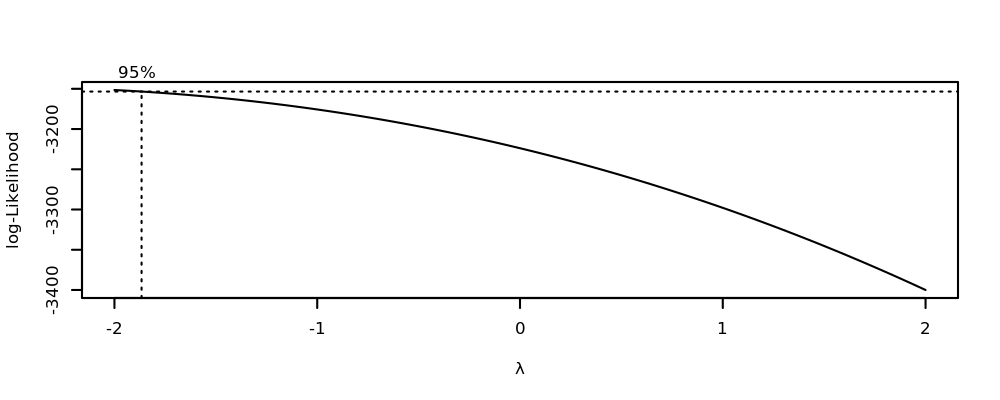

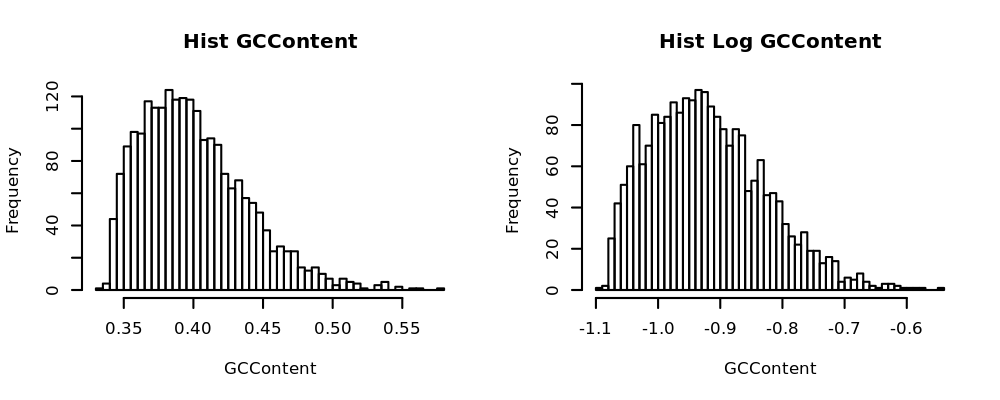

In [114]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$GCContent+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$GCContent, breaks = 50, main = "Hist GCContent", xlab = "GCContent")
hist(log(data$GCContent+1e-6), breaks = 50, main = "Hist Log GCContent", xlab = "GCContent")

# no need to transform


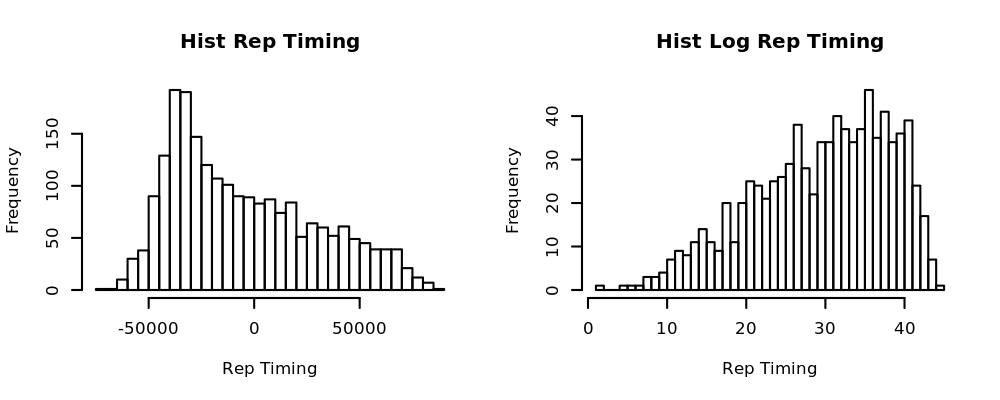

In [115]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,2), cex=0.5)
hist(data$RepTiming, breaks = 50, main = "Hist Rep Timing", xlab = "Rep Timing")
hist((data$RepTiming)^(1/3), breaks = 50, main = "Hist Log Rep Timing", xlab = "Rep Timing")

# no need to transform, but changing the scale because it's too different from the other features
data$RepTiming=data$RepTiming/10000


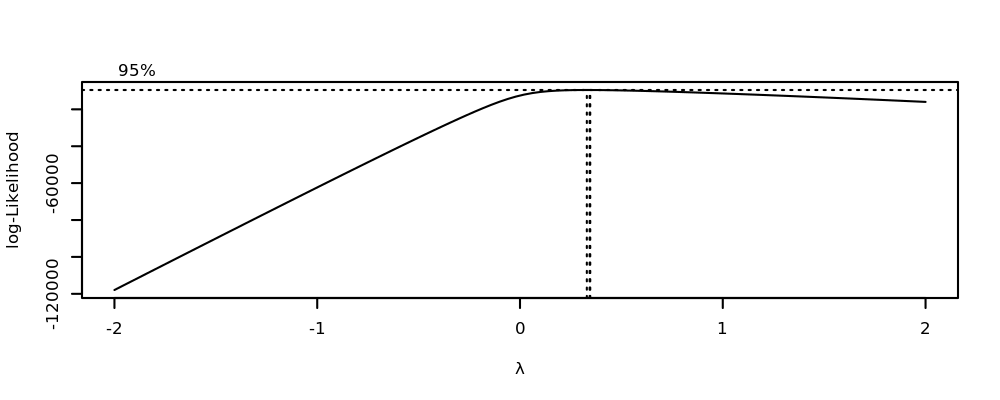

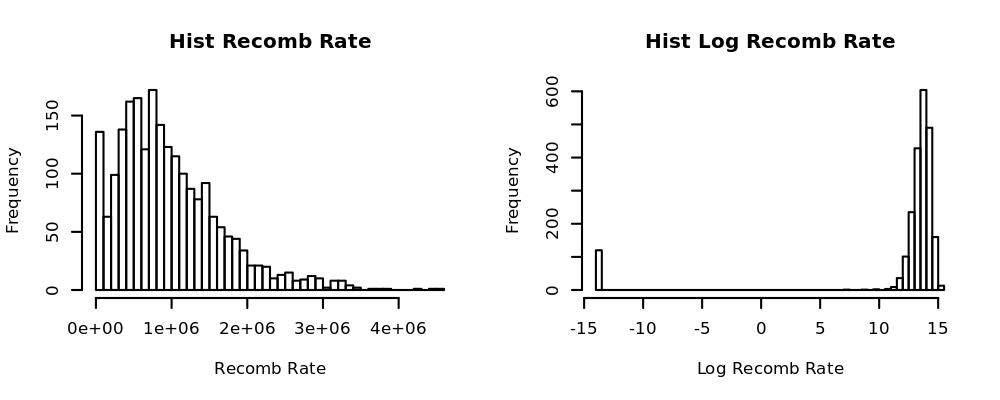

In [116]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$RecombRate+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$RecombRate, breaks = 50, main = "Hist Recomb Rate", xlab = "Recomb Rate")
hist(log(data$RecombRate+1e-6), breaks = 50, main = "Hist Log Recomb Rate", xlab = "Log Recomb Rate")

# no need to transform, but changing the scale because it's too different from the other features
data$RecombRate=data$RecombRate/1000000

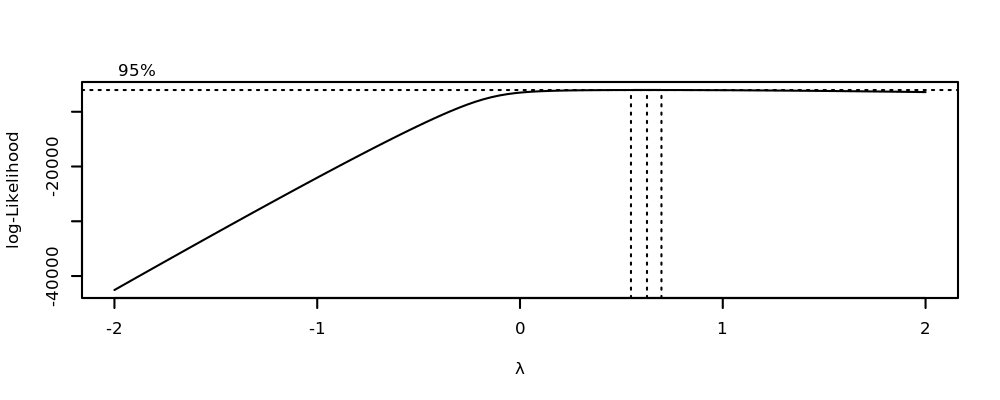

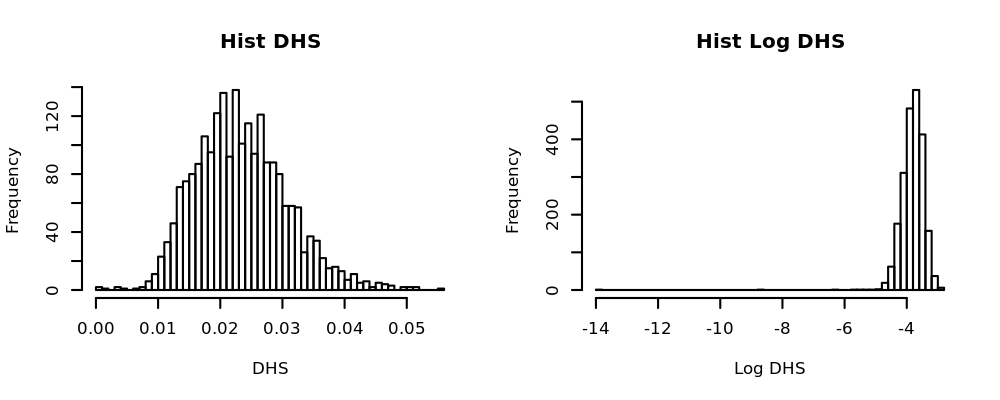

In [117]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$DHS+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$DHS, breaks = 50, main = "Hist DHS", xlab = "DHS")
hist(log(data$DHS+1e-6), breaks = 50, main = "Hist Log DHS", xlab = "Log DHS")

# no need to transform

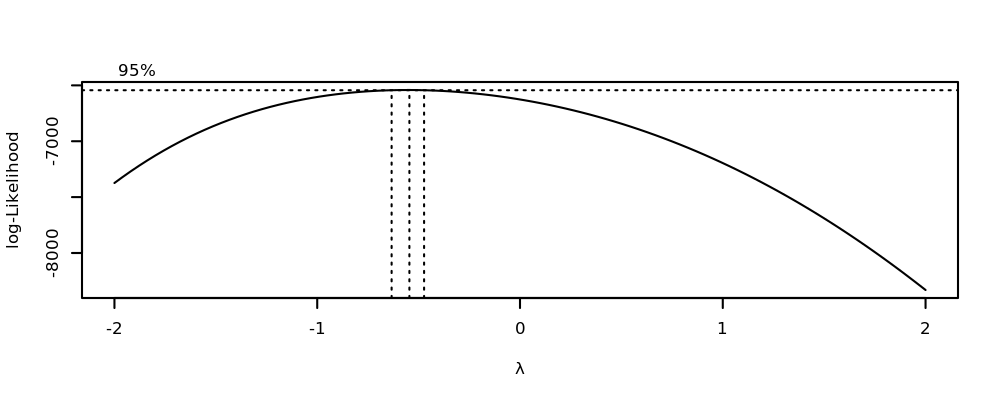

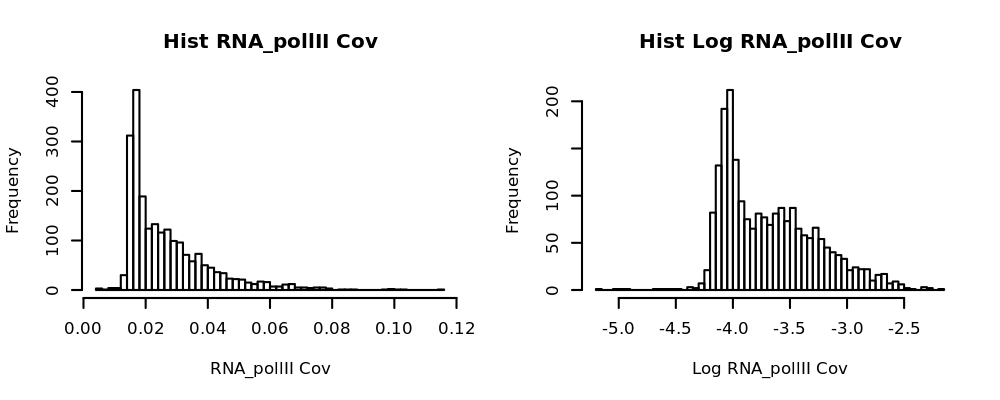

In [118]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$RNA_pollII+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$RNA_pollII, breaks = 50, main = "Hist RNA_pollII Cov", xlab = "RNA_pollII Cov")
hist(log(data$RNA_pollII+1e-3), breaks = 50, main = "Hist Log RNA_pollII Cov", xlab = "Log RNA_pollII Cov")

data$RNA_pollII=log(data$RNA_pollII+1e-6)

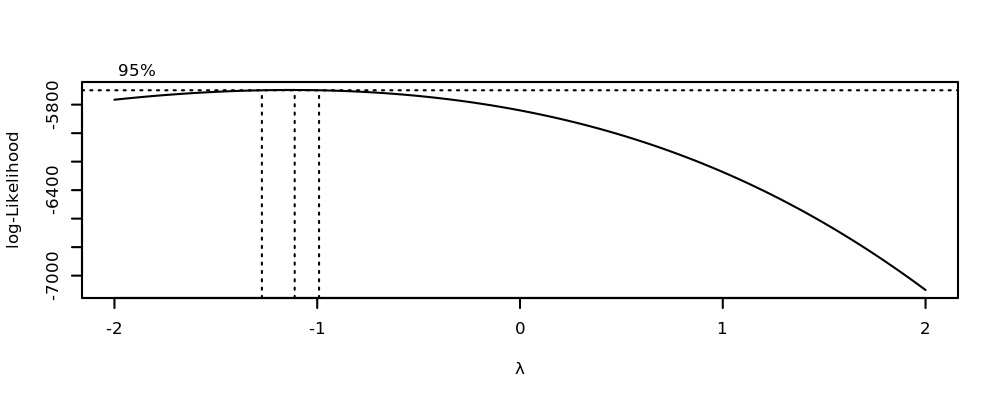

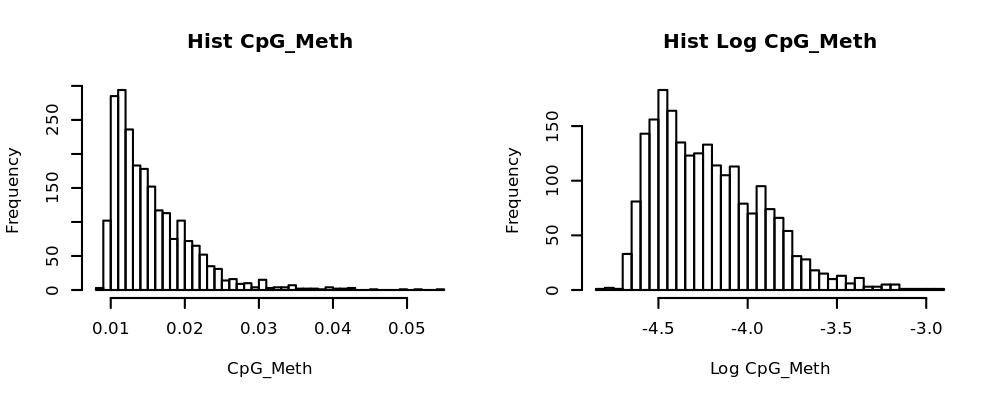

In [119]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$CpG_Meth+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$CpG_Meth, breaks = 50, main = "Hist CpG_Meth", xlab = "CpG_Meth")
hist(log(data$CpG_Meth+1e-6), breaks = 50, main = "Hist Log CpG_Meth", xlab = "Log CpG_Meth")

data$CpG_Meth = log(data$CpG_Meth+1e-6)

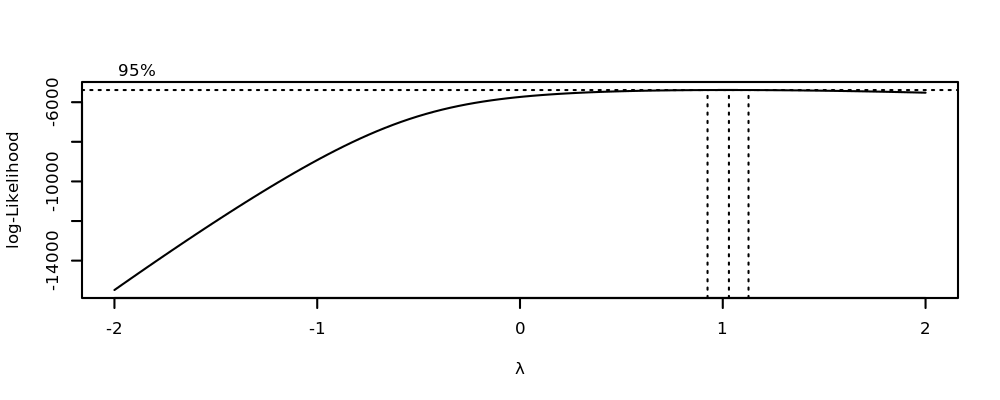

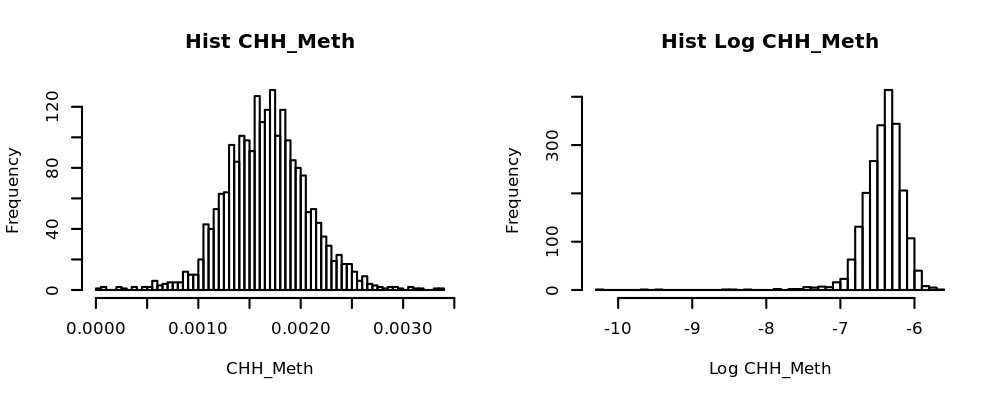

In [120]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$CHH_Meth+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$CHH_Meth, breaks = 50, main = "Hist CHH_Meth", xlab = "CHH_Meth")
hist(log(data$CHH_Meth+1e-6), breaks = 50, main = "Hist Log CHH_Meth", xlab = "Log CHH_Meth")

# no need to transform, but changing the scale because it's too different from the other features
data$CHH_Meth=data$CHH_Meth*1000

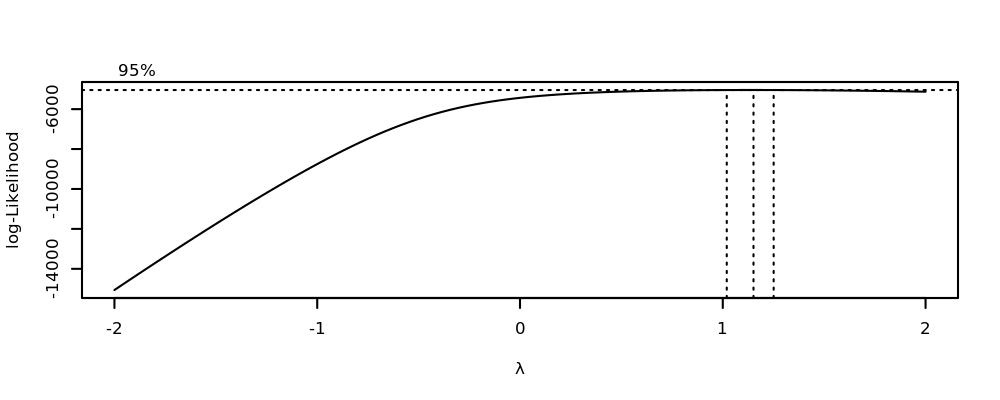

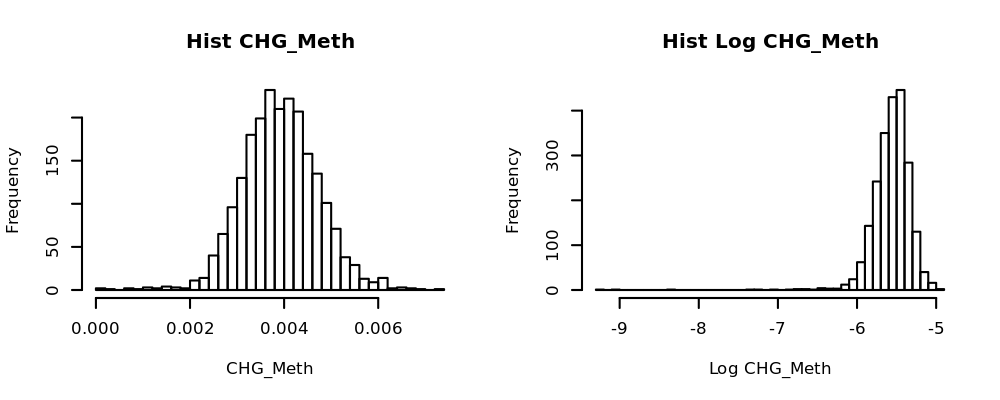

In [121]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$CHG_Meth+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$CHG_Meth, breaks = 50, main = "Hist CHG_Meth", xlab = "CHG_Meth")
hist(log(data$CHG_Meth+1e-6), breaks = 50, main = "Hist Log CHG_Meth", xlab = "Log CHG_Meth")

# no need to transform, but changing the scale because it's too different from the other features
data$CHH_Meth=data$CHG_Meth*100

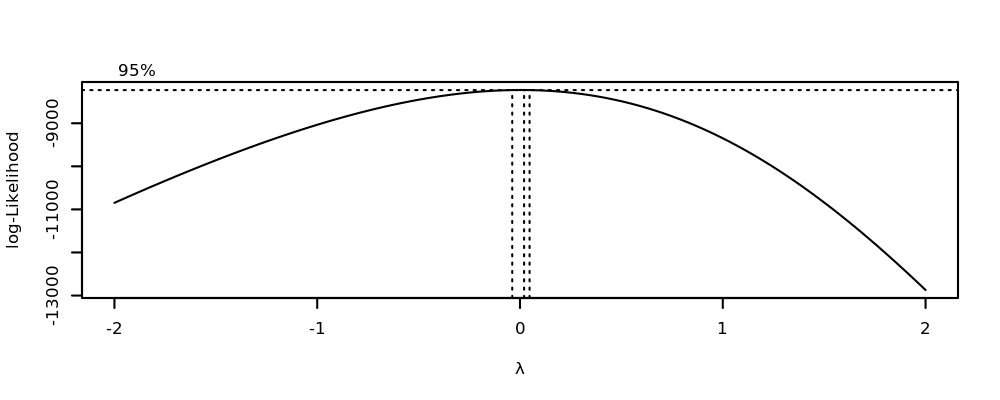

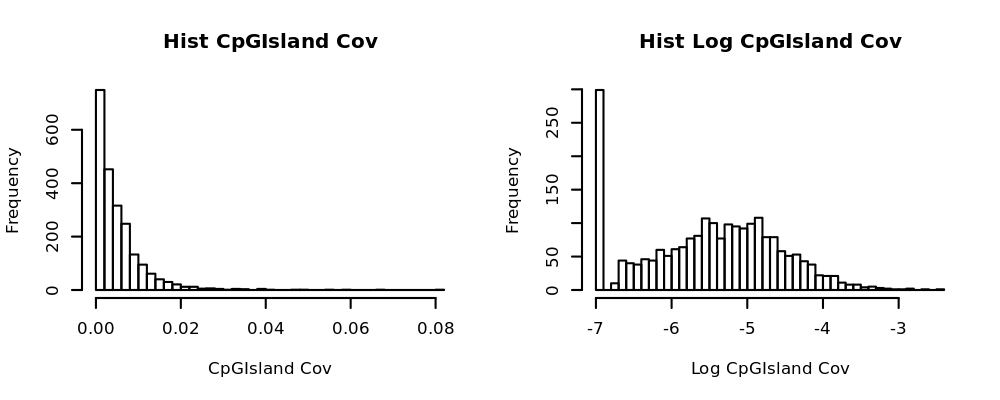

In [122]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$CpGIsland+1e-3)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$CpGIsland, breaks = 50, main = "Hist CpGIsland Cov", xlab = "CpGIsland Cov")
hist(log(data$CpGIsland+1e-3), breaks = 50, main = "Hist Log CpGIsland Cov", xlab = "Log CpGIsland Cov")

data$CpGIsland=log(data$CpGIsland+1e-3)

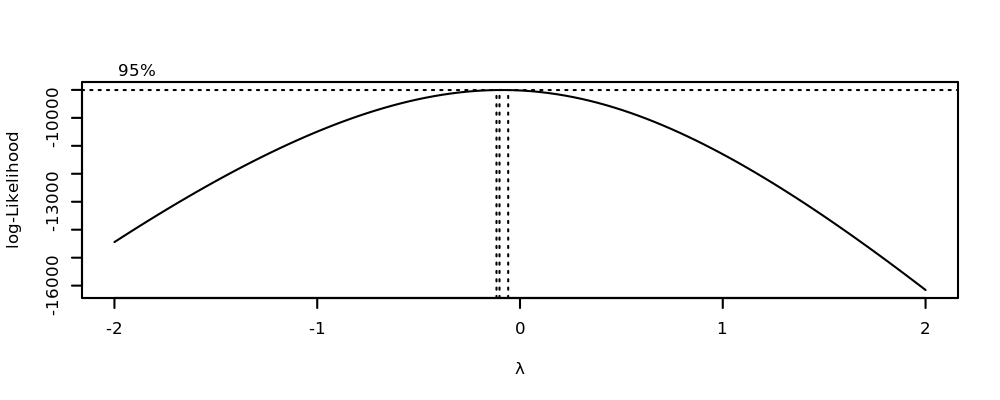

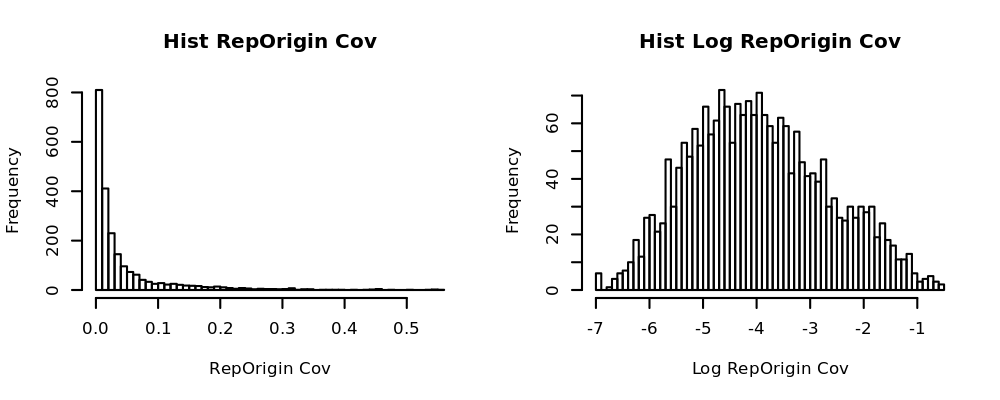

In [123]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$RepOrigin+1e-3)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$RepOrigin, breaks = 50, main = "Hist RepOrigin Cov", xlab = "RepOrigin Cov")
hist(log(data$RepOrigin+1e-3), breaks = 50, main = "Hist Log RepOrigin Cov", xlab = "Log RepOrigin Cov")

data$RepOrigin=log(data$RepOrigin+1e-3)

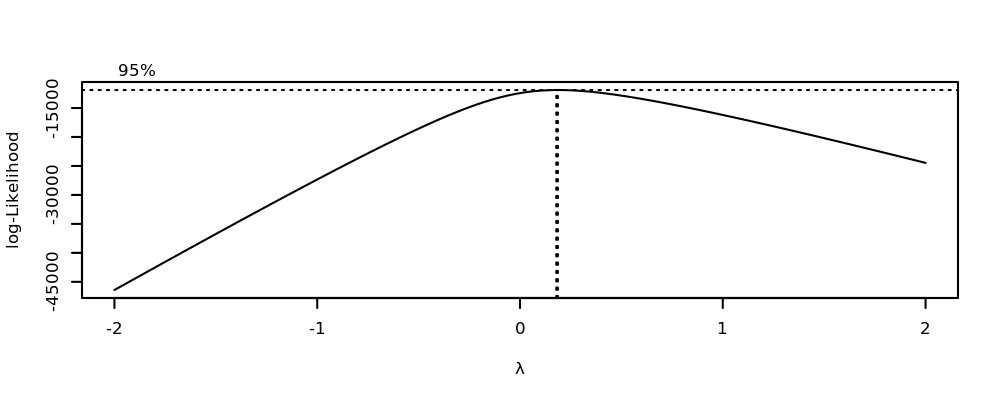

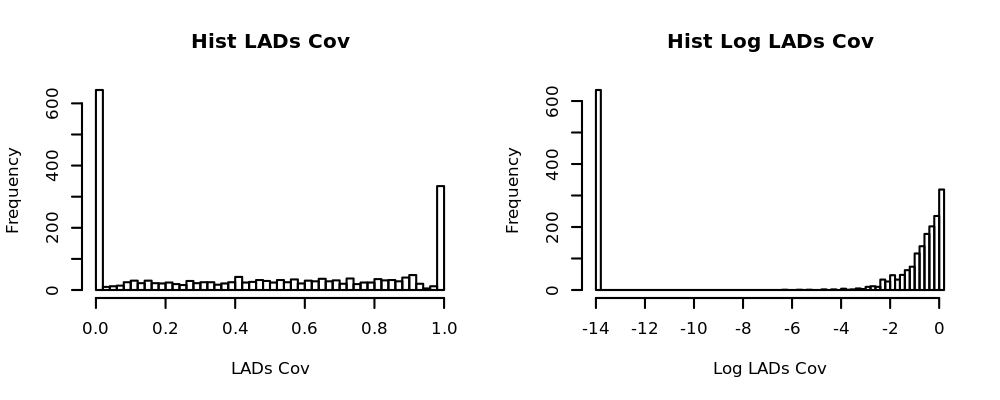

In [124]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$LADs+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$LADs, breaks = 50, main = "Hist LADs Cov", xlab = "LADs Cov")
hist(log(data$LADs+1e-6), breaks = 50, main = "Hist Log LADs Cov", xlab = "Log LADs Cov")
# no need to transform

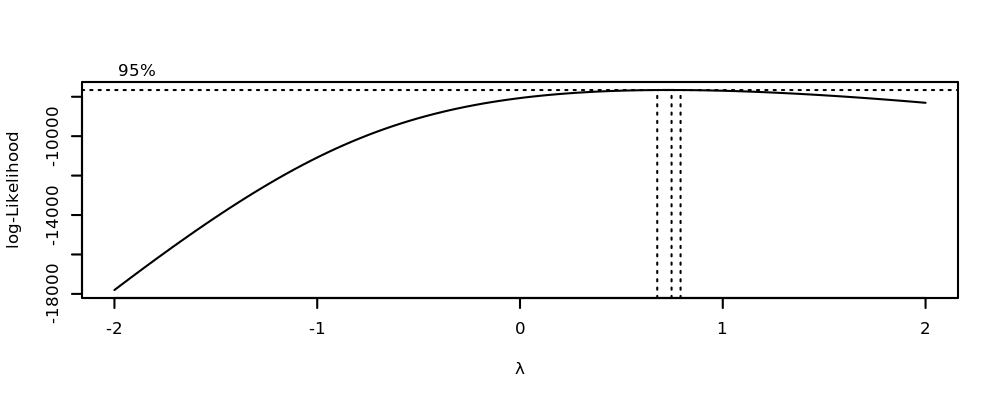

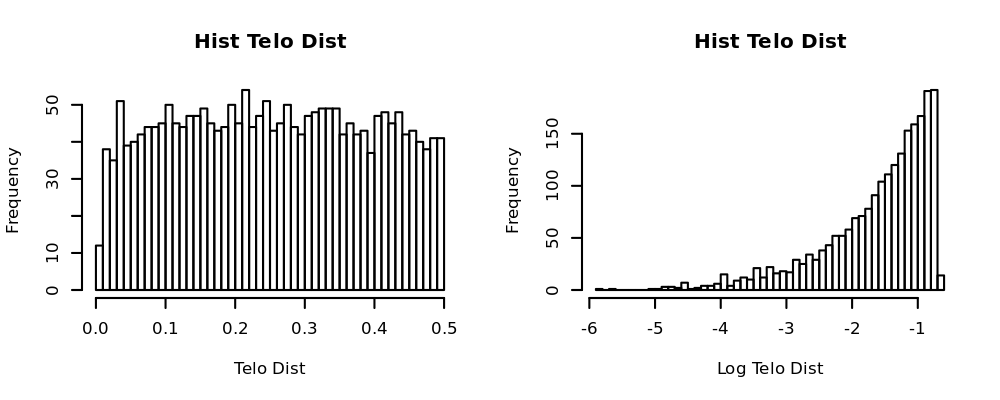

In [125]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$TeloDist+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$TeloDist, breaks = 50, main = "Hist Telo Dist", xlab = "Telo Dist")
hist(log(data$TeloDist+1e-6), breaks = 50, main = "Hist Telo Dist", xlab = "Log Telo Dist")

# no need to transform

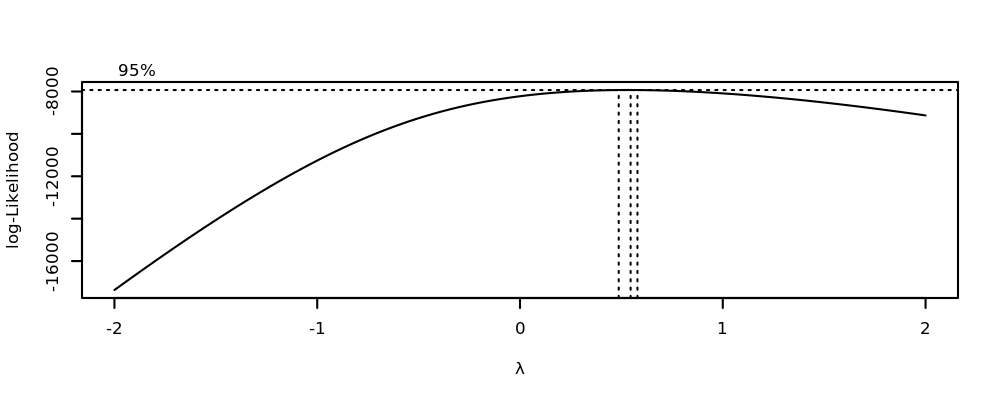

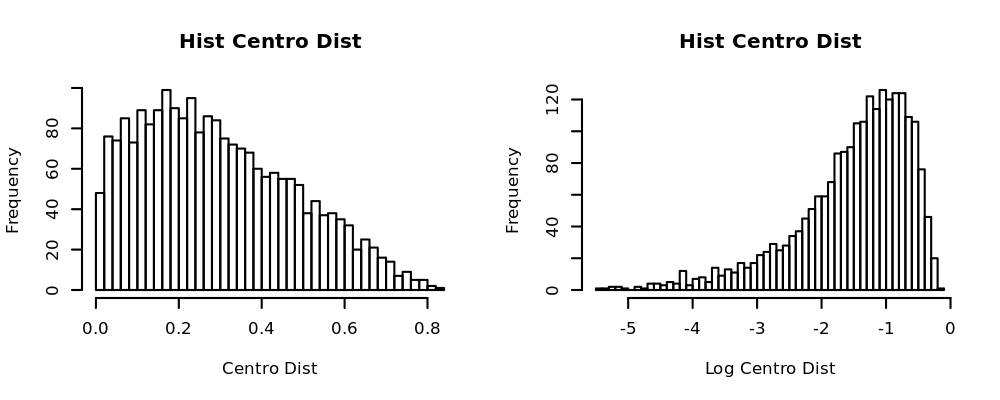

In [126]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$CentroDist+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$CentroDist, breaks = 50, main = "Hist Centro Dist", xlab = "Centro Dist")
hist(log(data$CentroDist+1e-6), breaks = 50, main = "Hist Centro Dist", xlab = "Log Centro Dist")

# no need to transform

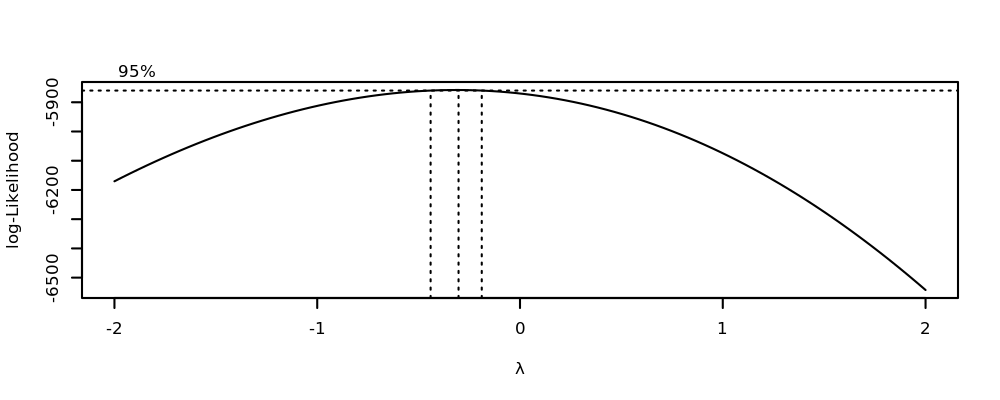

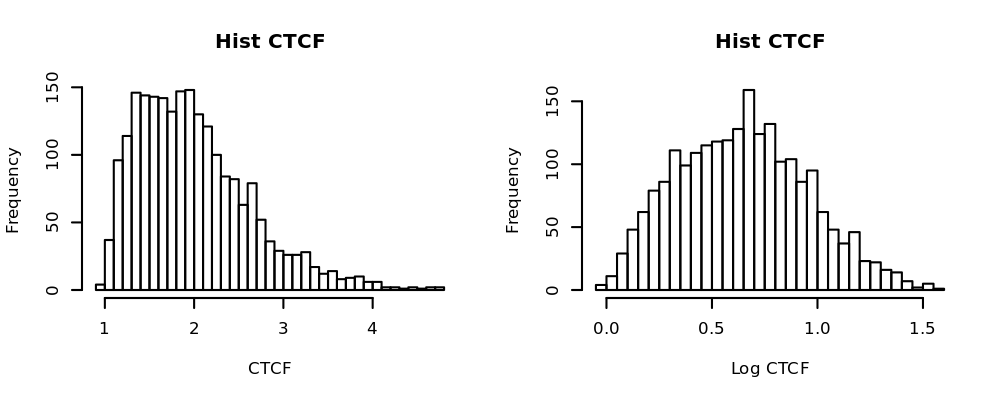

In [127]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$CTCF+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$CTCF, breaks = 50, main = "Hist CTCF", xlab = "CTCF")
hist(log(data$CTCF+1e-6), breaks = 50, main = "Hist CTCF", xlab = "Log CTCF")

data$CTCF=log(data$CTCF+1e-6)

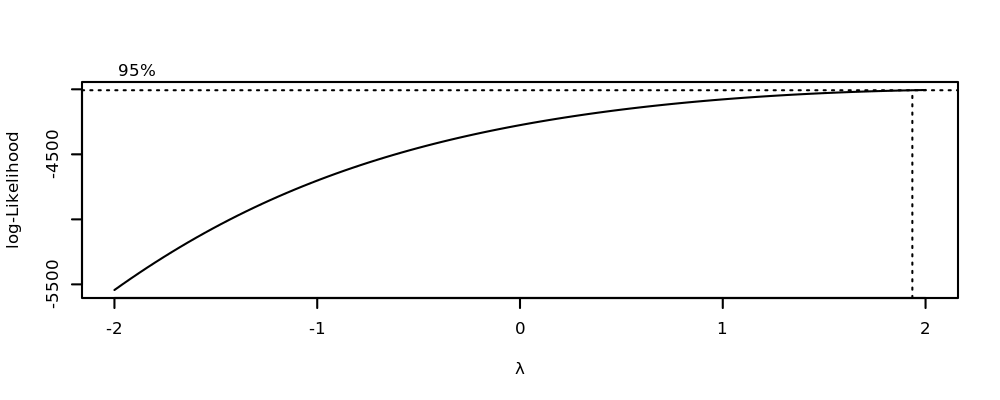

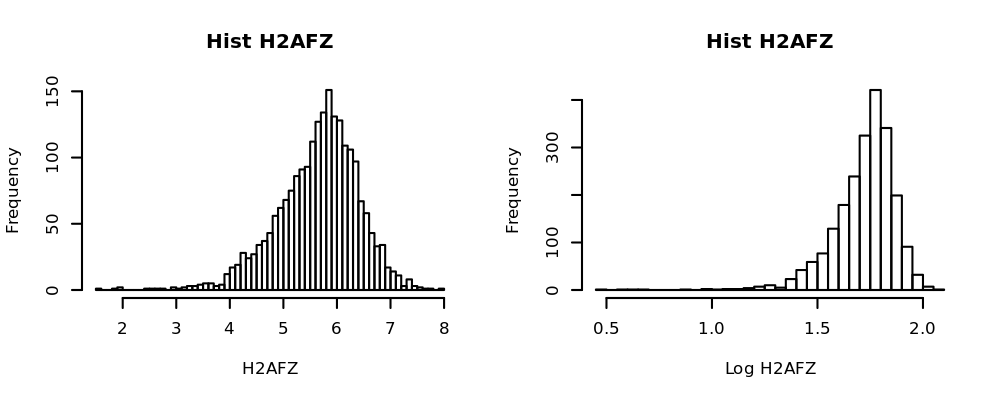

In [128]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H2AFZ+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H2AFZ, breaks = 50, main = "Hist H2AFZ", xlab = "H2AFZ")
hist(log(data$H2AFZ+1e-6), breaks = 50, main = "Hist H2AFZ", xlab = "Log H2AFZ")

# no need to transform

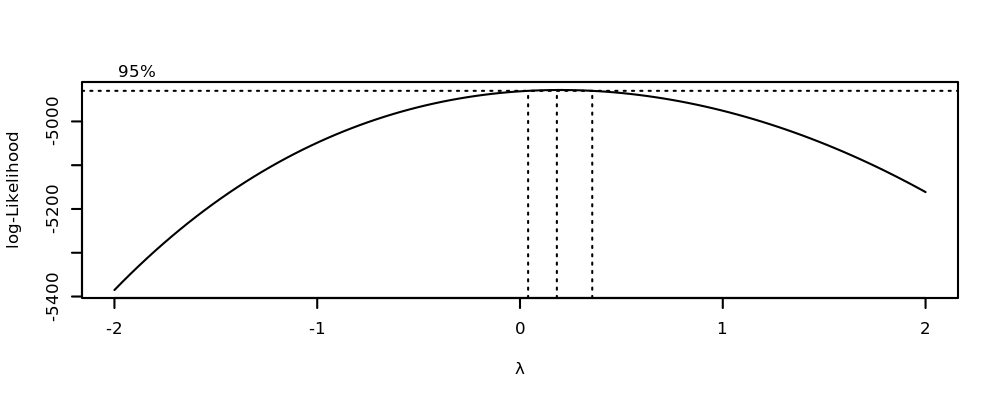

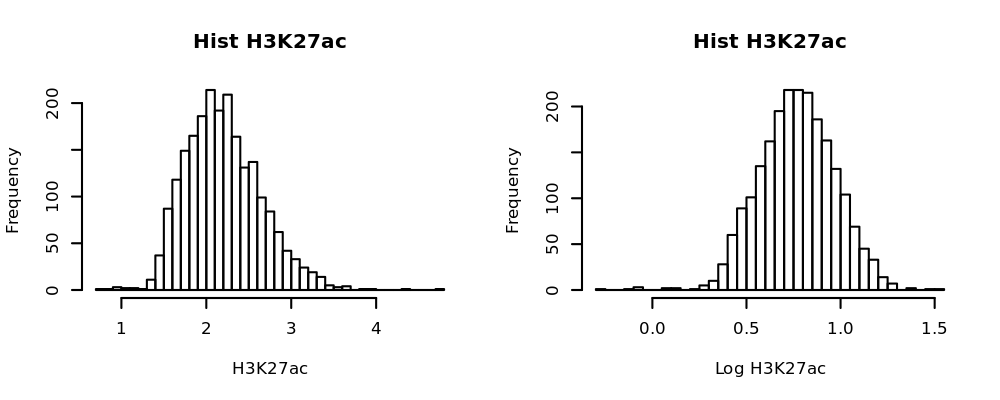

In [129]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H3K27ac+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H3K27ac, breaks = 50, main = "Hist H3K27ac", xlab = "H3K27ac")
hist(log(data$H3K27ac+1e-6), breaks = 50, main = "Hist H3K27ac", xlab = "Log H3K27ac")

# no need to transform

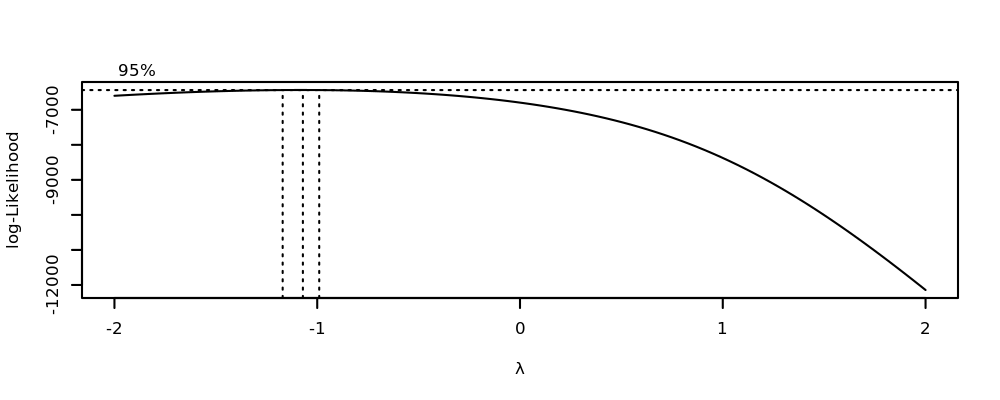

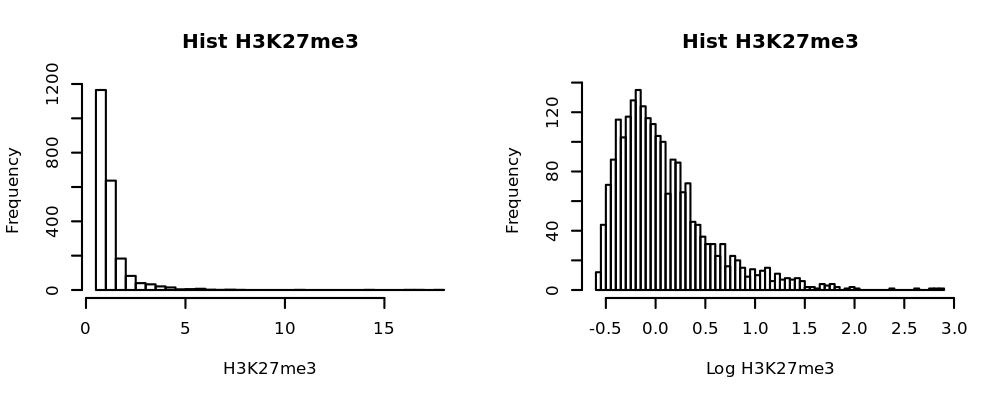

In [130]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H3K27me3+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H3K27me3, breaks = 50, main = "Hist H3K27me3", xlab = "H3K27me3")
hist(log(data$H3K27me3+1e-6), breaks = 50, main = "Hist H3K27me3", xlab = "Log H3K27me3")

data$H3K27me3=log(data$H3K27me3+1e-6)

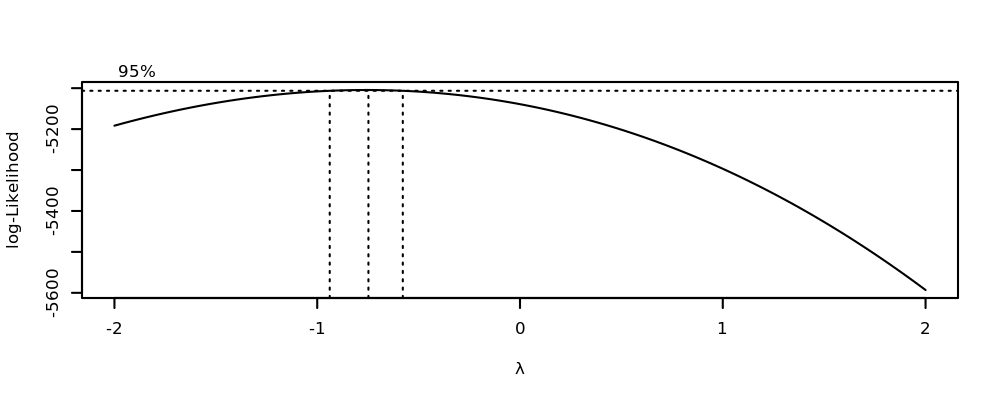

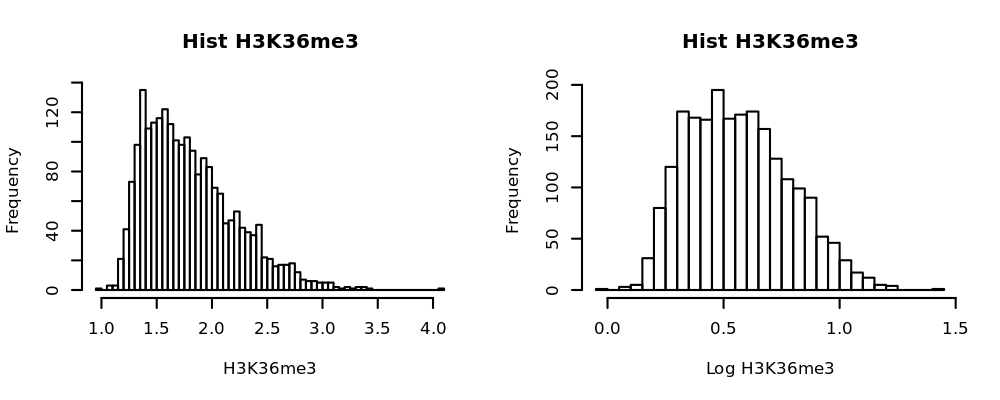

In [131]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H3K36me3+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H3K36me3, breaks = 50, main = "Hist H3K36me3", xlab = "H3K36me3")
hist(log(data$H3K36me3+1e-6), breaks = 50, main = "Hist H3K36me3", xlab = "Log H3K36me3")

data$H3K36me3=log(data$H3K36me3+1e-6)

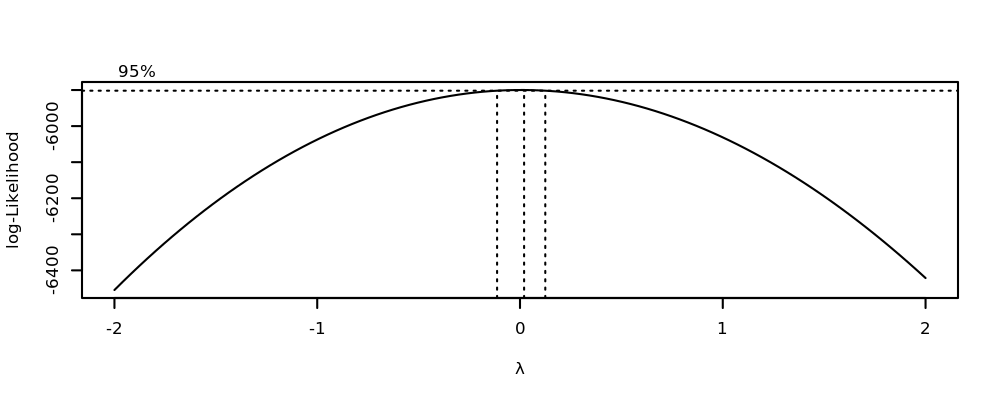

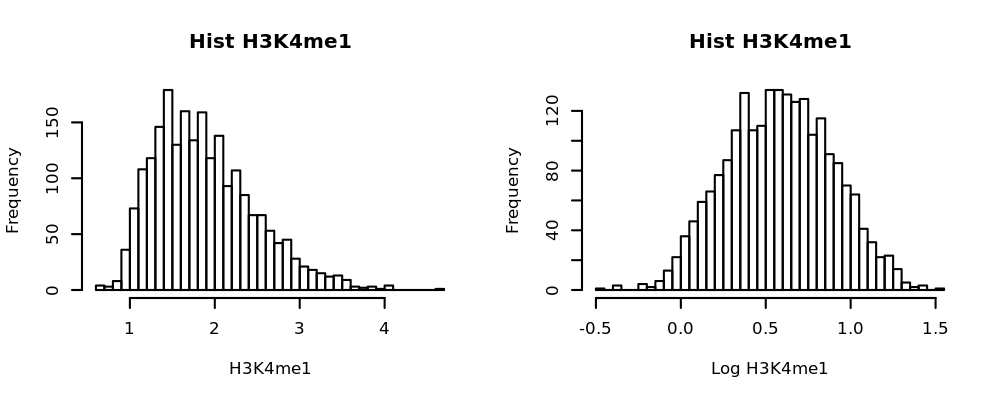

In [132]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H3K4me1+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H3K4me1, breaks = 50, main = "Hist H3K4me1", xlab = "H3K4me1")
hist(log(data$H3K4me1+1e-6), breaks = 50, main = "Hist H3K4me1", xlab = "Log H3K4me1")

data$H3K4me1 = log(data$H3K4me1+1e-6)

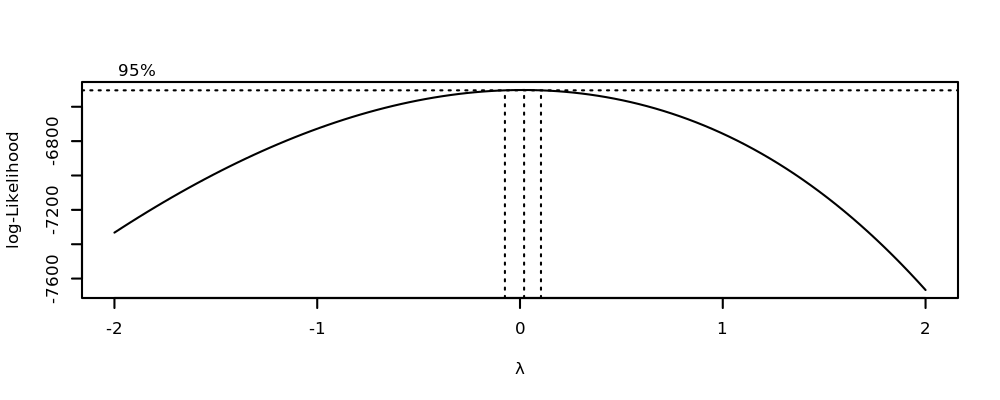

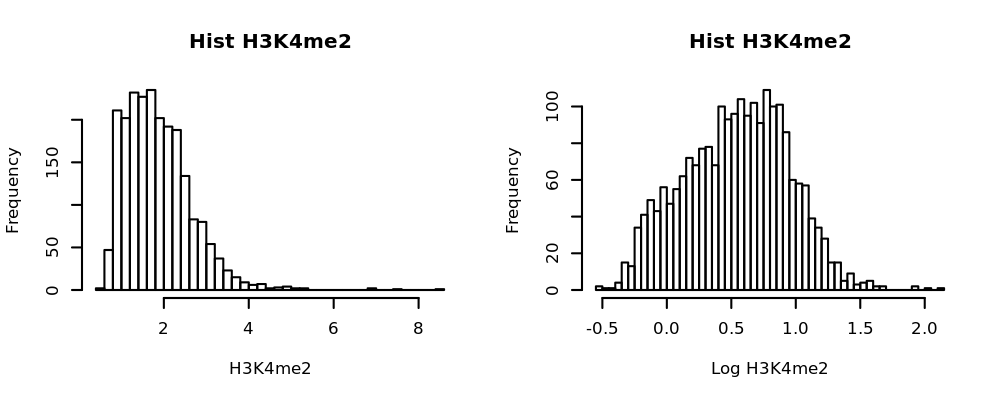

In [133]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H3K4me2+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H3K4me2, breaks = 50, main = "Hist H3K4me2", xlab = "H3K4me2")
hist(log(data$H3K4me2+1e-6), breaks = 50, main = "Hist H3K4me2", xlab = "Log H3K4me2")

data$H3K4me2=log(data$H3K4me2+1e-6)

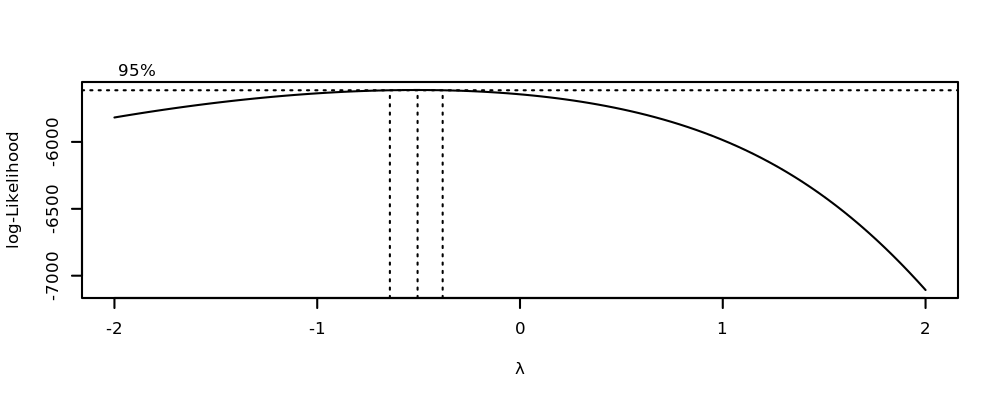

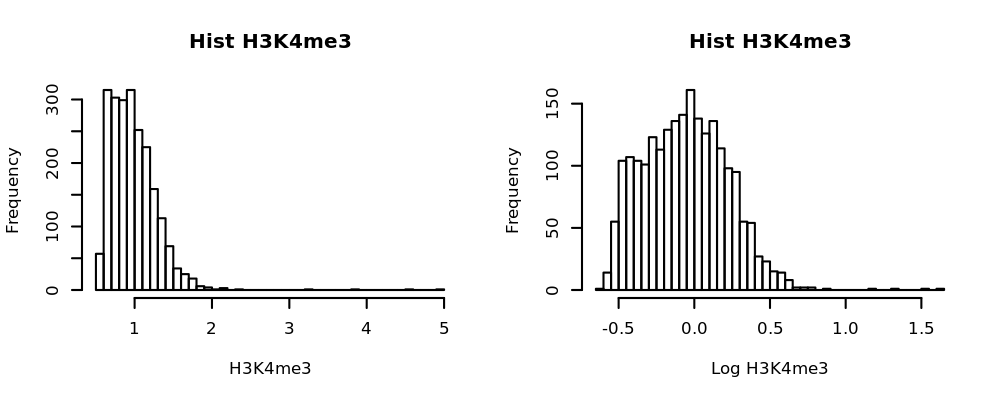

In [134]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H3K4me3+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H3K4me3, breaks = 50, main = "Hist H3K4me3", xlab = "H3K4me3")
hist(log(data$H3K4me3+1e-6), breaks = 50, main = "Hist H3K4me3", xlab = "Log H3K4me3")

data$H3K4me3=log(data$H3K4me3+1e-6)

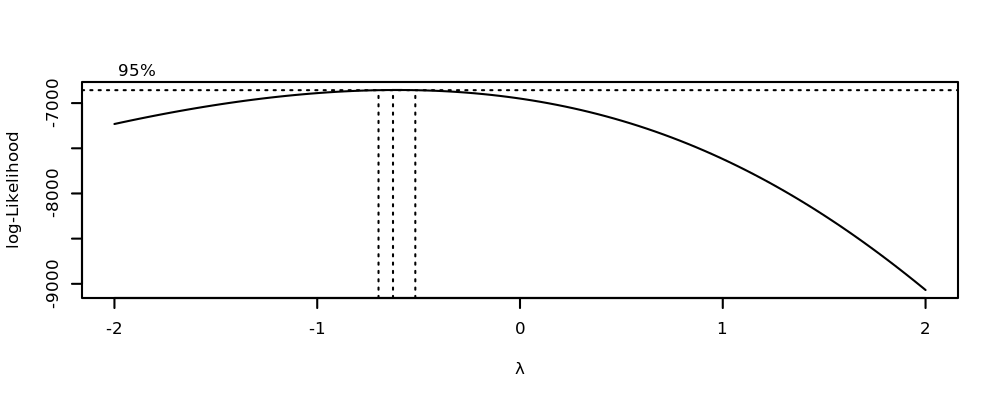

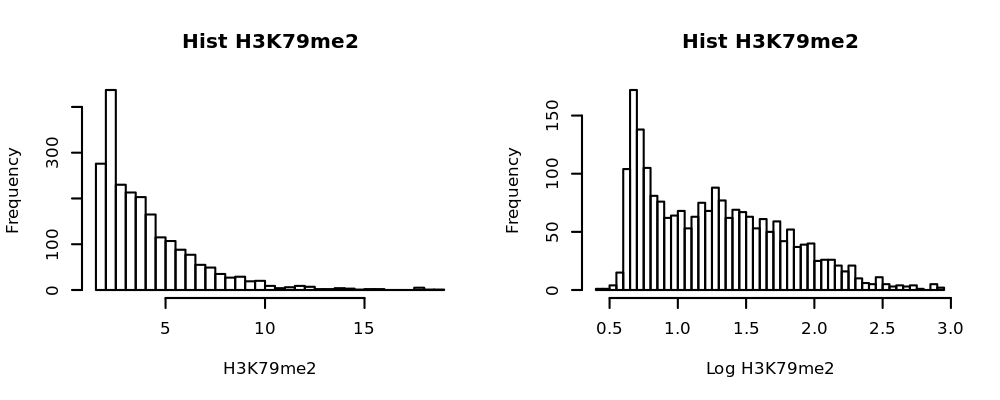

In [135]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H3K79me2+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H3K79me2, breaks = 50, main = "Hist H3K79me2", xlab = "H3K79me2")
hist(log(data$H3K79me2+1e-6), breaks = 50, main = "Hist H3K79me2", xlab = "Log H3K79me2")

data$H3K79me2=log(data$H3K79me2+1e-6)

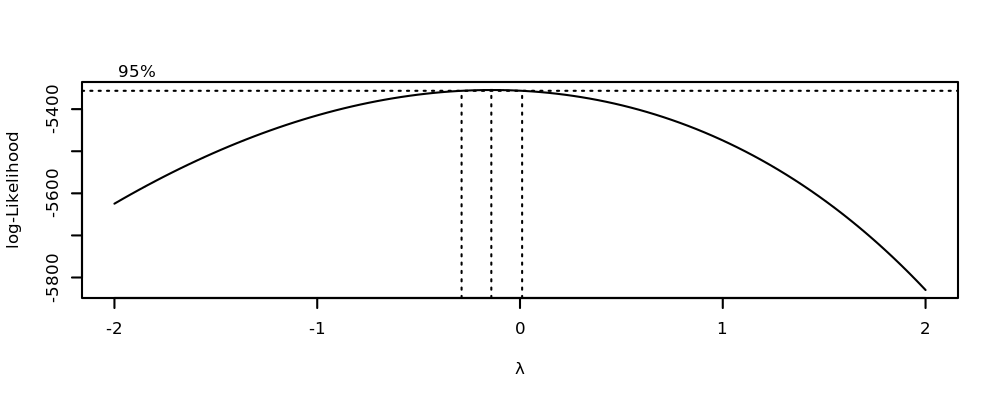

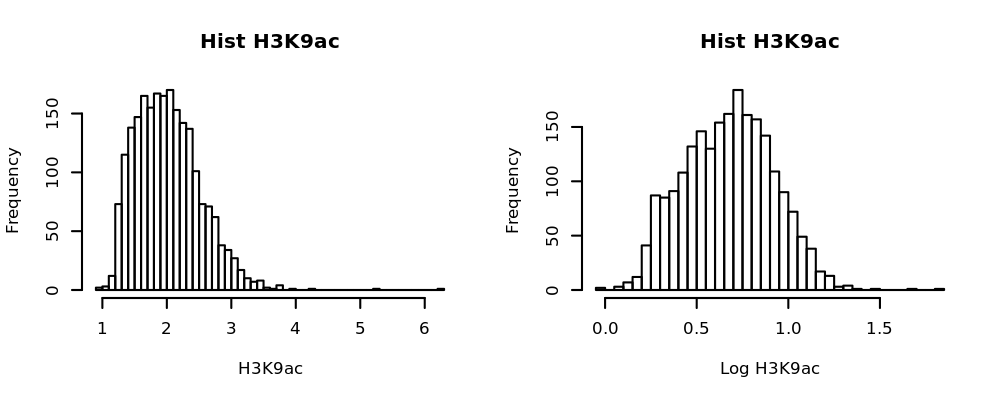

In [136]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H3K9ac+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H3K9ac, breaks = 50, main = "Hist H3K9ac", xlab = "H3K9ac")
hist(log(data$H3K9ac+1e-6), breaks = 50, main = "Hist H3K9ac", xlab = "Log H3K9ac")

data$H3K9ac=log(data$H3K9ac+1e-6)

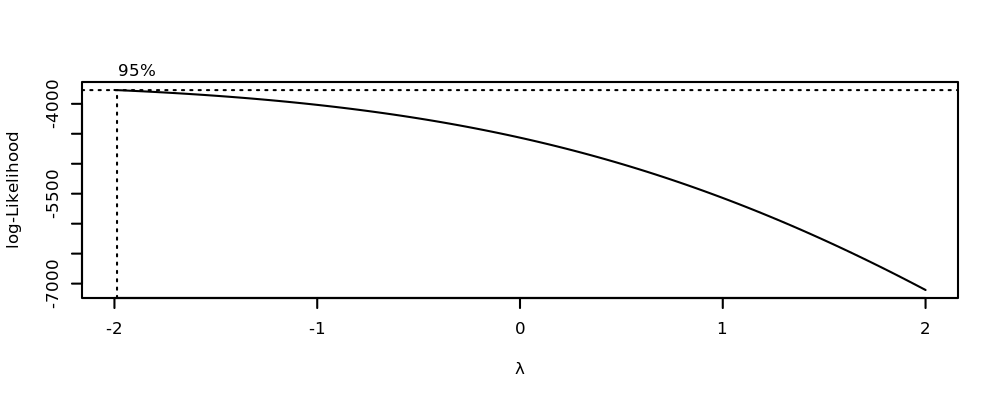

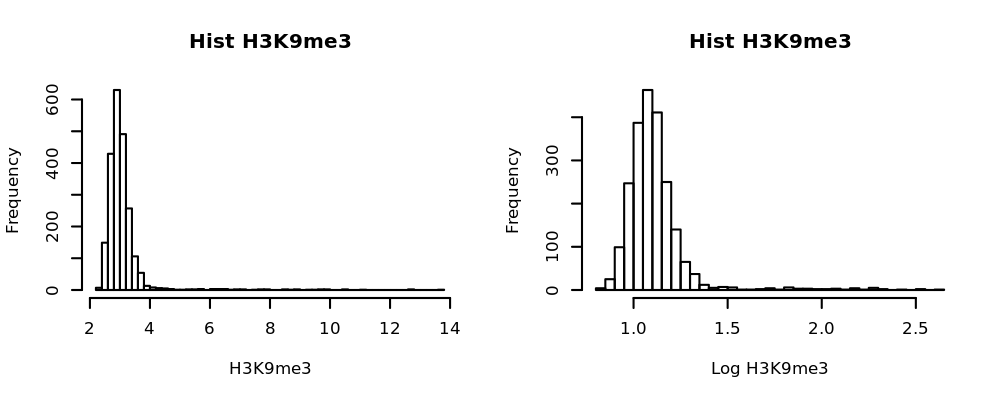

In [137]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H3K9me3+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H3K9me3, breaks = 50, main = "Hist H3K9me3", xlab = "H3K9me3")
hist(log(data$H3K9me3+1e-6), breaks = 50, main = "Hist H3K9me3", xlab = "Log H3K9me3")

data$H3K9me3=log(data$H3K9me3+1e-6)

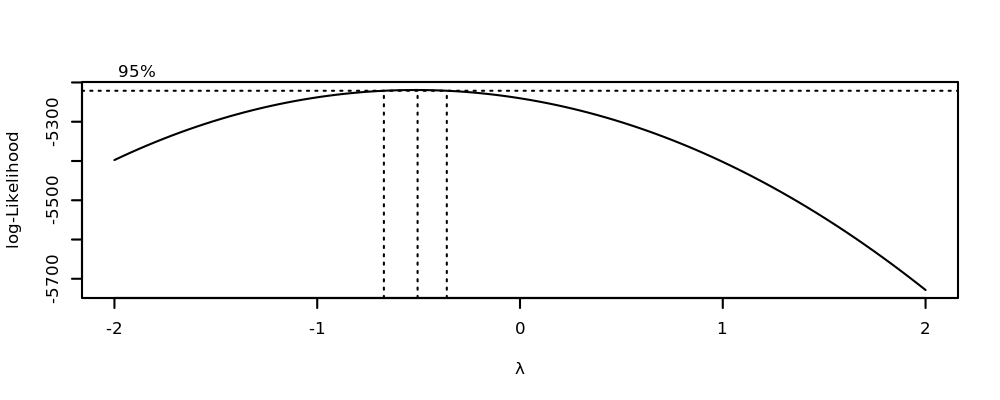

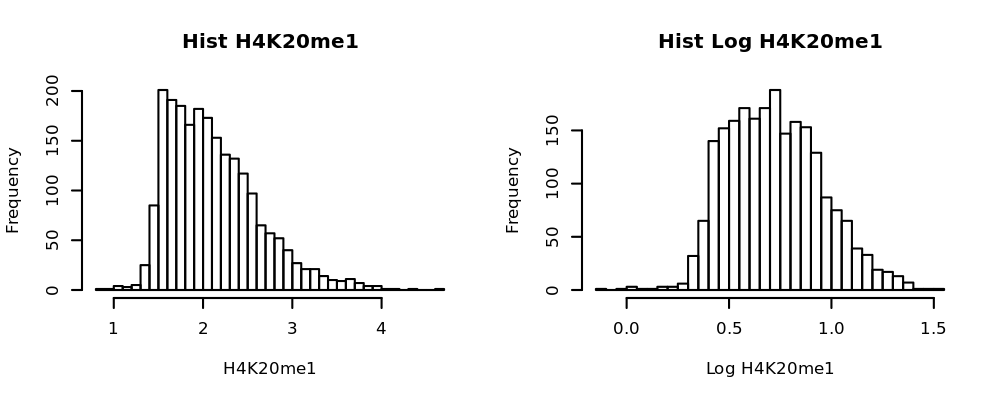

In [138]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$H4K20me1+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$H4K20me1, breaks = 50, main = "Hist H4K20me1", xlab = "H4K20me1")
hist(log(data$H4K20me1+1e-6), breaks = 50, main = "Hist Log H4K20me1", xlab = "Log H4K20me1")

# no need to transform

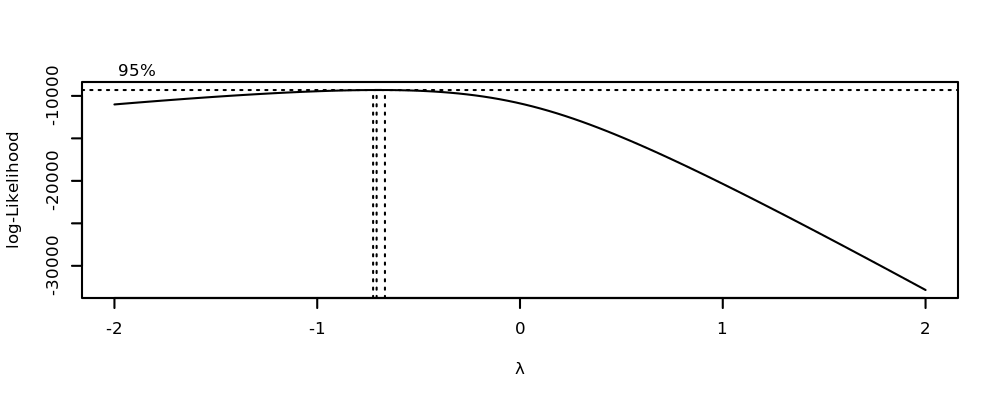

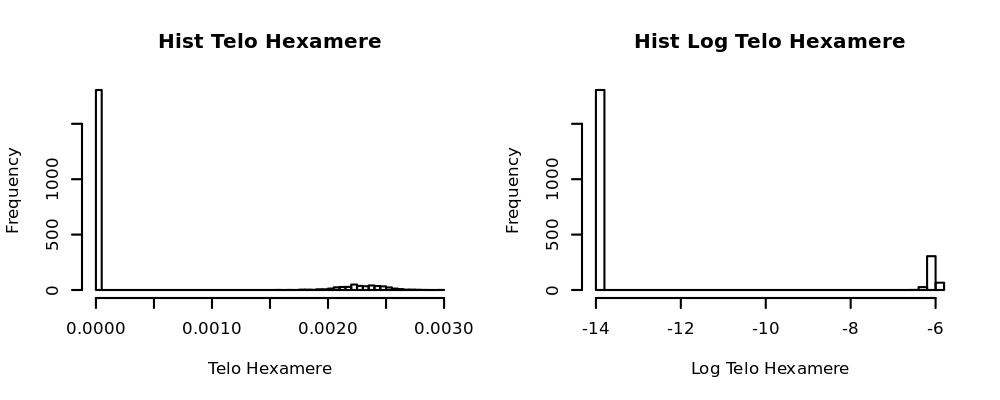

In [139]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$Telo_Hexamere+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$Telo_Hexamere, breaks = 50, main = "Hist Telo Hexamere", xlab = "Telo Hexamere")
hist(log(data$Telo_Hexamere+1e-6), breaks = 50, main = "Hist Log Telo Hexamere", xlab = "Log Telo Hexamere")

# dichotomize in 0-1
data$Telo_Hexamere[data$Telo_Hexamere>0] <- 1

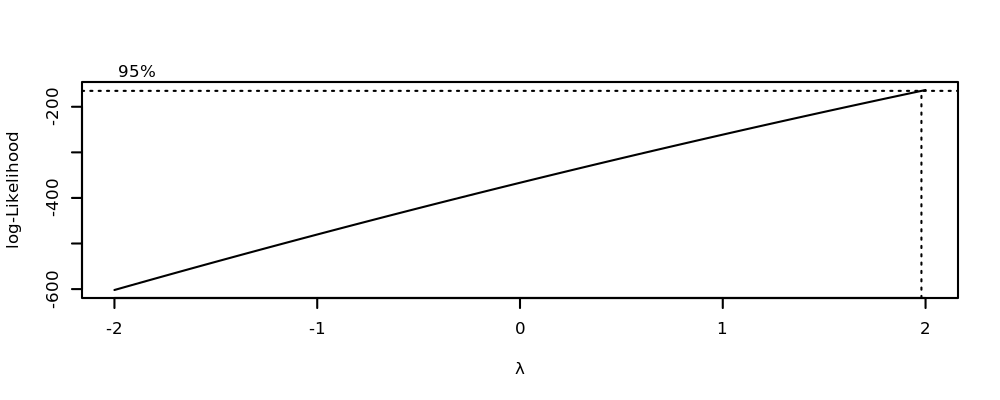

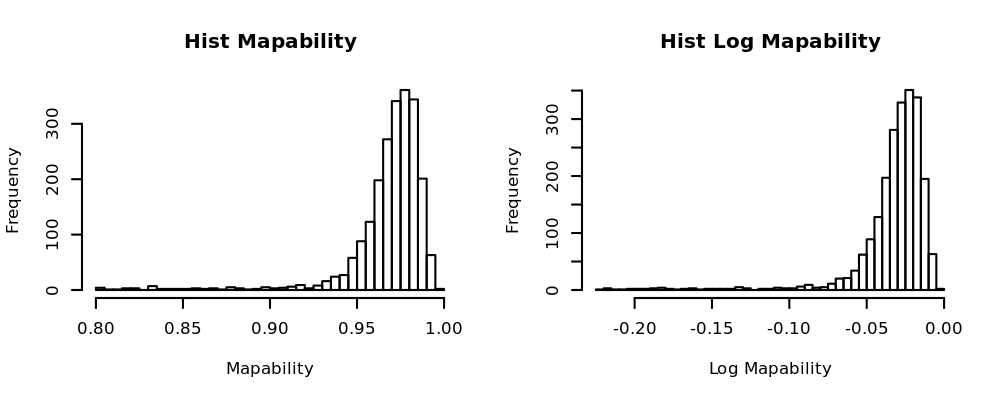

In [140]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$Mapability+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$Mapability, breaks = 50, main = "Hist Mapability", xlab = "Mapability")
hist(log(data$Mapability+1e-6), breaks = 50, main = "Hist Log Mapability", xlab = "Log Mapability")

# no need to transform

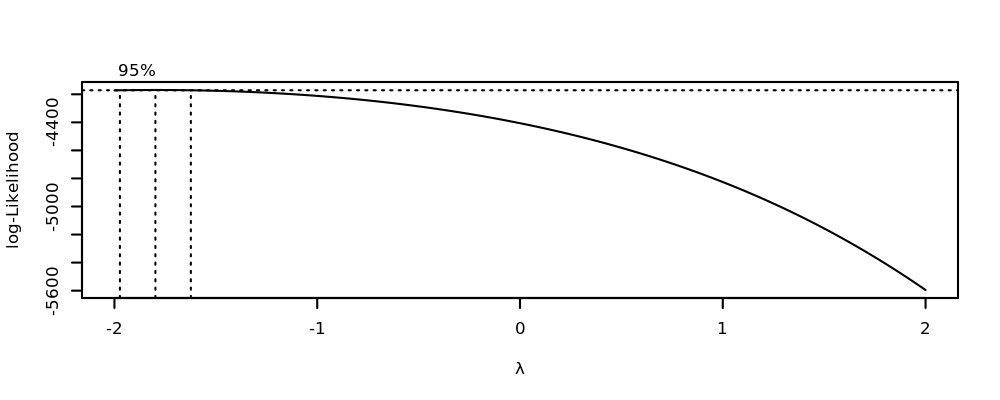

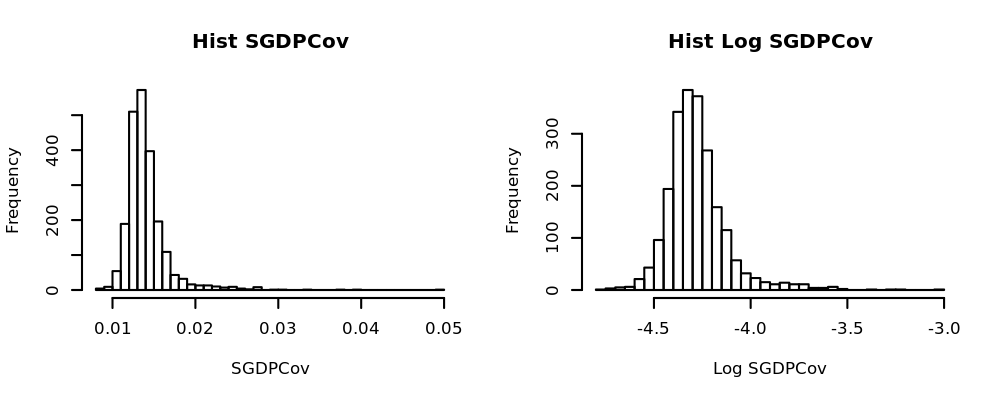

In [141]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$SGDPCov+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$SGDPCov, breaks = 50, main = "Hist SGDPCov", xlab = "SGDPCov")
hist(log(data$SGDPCov+1e-6), breaks = 50, main = "Hist Log SGDPCov", xlab = "Log SGDPCov")

data$SGDPCov=log(data$SGDPCov+1e-6)

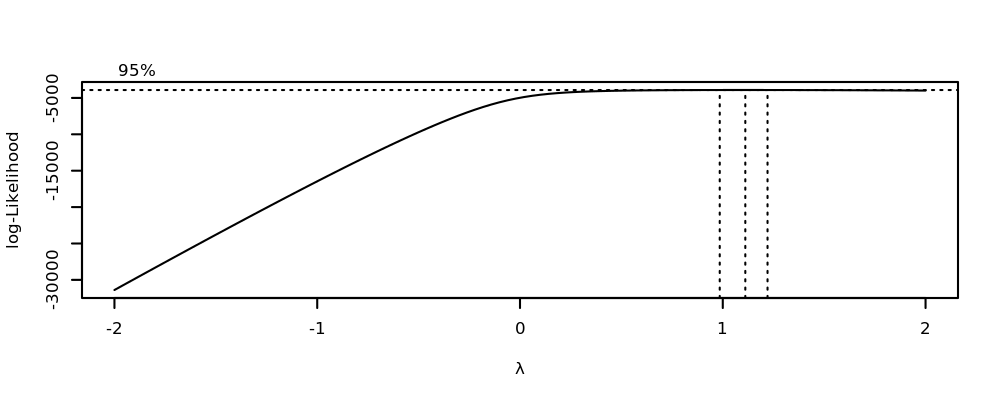

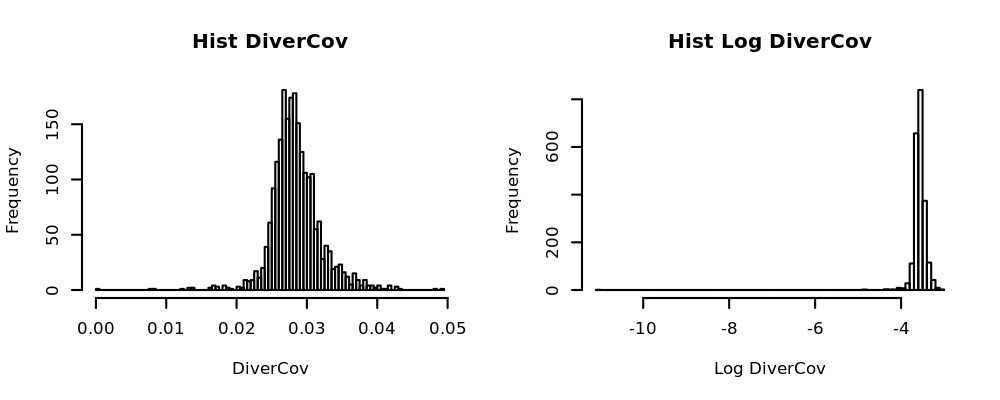

In [142]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,1), cex=0.5)
boxcox(I(data$DiverCov+1e-6)~1)

par(mfrow=c(1,2), cex=0.5)
hist(data$DiverCov, breaks = 100, main = "Hist DiverCov", xlab = "DiverCov")
hist(log(data$DiverCov+1e-6), breaks = 100, main = "Hist Log DiverCov", xlab = "Log DiverCov")
# no need to transform

#### Check the spread

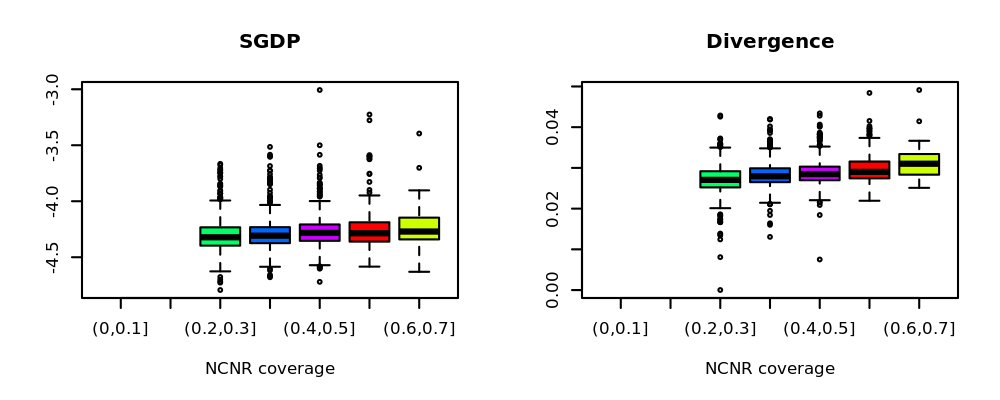

In [146]:
%%R -w 5 -h 2 --units in -r 200
par(mfrow=c(1,2), cex=0.5)
splitted <- split(data$SGDPCov,cut(1-data$InverseNCNRCov,seq(.0,.7,by=0.1)))
boxplot(splitted, col = rainbow(5), main='SGDP', xlab = 'NCNR coverage')
splitted <- split(data$DiverCov,cut(1-data$InverseNCNRCov,seq(.0,.7,by=0.1)))
boxplot(splitted, col = rainbow(5), main='Divergence', xlab = 'NCNR coverage')

- **Check ranges**

In [147]:
%%R -w 5 -h 6 --units in -r 200
variables <- c('WeightedScore', 'G4Cov', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov',
               'GCContent', 'RepTiming', 'RecombRate', 'DHS', 'RNA_pollII', 'CpG_Meth', 'CHH_Meth', 'CHG_Meth',
               'CpGIsland', 'RepOrigin', 'LADs', 'TeloDist', 'CentroDist', 'CTCF', 'H2AFZ', 'H3K27ac', 'H3K27me3',
               'H3K36me3', 'H3K4me1', 'H3K4me2', 'H3K4me3', 'H3K79me2', 'H3K9ac', 'H3K9me3', 'H4K20me1',
               'Telo_Hexamere', 'Mapability')

summary(data[,variables])

 WeightedScore        G4Cov             APhasedCov       InvertCov      
 Min.   : 5.917   Min.   :0.0000777   Min.   :0.4674   Min.   :0.03036  
 1st Qu.: 9.975   1st Qu.:0.0014120   1st Qu.:3.3660   1st Qu.:0.03831  
 Median :10.851   Median :0.0032154   Median :4.1200   Median :0.04152  
 Mean   :10.833   Mean   :0.0060292   Mean   :4.0113   Mean   :0.04237  
 3rd Qu.:11.655   3rd Qu.:0.0068759   3rd Qu.:4.7255   3rd Qu.:0.04564  
 Max.   :14.367   Max.   :0.0810584   Max.   :6.6622   Max.   :0.06252  
   DirectCov           ZCov          MirrorCov        GCContent     
 Min.   : 8.351   Min.   :-8.212   Min.   :-5.291   Min.   :0.3349  
 1st Qu.: 9.172   1st Qu.:-7.104   1st Qu.:-4.530   1st Qu.:0.3711  
 Median : 9.398   Median :-6.930   Median :-4.357   Median :0.3946  
 Mean   : 9.485   Mean   :-6.895   Mean   :-4.362   Mean   :0.4001  
 3rd Qu.: 9.693   3rd Qu.:-6.709   3rd Qu.:-4.189   3rd Qu.:0.4221  
 Max.   :12.623   Max.   :-4.996   Max.   :-3.413   Max.   :0.5772  
   Rep

In [148]:
%%R
save(data,file="dataframe_1Mb.Rda")

#### Are the predictors too correlated?

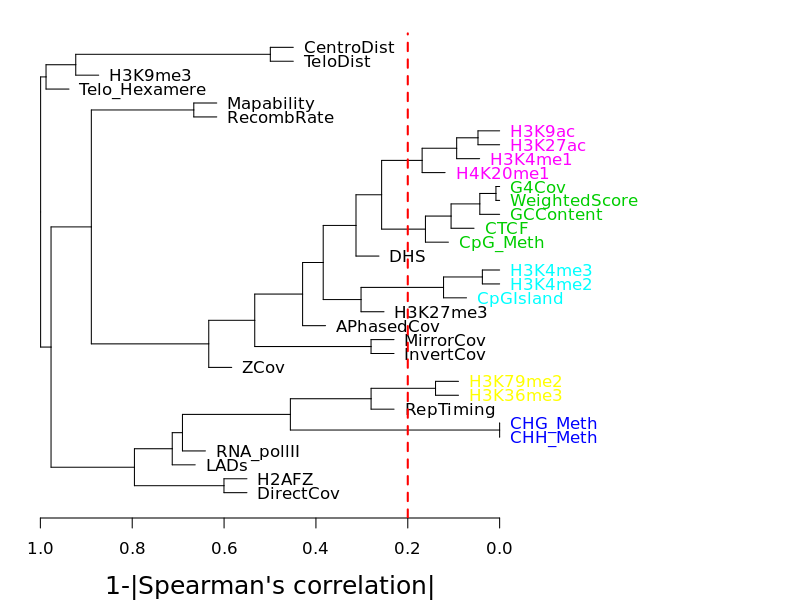

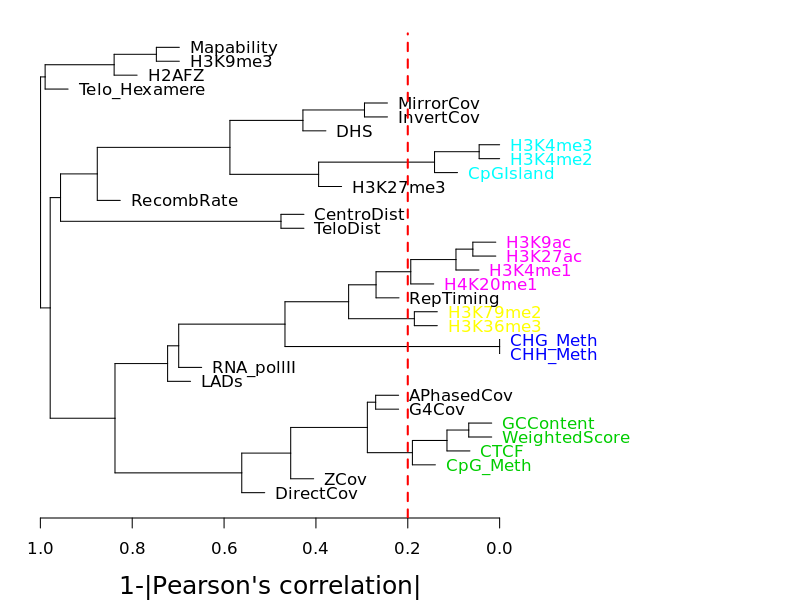

In [150]:
%%R -w 8 -h 6 --units in -r 100
par(mfrow=c(1,1))

require(dendextend)

# clustering using spearman correlation
clustering_spearman <- function(data, file_name = '', h = 0.2, labels = colnames(data)){
  correlation <- cor(data,method="spearman");
  abs.corr=as.dist(1-abs(correlation))
  fit <- hclust(abs.corr)
  fit$labels <- labels
  #pdf(paste0("clustering_spearman",file_name,".pdf"),width=12,height=12)
  par(mar=c(4,1,1,14)+0.1)
  library("dendextend")
  dend=as.dendrogram(fit,hang=0.05)
  dend_cut=cutree(dend,h=h)[order.dendrogram(dend)]
  dend_col=rep(1,length(dend_cut))
  cluster=which(table(dend_cut)>1)
  for(k in seq_along(cluster)){
    dend_col[dend_cut==cluster[k]]=k+2
  }
  labels_colors(dend)=dend_col
  plot(dend,xlab= "1-|Spearman's correlation|", ylab="",main=NULL,cex=0.7,cex.lab=1.5,horiz=TRUE,xlim=c(1,0))
  lines(c(h,h),c(-2,nrow(correlation)+1),col='red',lty='dashed',lwd=2)
  #dev.off()
}

# clustering using pearson correlation
clustering_pearson <- function(data, file_name = '', h = 0.2, labels = colnames(data)){
  correlation <- cor(data,method="pearson");
  abs.corr=as.dist(1-abs(correlation))
  fit <- hclust(abs.corr)
  fit$labels <- labels
  #pdf(paste0("clustering_pearson",file_name,".pdf"),width=12,height=12)
  par(mar=c(4,1,1,14)+0.1)
  library("dendextend")
  dend=as.dendrogram(fit,hang=0.05)
  dend_cut=cutree(dend,h=h)[order.dendrogram(dend)]
  dend_col=rep(1,length(dend_cut))
  cluster=which(table(dend_cut)>1)
  for(k in seq_along(cluster)){
    dend_col[dend_cut==cluster[k]]=k+2
  }
  labels_colors(dend)=dend_col
  plot(dend,xlab= "1-|Pearson's correlation|", ylab="",main=NULL,cex=0.7,cex.lab=1.5,horiz=TRUE,xlim=c(1,0))
  lines(c(h,h),c(-2,nrow(correlation)+1),col='red',lty='dashed',lwd=2)
  #dev.off()
}

variables <- c('WeightedScore', 'G4Cov', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov', 
               'GCContent', 'RepTiming', 'RecombRate', 'DHS','RNA_pollII','CpG_Meth', 'CHH_Meth', 'CHG_Meth',
               'CpGIsland', 'LADs', 'TeloDist', 'CentroDist', 'CTCF', 'H2AFZ', 'H3K27ac', 'H3K27me3',
               'H3K36me3', 'H3K4me1', 'H3K4me2', 'H3K4me3', 'H3K79me2', 'H3K9ac', 'H3K9me3', 'H4K20me1',
               'Telo_Hexamere', 'Mapability')

data_cluster <- data[, variables]

clustering_spearman(data_cluster, h = 0.2, labels = variables)
clustering_pearson(data_cluster, h = 0.2, labels = variables)

## 4.2 Regression

In [151]:
%%R
library(glmnet)
library(caret)
library(car)


In [157]:
%%R
select_quadratic_terms <- function(X, Y, Z, variables_forced_in, data, variables){
  # Add variables_forced_in to the model
  formula_start = paste('Y ~ ', paste(variables_forced_in, collapse = ' + '))
  
  # For each variable not forced in, decide if we need to include a quadratic term or not
  quadratic_term = rep(NA, length(setdiff(variables, variables_forced_in)))
  names(quadratic_term) = setdiff(variables, variables_forced_in)
  for(var_i in names(quadratic_term)){
    linear_model <- lm(paste(formula_start, '+', var_i), weights = Z, data = X, na.action = "na.fail")
    quadratic_model <- lm(paste(formula_start, '+', var_i, '+ I(', var_i, '^2)'), weights = Z, data = X, na.action = "na.fail")
    quadratic_term[var_i] = anova(linear_model, quadratic_model)$`Pr(>F)`[2]
  }
  return(quadratic_term)
}

In [158]:
%%R
run_elastic_net_repCV <- function(X, Y, Z, variables_forced_in, interactions=c(), variables_quadratic=c()){
  
  # check that interactions terms are in X
  interactions_ok = c()
  for(name in interactions){
    var_inter = strsplit(interactions, ':')[[1]]
    if( sum(!(var_inter %in% colnames(X))) == 0 )
      interactions_ok = c(interactions_ok, name)
  }
  
  # construct matrix with all terms
  formula <- paste0('Y ~ ', paste(names(X), collapse = ' + '))
  if(length(variables_quadratic)>0)
    formula <- paste(formula, ' + ', paste('I(', variables_quadratic, '^2)',collapse = ' + '))
  if(length(interactions_ok)>0)
    formula <- paste(formula, ' + ', paste(interactions_ok, collapse = ' + '))
  matrix_model <- model.matrix(formula(formula), weights = Z, data = X, na.action = "na.fail")[,-1]
  # force variables to be in the model
  penalty.factor <- rep(1, ncol(matrix_model))
  penalty.factor[colnames(matrix_model) %in% variables_forced_in] <- 0
  
  if( sum(penalty.factor) == 0){
    return(NULL)
  }
  
  # fit elastic net
  elastic_fit <- glmnet(matrix_model, Y, weights = Z, alpha = 0.5, penalty.factor = penalty.factor, standardize = TRUE)
  par(mfrow=c(1,1))
  plot(elastic_fit, xvar = "lambda", label = TRUE)
  
  
  # elastic net: REPEATED 10-fold cross validation (5 repeats)
  rep_cv_elastic <- train(matrix_model, Y, weights = Z, method = "glmnet", penalty.factor = penalty.factor, standardize = TRUE,
                          trControl = trainControl(method = "repeatedcv", number = 10, repeats = 5), 
                          tuneGrid = expand.grid(lambda = c(elastic_fit$lambda, seq(tail(elastic_fit$lambda,1), 0, length.out = 21)[-1]), alpha = 0.5))
  rep_cv_elastic$results[,-(1:2)] = round(rep_cv_elastic$results[,-(1:2)], 4)
  plot(log(rep_cv_elastic$results$lambda), rep_cv_elastic$results$RMSE, xlab = "log(Lambda)", ylab = "RMSE (Repeated Cross-Validation", pch = 20, col = 'red')
  abline(v = log(rev(rep_cv_elastic$results$lambda)[which.min(rev(rep_cv_elastic$results$RMSE))]), lty = 3)
  plot(log(rep_cv_elastic$results$lambda), rep_cv_elastic$results$Rsquared, xlab = "log(Lambda)", ylab = "Rsquared (Repeated Cross-Validation", pch = 20, col = 'red')
  abline(v = log(rev(rep_cv_elastic$results$lambda)[which.max(rev(rep_cv_elastic$results$Rsquared))]), lty = 3)
  
  
  # select the model corresponding to the minimum RMSE (mean squared error, repeated cross-validation)
  elastic_select_RMSE <- coef(rep_cv_elastic$finalModel, rev(rep_cv_elastic$results$lambda)[which.min(rev(rep_cv_elastic$results$RMSE))])
  # extract names of selected terms
  rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE)!=0]
  # re-fit model with selected variables
  model_elastic_select_RMSE <- lm(paste('Y ~ ', paste(rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE)!=0][-1], collapse = ' + ')),
                                  weights = Z, data = X, na.action = "na.fail")
  
  
  # select the model corresponding to the maximum Rsquared (repeated cross-validation)
  elastic_select_R2 <- coef(rep_cv_elastic$finalModel, rev(rep_cv_elastic$results$lambda)[which.max(rev(rep_cv_elastic$results$Rsquared))])
  # extract names of selected terms
  rownames(elastic_select_R2)[as.matrix(elastic_select_R2)!=0]
  # re-fit model with selected variables
  model_elastic_select_R2 <- lm(paste('Y ~ ', paste(rownames(elastic_select_R2)[as.matrix(elastic_select_R2)!=0][-1], collapse = ' + ')),
                                weights = Z, data = X, na.action = "na.fail")    
  
  return(list(model_elastic_select_RMSE = model_elastic_select_RMSE, model_elastic_select_R2 = model_elastic_select_R2, 
              elastic_fit = elastic_fit, rep_cv_elastic = rep_cv_elastic))
}

partial_determination <- function(dataset, variables, fit_full, variables_forced_in){

    names <- c()
    for (name in names(coef(fit_full))[-1]) {
        name <- strsplit(name, ':')[[1]]
        names <- c(names,name)
    }
    names = gsub('I\\(','',names)
    names = gsub('\\^2\\)','',names)
    names <- unique(names)
    
    r2_full = summary(fit_full)$r.squared
    dataframe <- data.frame(r2_full)
    colnames <- c('R2')
    
    
    for (variable in setdiff(variables,variables_forced_in)){
        if (variable %in% names) {
            fit_red <- update(fit_full, as.formula(paste0(".~.- ",variable," - ",variable,":.","-I(",variable,"^2)")), data = dataset)
            r2_red = summary(fit_red)$r.squared
            r2_partial = ((1-r2_red) - (1-r2_full))/(1-r2_red)

        } else { r2_partial = NA }
        
        dataframe <- cbind(dataframe, r2_partial)
        colnames <- c(colnames,variable)
        }
    colnames(dataframe) <- colnames
    return(dataframe)
}

In [159]:
%%R
compute_partial_det <- function(X, Y, Z, variables_forced_in, data, variables, variables_quadratic){
    
# elastic net with repeated cross-validation
elastic_net_rep <- run_elastic_net_repCV(X, Y, Z, variables_forced_in, interactions=c(), variables_quadratic)
model_RMSE <- elastic_net_rep[[1]]
model_R2 <- elastic_net_rep[[2]]
    
# compute partial R2
partial_determinations_RMSE <- partial_determination(data, variables, model_RMSE, variables_forced_in)
rownames(partial_determinations_RMSE) <- c()
partial_determinations_R2 <- partial_determination(data, variables, model_R2, variables_forced_in)
rownames(partial_determinations_R2) <- c()

partial_determinations <- rbind(partial_determinations_RMSE, partial_determinations_R2)
row.names(partial_determinations) <- c("RMSE", "R2")

    
return(list(partial_determinations = partial_determinations, elastic_net_rep = elastic_net_rep))
}

partial_determination_group <- function(dataset, fit_full, variables_group){
  
  names <- c()
  for (name in names(coef(fit_full))[-1]) {
    name <- strsplit(name, ':')[[1]]
    names <- c(names,name)
  }
  names = gsub('I\\(','',names)
  names = gsub('\\^2\\)','',names)
  names <- unique(names)
  
  variables_group = intersect(variables_group,names) # select only variables within the model
  r2_full = summary(fit_full)$r.squared
  fit_red <- update(fit_full, as.formula(paste0(". ~ .",paste0(' -',variables_group,collapse=''),
                                                paste0(' -', variables_group,":.",collapse=''),
                                                paste0(" -I(",variables_group,"^2)",collapse=''))), data = dataset)
  r2_red = summary(fit_red)$r.squared
  r2_partial = ((1-r2_red) - (1-r2_full))/(1-r2_red)
  return(r2_partial)
}

predict_variable <- function(dataset, fit_full, categorical, variable){
  
  names <- c()
  for (name in names(coef(fit_full))[-1]) {
    name <- strsplit(name, ':')[[1]]
    names <- c(names,name)
  }
  names = gsub('I\\(','',names)
  names = gsub('\\^2\\)','',names)
  names <- unique(names)
  
  new_data = data.frame(seq(min(data[,var_i]), max(data[,var_i]), length.out = 1000))
  colnames(new_data) = variable
  new_data = cbind(new_data, data.frame(t(colMeans(dataset[,setdiff(names, c(variable, categorical))]))))
  if(length(categorical)){
    new_data_categorical = data.frame(t(apply(as.matrix(data[, categorical]), 2, 
                                            function(v){
                                              uniqv <- unique(v)
                                              uniqv[which.max(tabulate(match(v, uniqv)))]
                                            })))
    colnames(new_data_categorical) = categorical
    new_data = cbind(new_data, new_data_categorical)
  }
  
  predict_new = predict(fit_full, newdata = new_data)
  
  return(list(x = new_data[,1], y = predict_new))
}

In [160]:
%%R
load("dataframe_1Mb.Rda")


variables <- c('WeightedScore', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov',
               'RepTiming', 'RecombRate', 'DHS', 'RNA_pollII', 'CHH_Meth',
               'CpGIsland', 'LADs', 'TeloDist', 'CentroDist', 'H2AFZ', 'H3K27me3',
               'H3K36me3', 'H3K9ac', 'H3K9me3',
               'Telo_Hexamere', 'Mapability')
variables_forced_in <- 'Mapability'
categorical <- 'Telo_Hexamere'

X <- data[,variables]
Z <- 1 - data$InverseNCNRCov # weight

[1] "SGDP"

Call:
lm(formula = paste("Y ~ ", paste(rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE) != 
    0][-1], collapse = " + ")), data = X, weights = Z, na.action = "na.fail")

Weighted Residuals:
     Min       1Q   Median       3Q      Max 
-0.27375 -0.03756 -0.00406  0.03184  0.64907 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         5.141e+00  8.902e-01   5.775 8.78e-09 ***
WeightedScore      -1.550e-01  3.902e-02  -3.973 7.32e-05 ***
APhasedCov         -2.508e-02  2.031e-02  -1.235 0.216967    
InvertCov          -1.989e+01  6.147e+00  -3.235 0.001234 ** 
DirectCov          -7.878e-01  1.157e-01  -6.809 1.27e-11 ***
ZCov                7.883e-01  2.195e-01   3.592 0.000335 ***
MirrorCov           4.359e-01  2.657e-01   1.641 0.100980    
RepTiming          -5.766e-03  1.388e-03  -4.153 3.40e-05 ***
RecombRate          3.772e-02  1.045e-02   3.608 0.000316 ***
DHS                -2.908e+00  6.306e-01  -4.611 4.24e-06 

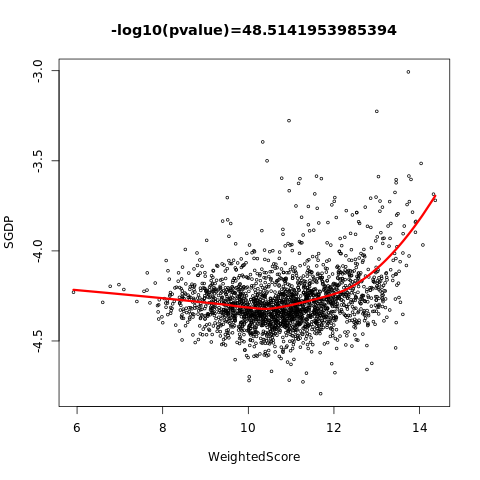

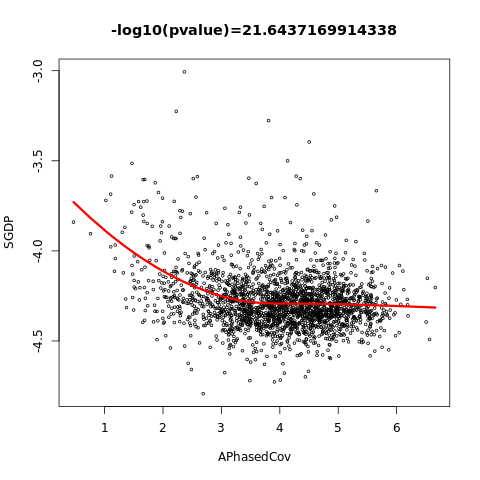

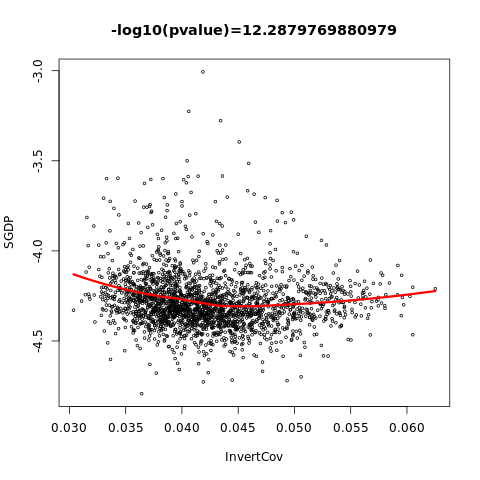

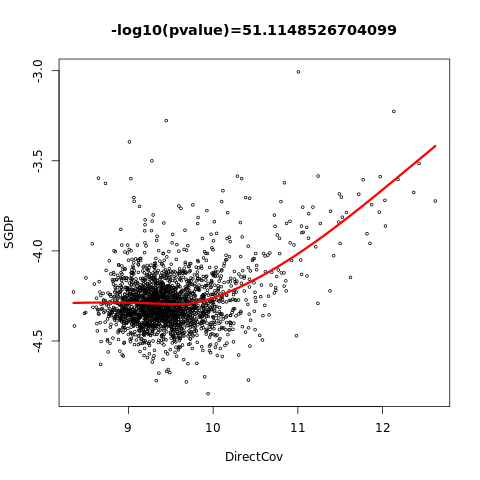

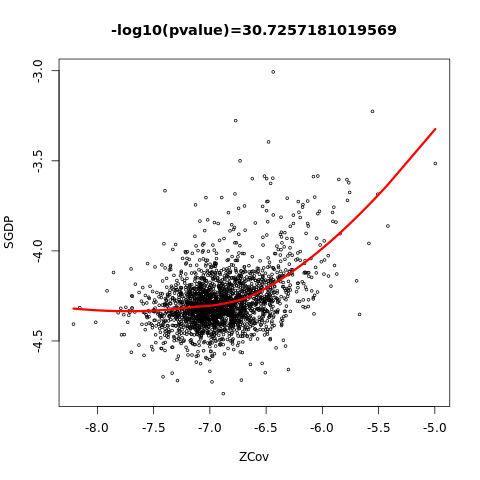

...

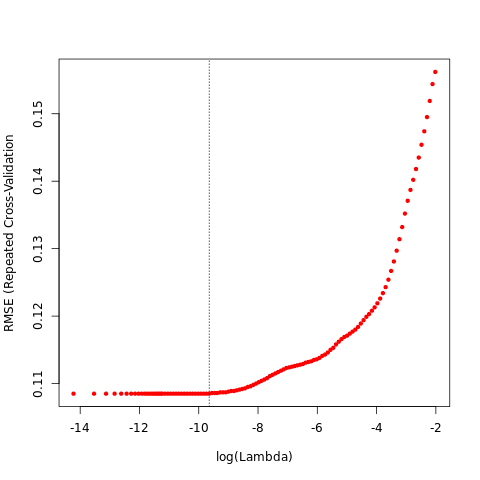

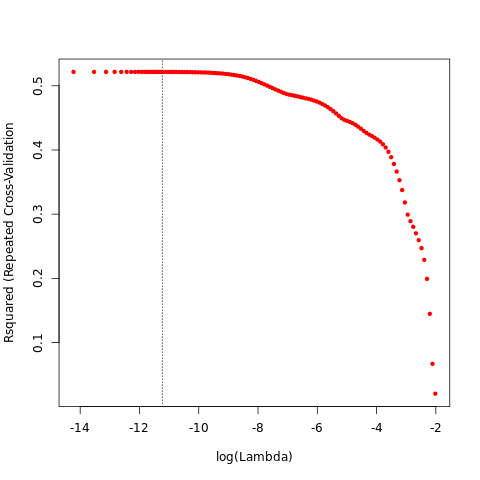

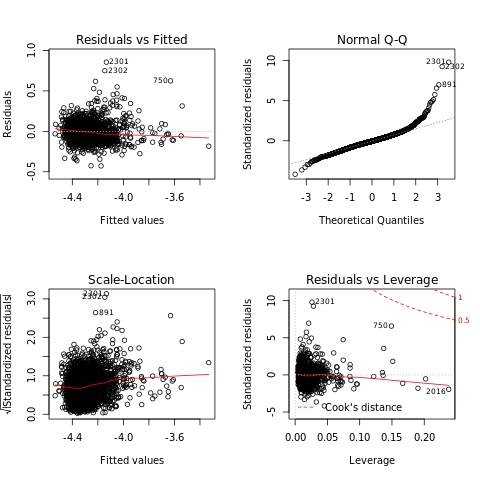

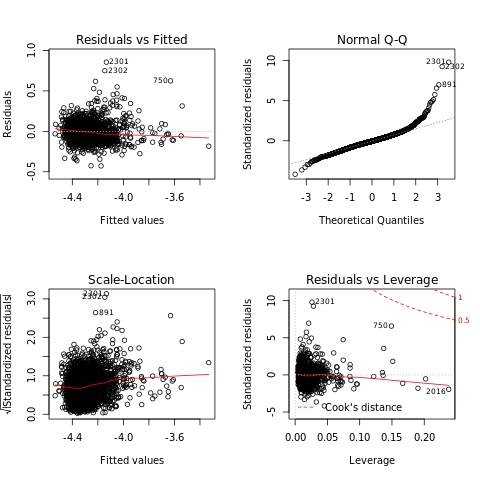

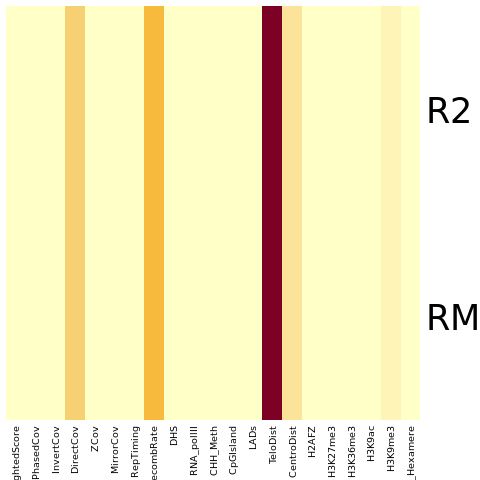

In [161]:
%%R
print('SGDP')
Y <- data$SGDPCov


##### Step 0: decide which quadratic terms to add #####
pval_quadratic = select_quadratic_terms(X, Y, Z, variables_forced_in, data, setdiff(variables, categorical))

par(mfrow=c(1,1))
for(var_i in setdiff(setdiff(variables, categorical), variables_forced_in)){
  plot(data[,var_i], Y, xlab = var_i, ylab = 'SGDP', main = paste0('-log10(pvalue)=', -log10(pval_quadratic[var_i])), cex = 0.5)
  lw <- loess(paste('Y ~ ',var_i), weights = Z, data = data)
  j <- order(data[,var_i])
  lines(data[j, var_i],lw$fitted[j], col="red", lwd=3)
}

plot(-log10(pval_quadratic), xlab = 'Variables', ylab = '-log10(pvalue)')
abline(h = 10, col = 'red')
variables_quadratic <- names(pval_quadratic)[ pval_quadratic < 1e-10 ]
#####

set.seed(3)
##### Step 1: no interactions, requires variables_forced_in inside the model #####
par(mfrow=c(4,2),cex=0.5)
SGDP_partial_det_step1 <- compute_partial_det(X, Y, Z, variables_forced_in, data, variables, variables_quadratic)

# look at the model selected with RMSE
print(summary(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check multicollinearity issues
print(vif(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check assumption issues
par(mfrow=c(2,2))
plot(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE)

# look at the model selected with R2
print(summary(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check multicollinearity issues
print(vif(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check assumption issues
par(mfrow=c(2,2))
plot(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_R2)

# look at partial determination
print(SGDP_partial_det_step1$partial_determinations)
par(mfrow=c(1,1))
heatmap(as.matrix(SGDP_partial_det_step1$partial_determinations[,-1]), Rowv = NA, Colv = NA)
SGDP_partial_det_RMSE <- SGDP_partial_det_step1$partial_determinations[1,]
SGDP_partial_det_R2 <- SGDP_partial_det_step1$partial_determinations[2,]

# look at partial determination for nonB
nonB <- c('WeightedScore', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov')
SGDP_partial_det_RMSE_nonB <- partial_determination_group(data, SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE, nonB)
SGDP_partial_det_R2_nonB <- partial_determination_group(data, SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_R2, nonB)
#####

In [156]:
%%R
##### Step 1: no interactions, requires variables_forced_in inside the model #####
par(mfrow=c(4,2),cex=0.5)
SGDP_partial_det_step1 <- compute_partial_det(X, Y, Z, variables_forced_in, data, variables, variables_quadratic)

# look at the model selected with RMSE
print(summary(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check multicollinearity issues
print(vif(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check assumption issues
par(mfrow=c(2,2))
plot(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE)

# look at the model selected with R2
print(summary(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check multicollinearity issues
print(vif(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check assumption issues
par(mfrow=c(2,2))
plot(SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_R2)

# look at partial determination
print(SGDP_partial_det_step1$partial_determinations)
par(mfrow=c(1,1))
heatmap(as.matrix(SGDP_partial_det_step1$partial_determinations[,-1]), Rowv = NA, Colv = NA)
SGDP_partial_det_RMSE <- SGDP_partial_det_step1$partial_determinations[1,]
SGDP_partial_det_R2 <- SGDP_partial_det_step1$partial_determinations[2,]

# look at partial determination for nonB
nonB <- c('WeightedScore', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov')
SGDP_partial_det_RMSE_nonB <- partial_determination_group(data, SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE, nonB)
SGDP_partial_det_R2_nonB <- partial_determination_group(data, SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_R2, nonB)
#####


Call:
lm(formula = paste("Y ~ ", paste(rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE) != 
    0][-1], collapse = " + ")), data = X, weights = Z, na.action = "na.fail")

Weighted Residuals:
     Min       1Q   Median       3Q      Max 
-0.21004 -0.03412 -0.00683  0.02600  0.61178 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         3.329e+00  7.686e-01   4.332 1.55e-05 ***
WeightedScore      -1.951e-01  3.368e-02  -5.793 7.92e-09 ***
APhasedCov         -2.533e-02  1.752e-02  -1.445 0.148492    
InvertCov          -1.845e+01  5.307e+00  -3.476 0.000518 ***
DirectCov          -6.559e-01  9.984e-02  -6.570 6.29e-11 ***
ZCov                7.131e-01  1.895e-01   3.763 0.000172 ***
MirrorCov           3.620e-01  2.293e-01   1.579 0.114538    
RepTiming          -4.990e-03  1.194e-03  -4.179 3.04e-05 ***
RecombRate         -1.009e-03  9.018e-03  -0.112 0.910956    
DHS                -2.735e+00  5.425e-01  -5.040 5.03e-07 ***
RNA_pol

R[write to console]: Error in partial_determination_group(data, SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE,  : 
  could not find function "partial_determination_group"
Calls: <Anonymous> -> <Anonymous> -> withVisible

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In merge.data.frame(partial_det_merged, dnm, by = "Predictors",  :
R[write to console]: 
 
R[write to console]:  column names 'Partial Determination.x', 'Partial Determination.y' are duplicated in the result

R[write to console]: 2: 
R[write to console]: In merge.data.frame(partial_det_merged, dnm, by = "Predictors",  :
R[write to console]: 
 
R[write to console]:  column names 'Partial Determination.x', 'Partial Determination.y' are duplicated in the result




Error in partial_determination_group(data, SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE,  : 
  could not find function "partial_determination_group"
Calls: <Anonymous> -> <Anonymous> -> withVisible



Call:
lm(formula = paste("Y ~ ", paste(rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE) != 
    0][-1], collapse = " + ")), data = X, weights = Z, na.action = "na.fail")

Weighted Residuals:
     Min       1Q   Median       3Q      Max 
-0.27375 -0.03756 -0.00406  0.03184  0.64907 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         5.141e+00  8.902e-01   5.775 8.78e-09 ***
WeightedScore      -1.550e-01  3.902e-02  -3.973 7.32e-05 ***
APhasedCov         -2.508e-02  2.031e-02  -1.235 0.216967    
InvertCov          -1.989e+01  6.147e+00  -3.235 0.001234 ** 
DirectCov          -7.878e-01  1.157e-01  -6.809 1.27e-11 ***
ZCov                7.883e-01  2.195e-01   3.592 0.000335 ***
MirrorCov           4.359e-01  2.657e-01   1.641 0.100980    
RepTiming          -5.766e-03  1.388e-03  -4.153 3.40e-05 ***
RecombRate          3.772e-02  1.045e-02   3.608 0.000316 ***
DHS                -2.908e+00  6.306e-01  -4.611 4.24e-06 ***
RNA_pol

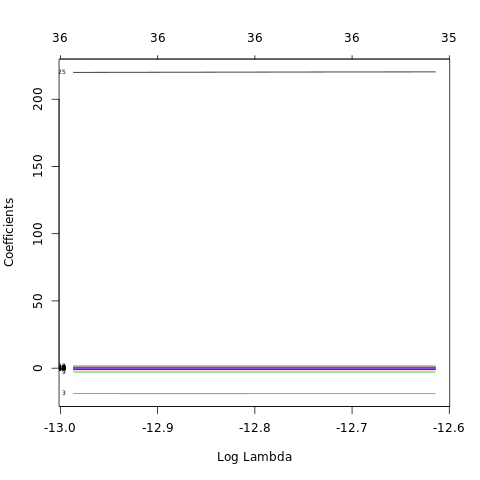

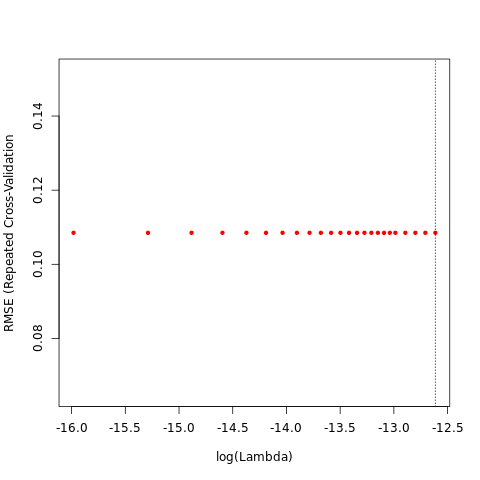

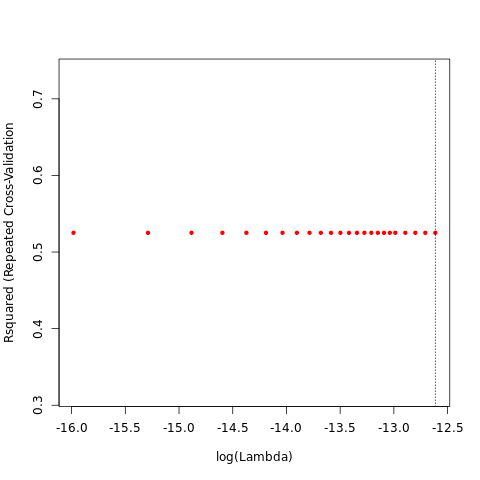

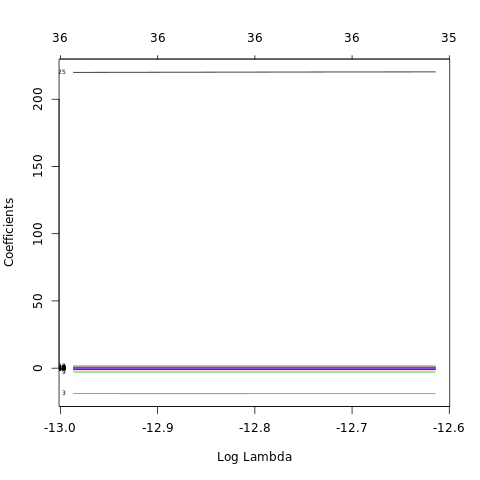

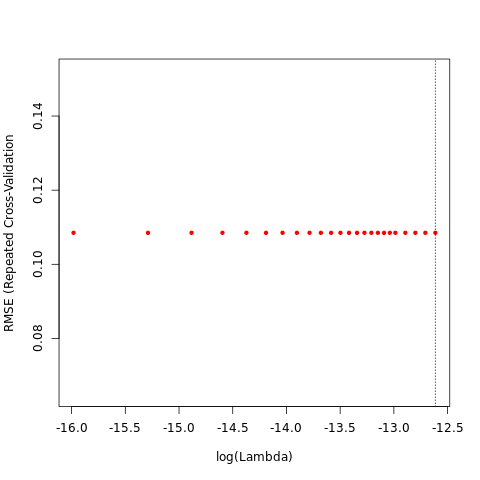

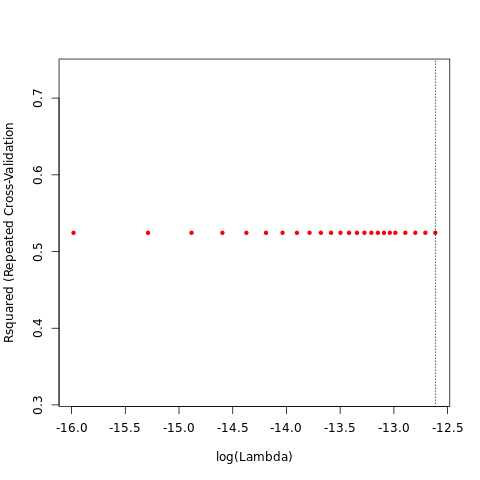

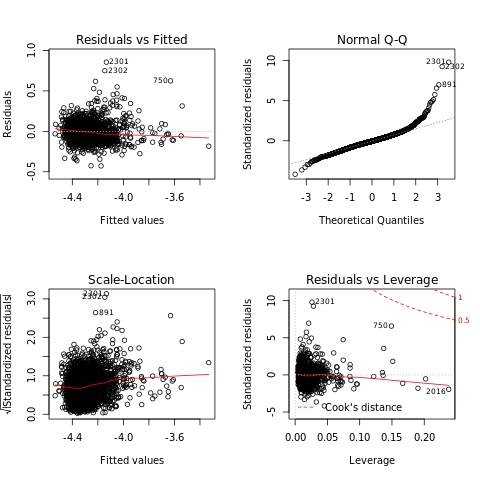

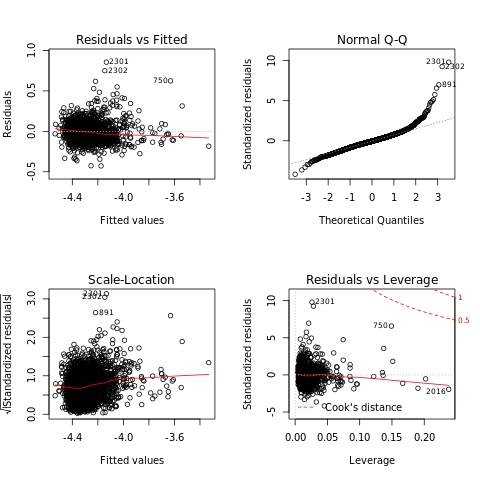

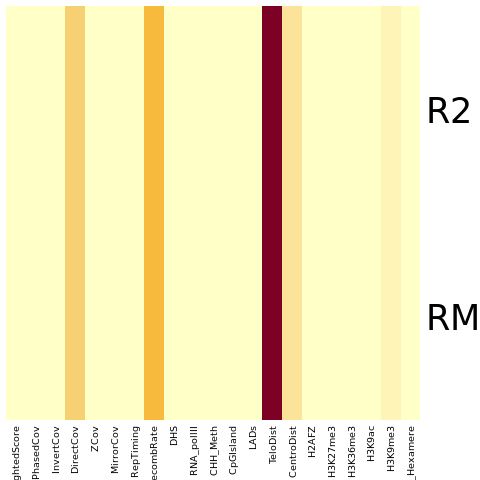

In [72]:
%%R
##### step 2: add interactions (only interactions between some of the variables that where selected in step1!) #####
###         requires this model to contain the model at step1
interactions <- c('WeightedScore:CpGIsland')
#interactions <- c(interactions, 
#                  paste('RecombRate', setdiff(names(SGDP_partial_det_RMSE[-1])[!is.na(SGDP_partial_det_RMSE[-1])], 
#                                              c('RecombRate',variables_forced_in)), sep = ':')) # add all interactions with RecombRate

SGDP_partial_det_step2 <- compute_partial_det_with_interactions(X, Y, Z, variables_forced_in, data, variables, variables_quadratic,
                                                                SGDP_partial_det_step1, interactions)

###
### INTERACTION IS NOT SELECTED !!!!
###

# look at the model selected with RMSE (in both steps)
print(summary(SGDP_partial_det_step2$elastic_net_rep_RMSE$model_elastic_select_RMSE))
# check assumption issues
par(mfrow=c(2,2))
plot(SGDP_partial_det_step2$elastic_net_rep_RMSE$model_elastic_select_RMSE)

# look at the model selected with R2
print(summary(SGDP_partial_det_step2$elastic_net_rep_R2$model_elastic_select_R2))
# check assumption issues
par(mfrow=c(2,2))
plot(SGDP_partial_det_step2$elastic_net_rep_R2$model_elastic_select_R2)

# look at partial determination
print(SGDP_partial_det_step2$partial_determinations)
par(mfrow=c(1,1))
heatmap(as.matrix(SGDP_partial_det_step2$partial_determinations[,-1]), Rowv = NA, Colv = NA)
SGDP_partial_det_RMSE <- SGDP_partial_det_step2$partial_determinations[1,]
SGDP_partial_det_R2 <- SGDP_partial_det_step2$partial_determinations[2,]

[1] "TGP"


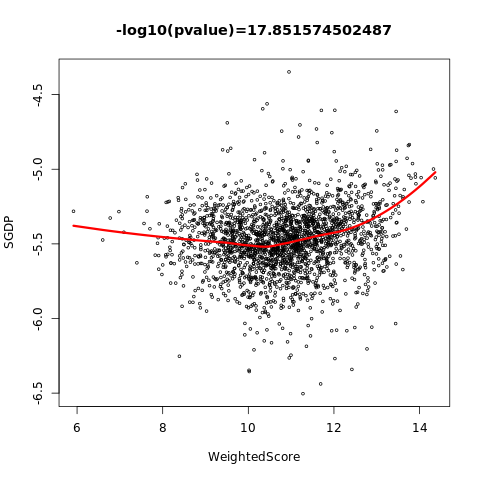

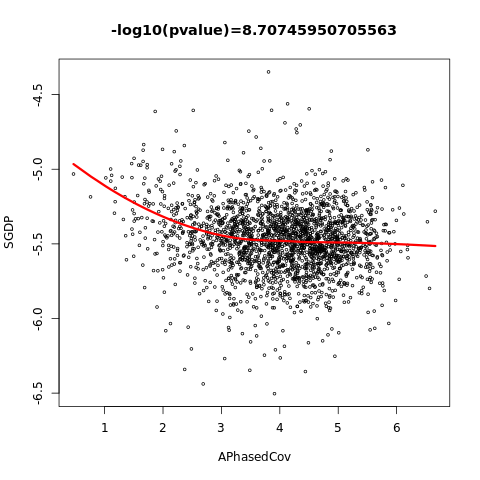

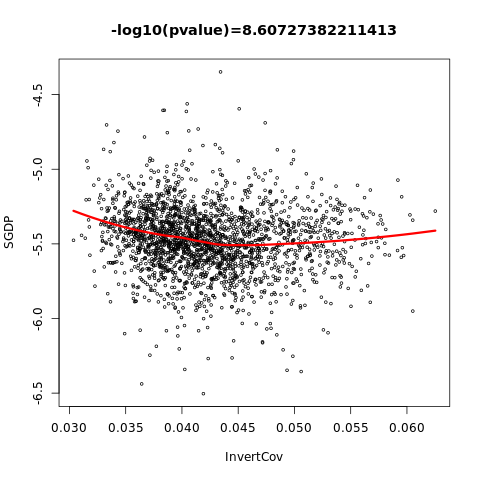

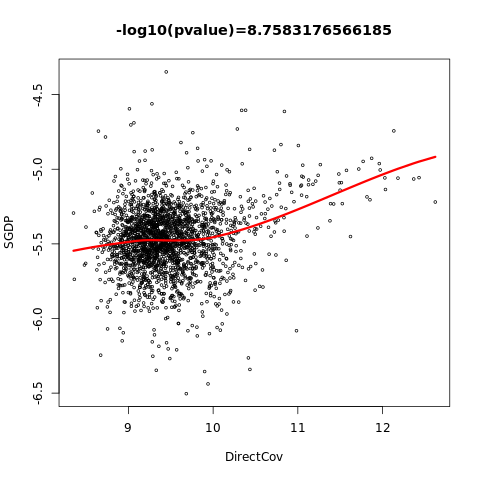

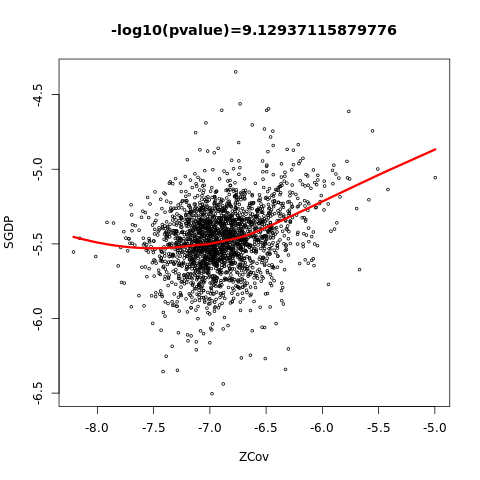

...

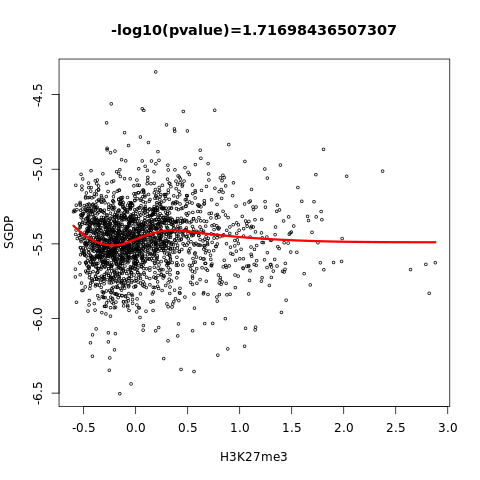

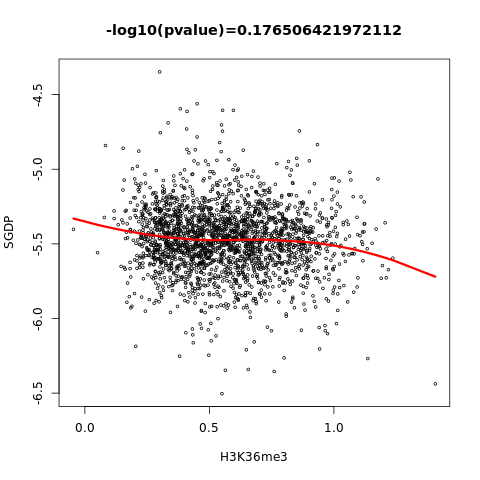

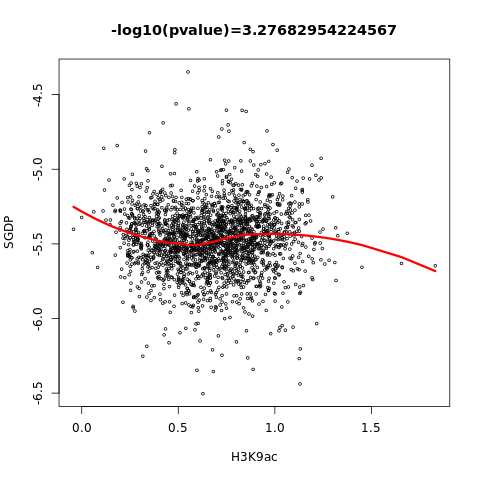

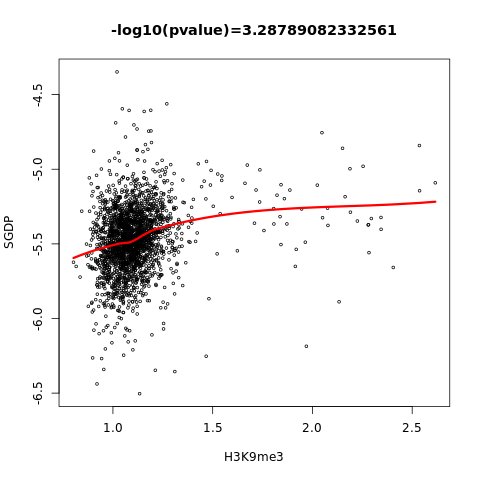

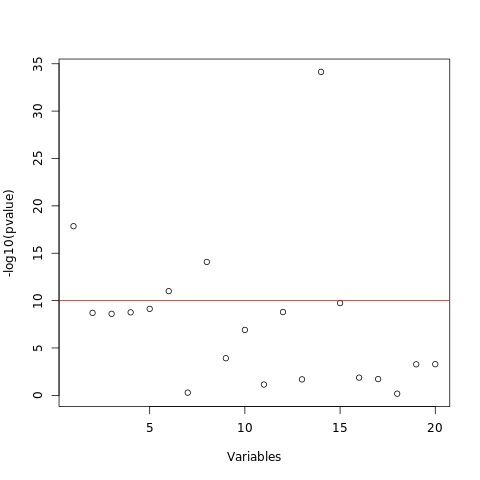

In [73]:
%%R
print('TGP')
Y <- data$high1kGCov

##### Step 0: decide which quadratic terms to add #####
pval_quadratic = select_quadratic_terms(X, Y, Z, variables_forced_in, data, setdiff(variables, categorical))

par(mfrow=c(1,1))
for(var_i in setdiff(setdiff(variables, categorical), variables_forced_in)){
  plot(data[,var_i], Y, xlab = var_i, ylab = 'SGDP', main = paste0('-log10(pvalue)=', -log10(pval_quadratic[var_i])), cex = 0.5)
  lw <- loess(paste('Y ~ ',var_i), weights = Z, data = data)
  j <- order(data[,var_i])
  lines(data[j, var_i],lw$fitted[j], col="red", lwd=3)
}

plot(-log10(pval_quadratic), xlab = 'Variables', ylab = '-log10(pvalue)')
abline(h = 10, col = 'red')
variables_quadratic <- names(pval_quadratic)[ pval_quadratic < 1e-10 ]


Call:
lm(formula = paste("Y ~ ", paste(rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE) != 
    0][-1], collapse = " + ")), data = X, weights = Z, na.action = "na.fail")

Weighted Residuals:
     Min       1Q   Median       3Q      Max 
-0.49154 -0.06177  0.00378  0.06552  0.71318 

Coefficients:
                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)        -4.207763   0.911517  -4.616 4.14e-06 ***
WeightedScore      -0.228173   0.053474  -4.267 2.07e-05 ***
APhasedCov         -0.005284   0.006552  -0.806 0.420082    
InvertCov           0.671476   1.340455   0.501 0.616470    
DirectCov           0.112243   0.012168   9.225  < 2e-16 ***
ZCov                0.029963   0.016643   1.800 0.071936 .  
MirrorCov           0.630842   0.384568   1.640 0.101069    
RepTiming          -0.008272   0.002123  -3.896 0.000101 ***
RecombRate          0.114101   0.016653   6.852 9.47e-12 ***
DHS                -1.720155   0.986022  -1.745 0.081206 .  
RNA_pollII        

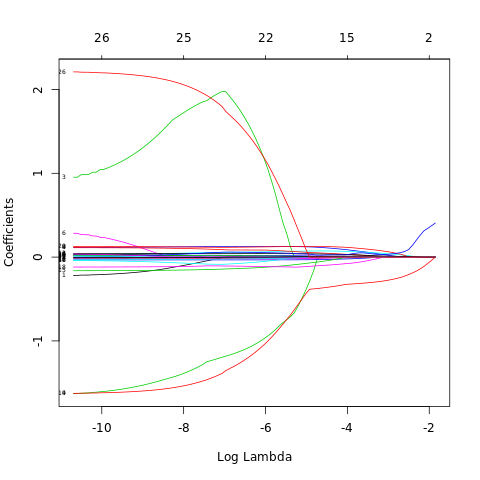

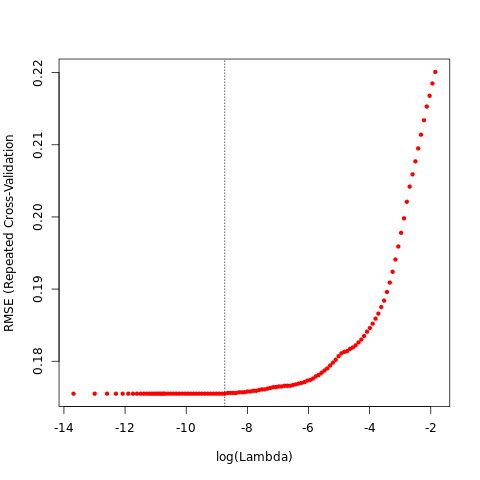

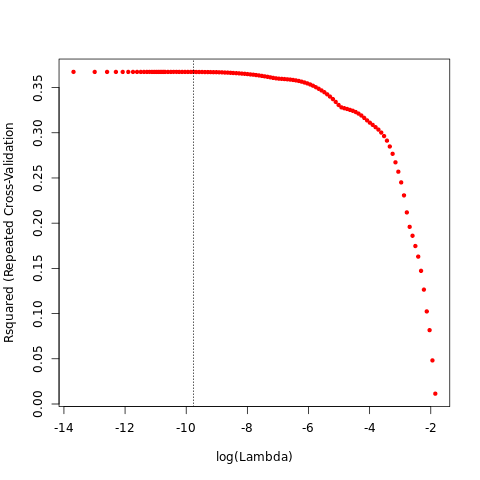

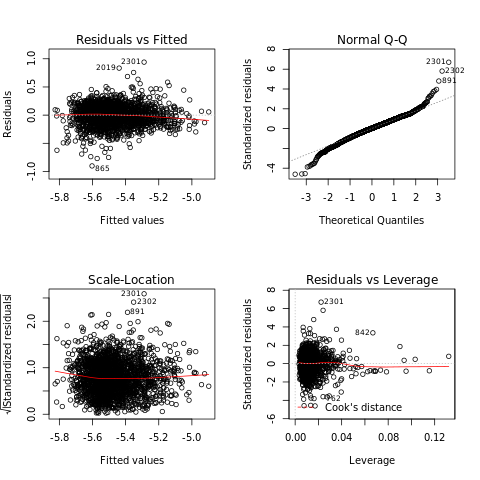

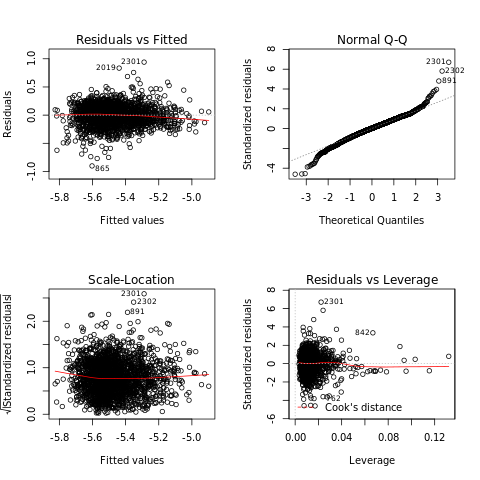

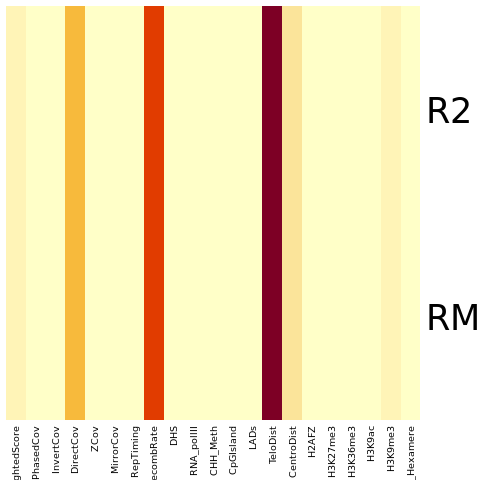

In [75]:
%%R
##### Step 1: no interactions, requires variables_forced_in inside the model #####
par(mfrow=c(4,2),cex=0.5)
TGP_partial_det_step1 <- compute_partial_det(X, Y, Z, variables_forced_in, data, variables, variables_quadratic)

# look at the model selected with RMSE
print(summary(TGP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check multicollinearity issues
print(vif(TGP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check assumption issues
par(mfrow=c(2,2))
plot(TGP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE)

# look at the model selected with R2
print(summary(TGP_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check multicollinearity issues
print(vif(TGP_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check assumption issues
par(mfrow=c(2,2))
plot(TGP_partial_det_step1$elastic_net_rep$model_elastic_select_R2)

# look at partial determination
print(TGP_partial_det_step1$partial_determinations)
par(mfrow=c(1,1))
heatmap(as.matrix(TGP_partial_det_step1$partial_determinations[,-1]), Rowv = NA, Colv = NA)
TGP_partial_det_RMSE <- TGP_partial_det_step1$partial_determinations[1,]
TGP_partial_det_R2 <- TGP_partial_det_step1$partial_determinations[2,]


Call:
lm(formula = paste("Y ~ ", paste(rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE) != 
    0][-1], collapse = " + ")), data = X, weights = Z, na.action = "na.fail")

Weighted Residuals:
     Min       1Q   Median       3Q      Max 
-0.49177 -0.06294  0.00280  0.06630  0.72279 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             -5.872803   1.167522  -5.030 5.30e-07 ***
WeightedScore           -0.036203   0.099751  -0.363 0.716686    
APhasedCov              -0.005308   0.006546  -0.811 0.417488    
InvertCov                0.464063   1.342255   0.346 0.729576    
DirectCov                0.109618   0.012210   8.978  < 2e-16 ***
ZCov                     0.025758   0.016729   1.540 0.123760    
MirrorCov                0.533162   0.386582   1.379 0.167985    
RepTiming               -0.008905   0.002139  -4.163 3.27e-05 ***
RecombRate               0.113505   0.016639   6.821 1.16e-11 ***
DHS                     -1.43

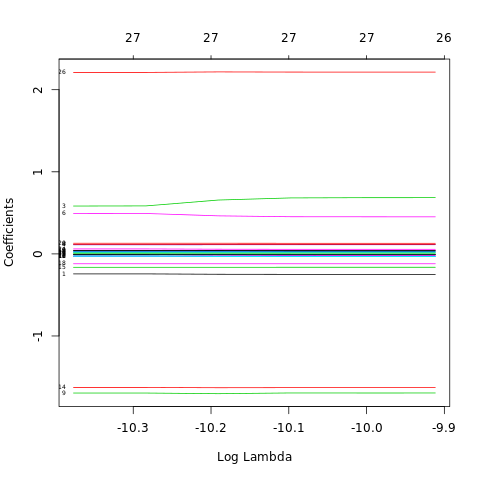

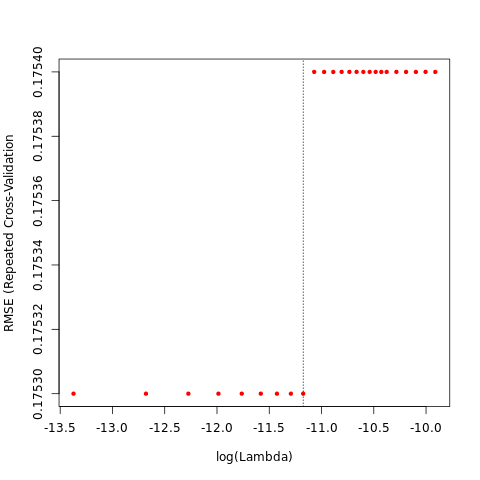

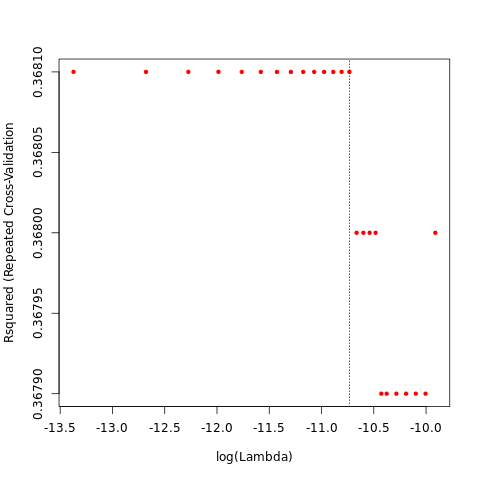

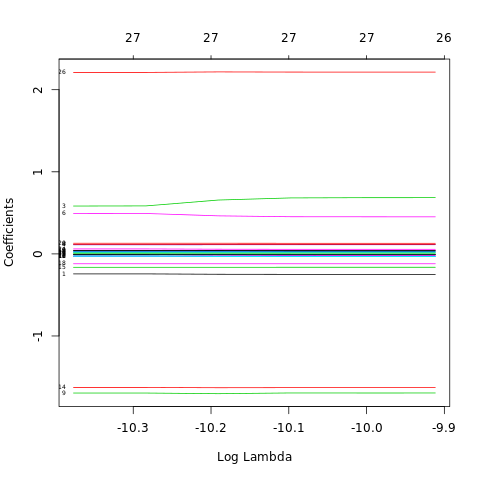

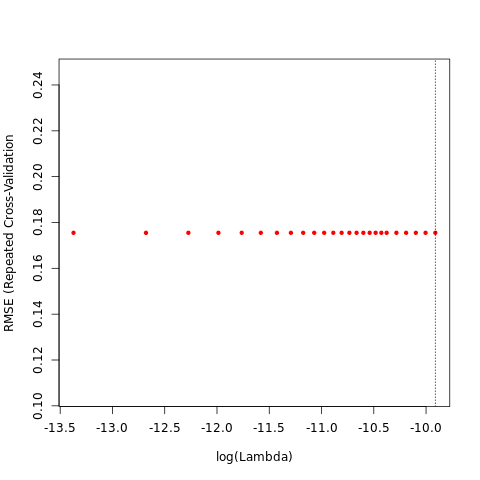

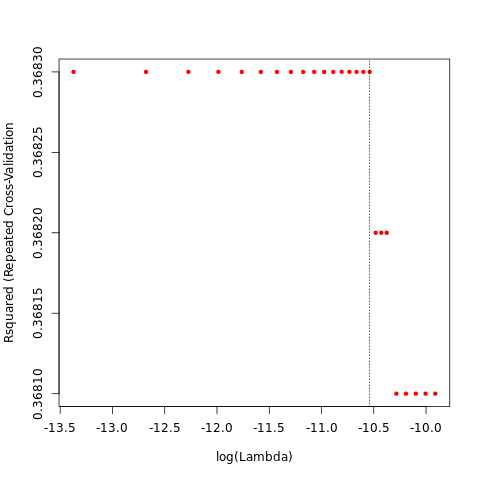

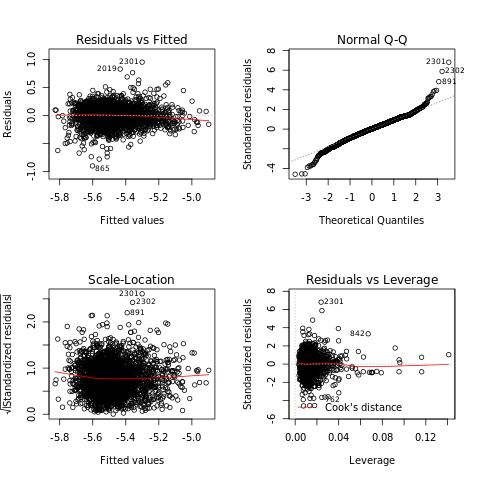

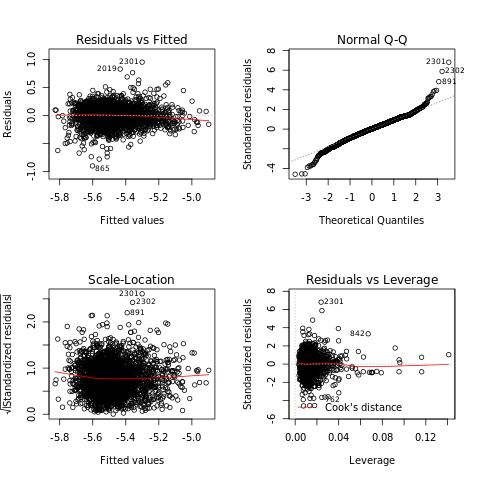

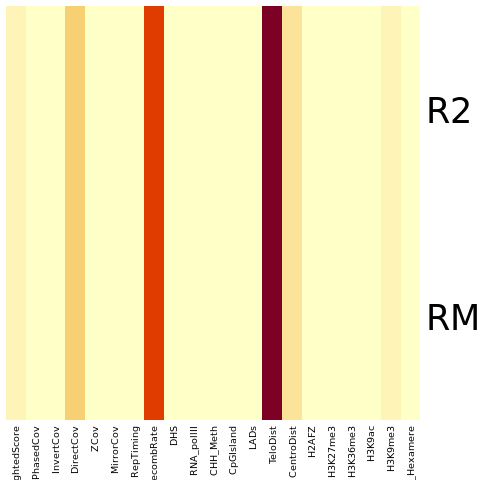

In [76]:
%%R
##### step 2: add interactions (only interactions between some of the variables that where selected in step1!) #####
###         requires this model to contain the model at step1
interactions <- c('WeightedScore:CpGIsland')
#interactions <- c(interactions, 
#                  paste('RecombRate', setdiff(names(TGP_partial_det_RMSE[-1])[!is.na(TGP_partial_det_RMSE[-1])], 
#                                              c('RecombRate',variables_forced_in)), sep = ':')) # add all interactions with RecombRate

TGP_partial_det_step2 <- compute_partial_det_with_interactions(X, Y, Z, variables_forced_in, data, variables, variables_quadratic,
                                                               TGP_partial_det_step1, interactions)
###
### INTERACTION IS NOT SELECTED !!!!
###

# look at the model selected with RMSE (in both steps)
print(summary(TGP_partial_det_step2$elastic_net_rep_RMSE$model_elastic_select_RMSE))
# check assumption issues
par(mfrow=c(2,2))
plot(TGP_partial_det_step2$elastic_net_rep_RMSE$model_elastic_select_RMSE)

# look at the model selected with R2
print(summary(TGP_partial_det_step2$elastic_net_rep_R2$model_elastic_select_R2))
# check assumption issues
par(mfrow=c(2,2))
plot(TGP_partial_det_step2$elastic_net_rep_R2$model_elastic_select_R2)

# look at partial determination
print(TGP_partial_det_step2$partial_determinations)
par(mfrow=c(1,1))
heatmap(as.matrix(TGP_partial_det_step2$partial_determinations[,-1]), Rowv = NA, Colv = NA)
TGP_partial_det_RMSE <- TGP_partial_det_step2$partial_determinations[1,]
TGP_partial_det_R2 <- TGP_partial_det_step2$partial_determinations[2,]

[1] "Divergence"


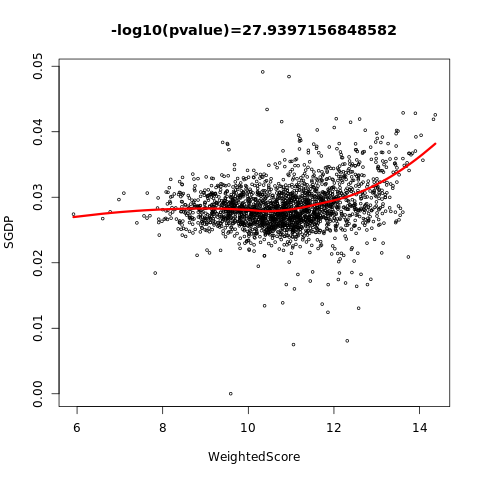

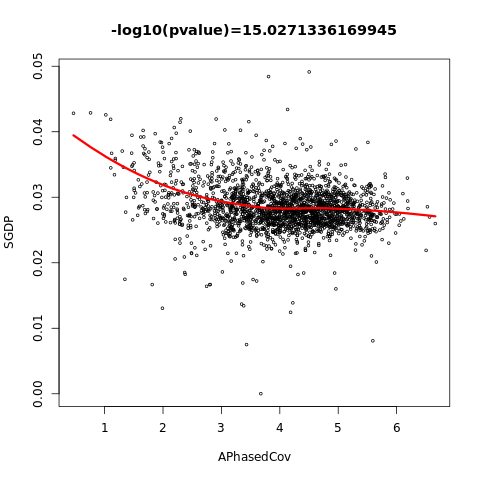

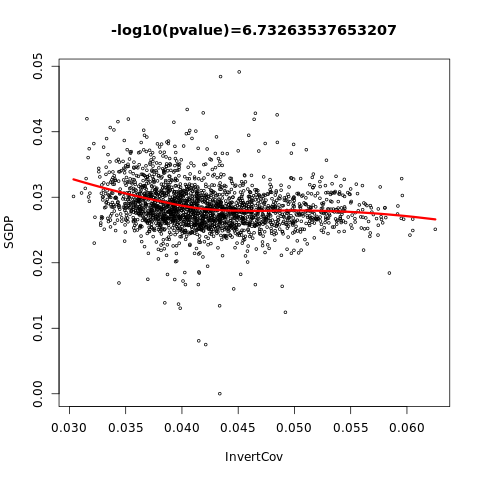

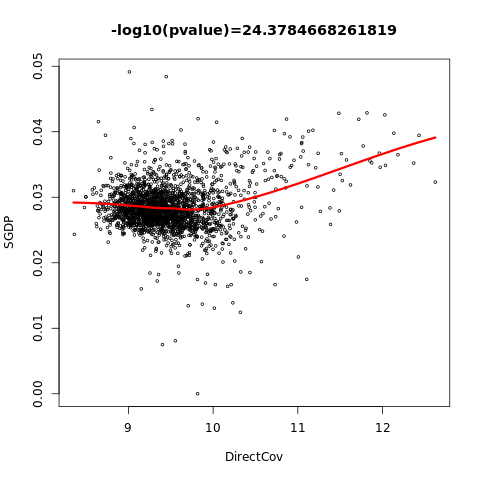

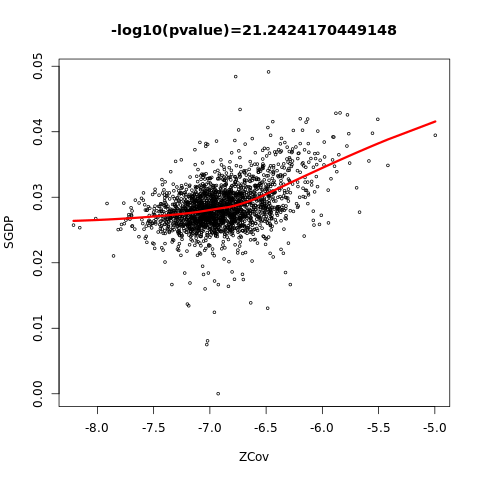

...

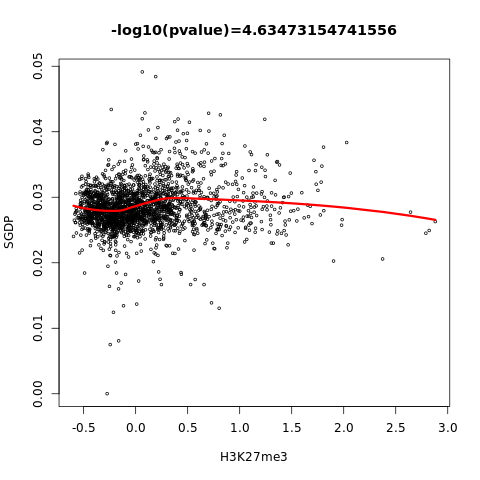

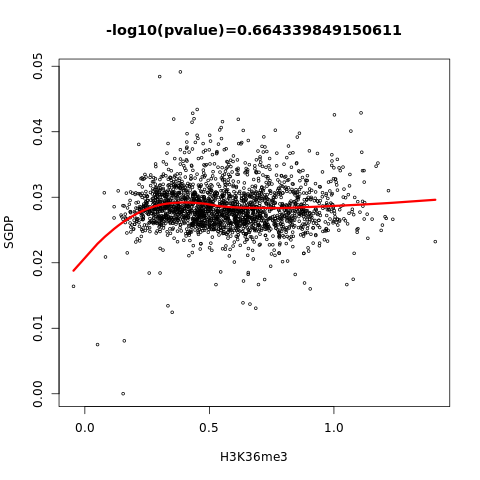

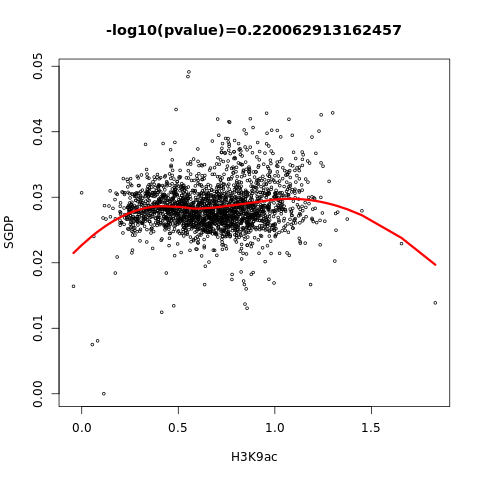

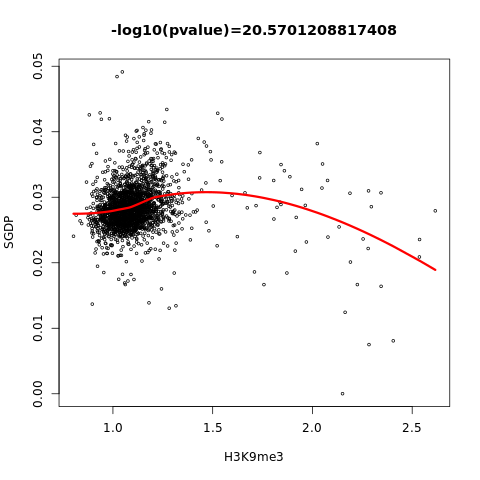

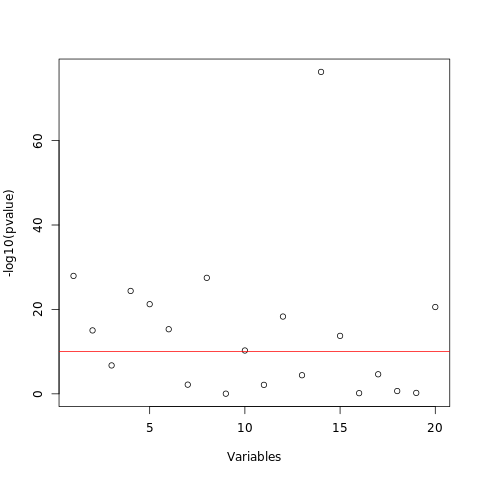

In [77]:
%%R
print('Divergence')
Y <- data$DiverCov

##### Step 0: decide which quadratic terms to add #####
pval_quadratic = select_quadratic_terms(X, Y, Z, variables_forced_in, data, setdiff(variables, categorical))

par(mfrow=c(1,1))
for(var_i in setdiff(setdiff(variables, categorical), variables_forced_in)){
  plot(data[,var_i], Y, xlab = var_i, ylab = 'SGDP', main = paste0('-log10(pvalue)=', -log10(pval_quadratic[var_i])), cex = 0.5)
  lw <- loess(paste('Y ~ ',var_i), weights = Z, data = data)
  j <- order(data[,var_i])
  lines(data[j, var_i],lw$fitted[j], col="red", lwd=3)
}

plot(-log10(pval_quadratic), xlab = 'Variables', ylab = '-log10(pvalue)')
abline(h = 10, col = 'red')
variables_quadratic <- names(pval_quadratic)[ pval_quadratic < 1e-10 ]


Call:
lm(formula = paste("Y ~ ", paste(rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE) != 
    0][-1], collapse = " + ")), data = X, weights = Z, na.action = "na.fail")

Weighted Residuals:
       Min         1Q     Median         3Q        Max 
-0.0116495 -0.0008207 -0.0000503  0.0007364  0.0125368 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         1.196e-01  1.884e-02   6.345 2.70e-10 ***
WeightedScore      -3.598e-03  7.900e-04  -4.555 5.54e-06 ***
APhasedCov         -1.372e-03  4.305e-04  -3.187 0.001460 ** 
InvertCov          -6.058e-02  1.802e-02  -3.362 0.000788 ***
DirectCov           7.827e-04  2.389e-03   0.328 0.743183    
ZCov                2.527e-02  4.652e-03   5.433 6.17e-08 ***
MirrorCov           1.216e-02  5.328e-03   2.283 0.022541 *  
RepTiming          -2.129e-04  2.910e-05  -7.315 3.61e-13 ***
RecombRate          1.149e-04  2.216e-04   0.518 0.604208    
DHS                -2.198e-02  1.331e-02  -1.652 

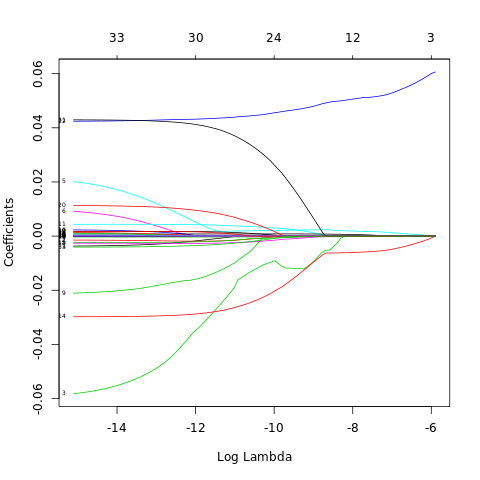

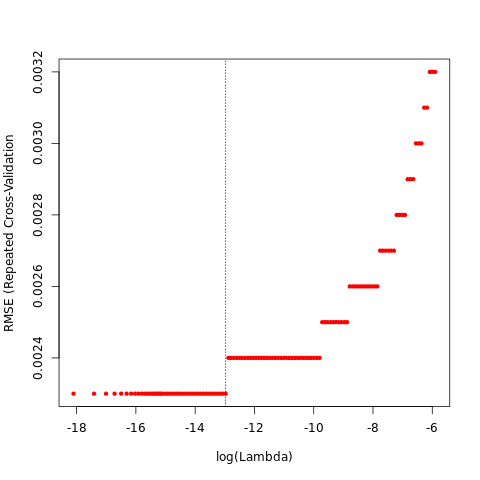

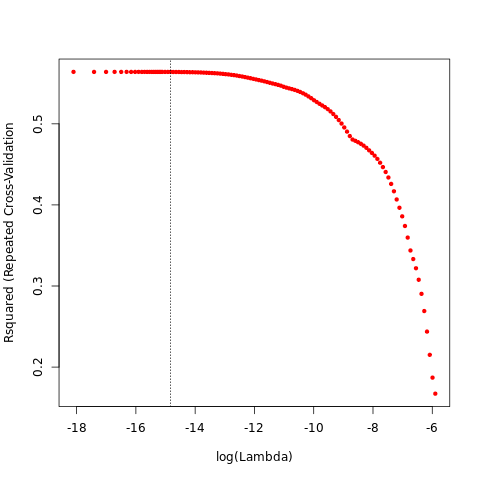

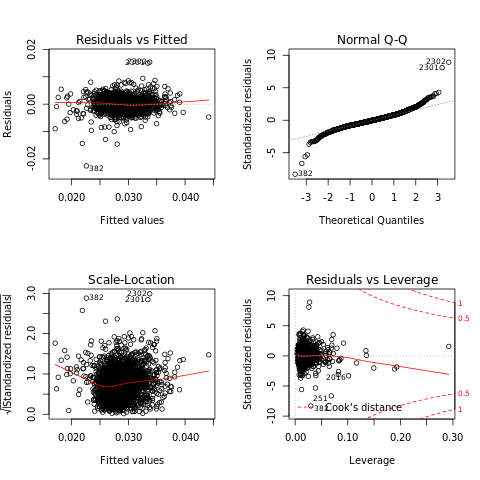

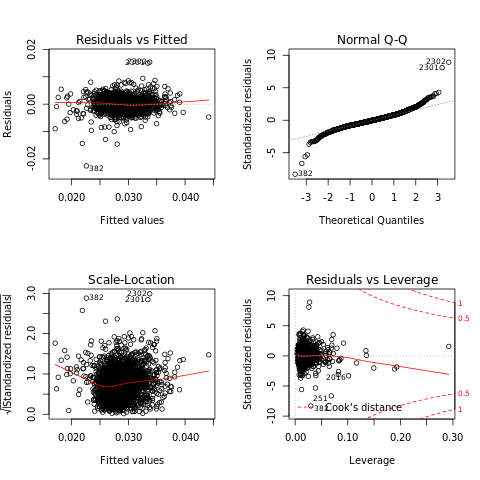

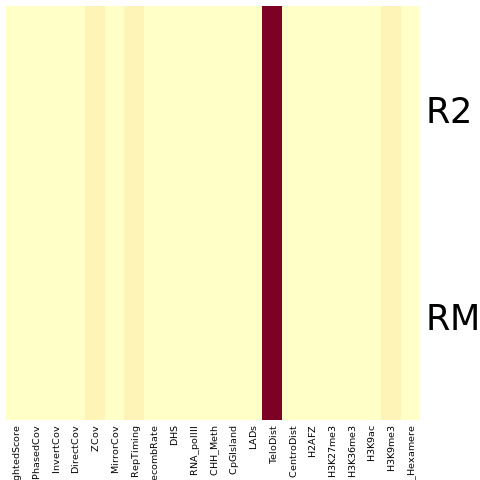

In [78]:
%%R
##### Step 1: no interactions, requires variables_forced_in inside the model #####
par(mfrow=c(4,2),cex=0.5)
divergence_partial_det_step1 <- compute_partial_det(X, Y, Z, variables_forced_in, data, variables, variables_quadratic)

# look at the model selected with RMSE
print(summary(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check multicollinearity issues
print(vif(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check assumption issues
par(mfrow=c(2,2))
plot(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE)

# look at the model selected with R2
print(summary(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check multicollinearity issues
print(vif(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check assumption issues
par(mfrow=c(2,2))
plot(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_R2)

# look at partial determination
print(divergence_partial_det_step1$partial_determinations)
par(mfrow=c(1,1))
heatmap(as.matrix(divergence_partial_det_step1$partial_determinations[,-1]), Rowv = NA, Colv = NA)
divergence_partial_det_RMSE <- divergence_partial_det_step1$partial_determinations[1,]
divergence_partial_det_R2 <- divergence_partial_det_step1$partial_determinations[2,]


Call:
lm(formula = paste("Y ~ ", paste(rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE) != 
    0][-1], collapse = " + ")), data = X, weights = Z, na.action = "na.fail")

Weighted Residuals:
       Min         1Q     Median         3Q        Max 
-0.0116495 -0.0008207 -0.0000503  0.0007364  0.0125368 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         1.196e-01  1.884e-02   6.345 2.70e-10 ***
WeightedScore      -3.598e-03  7.900e-04  -4.555 5.54e-06 ***
APhasedCov         -1.372e-03  4.305e-04  -3.187 0.001460 ** 
InvertCov          -6.058e-02  1.802e-02  -3.362 0.000788 ***
DirectCov           7.827e-04  2.389e-03   0.328 0.743183    
ZCov                2.527e-02  4.652e-03   5.433 6.17e-08 ***
MirrorCov           1.216e-02  5.328e-03   2.283 0.022541 *  
RepTiming          -2.129e-04  2.910e-05  -7.315 3.61e-13 ***
RecombRate          1.149e-04  2.216e-04   0.518 0.604208    
DHS                -2.198e-02  1.331e-02  -1.652 

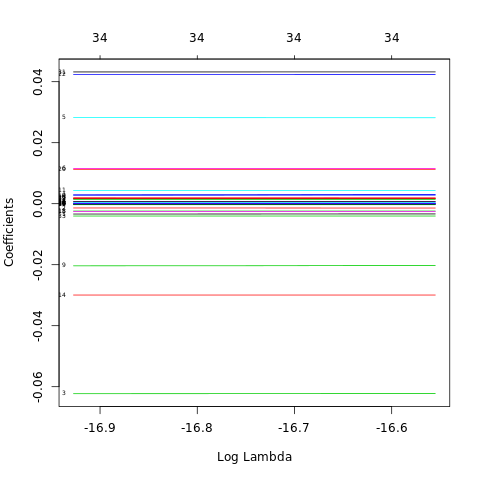

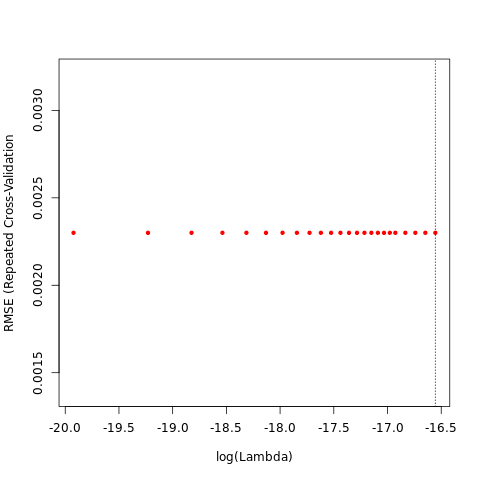

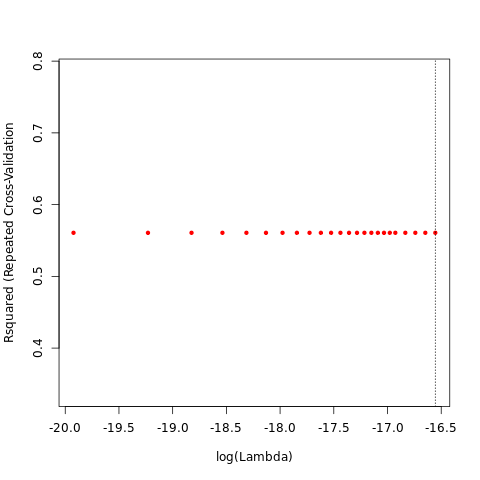

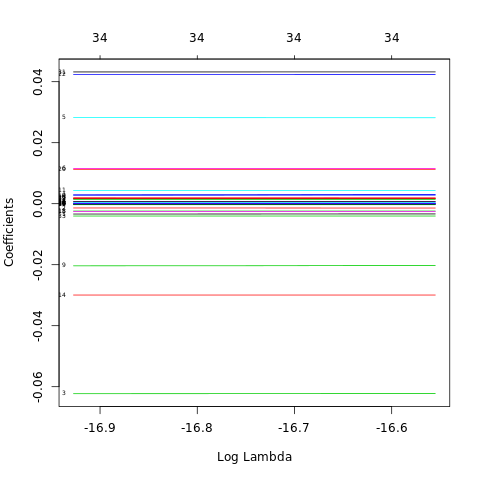

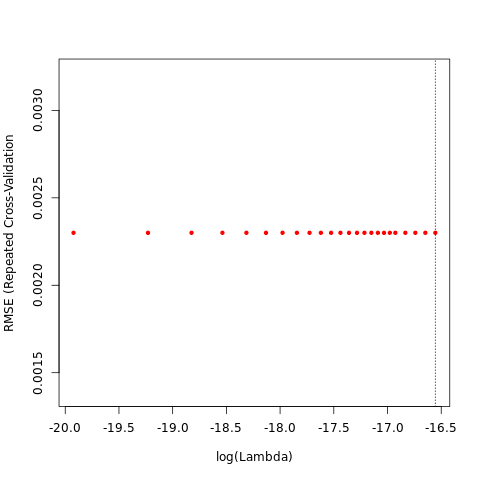

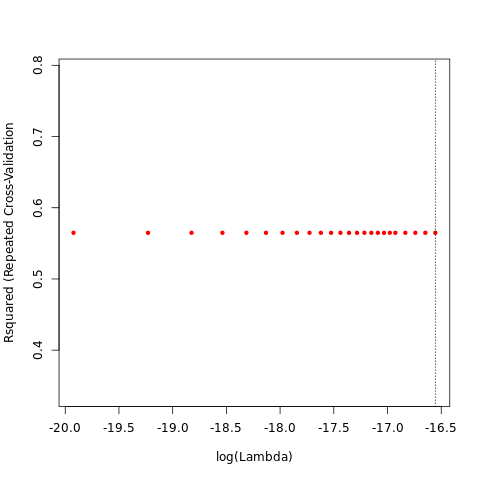

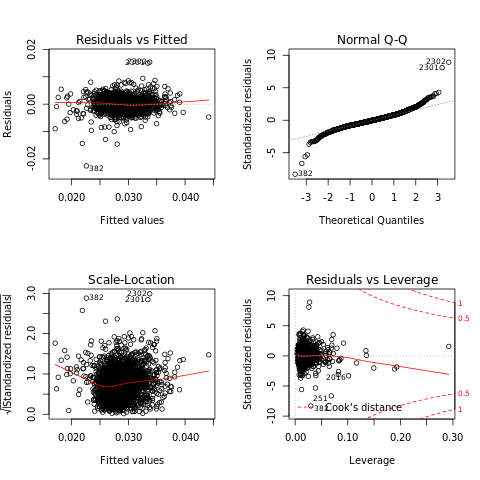

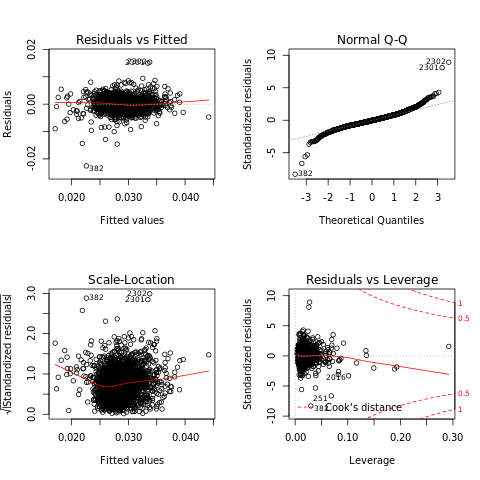

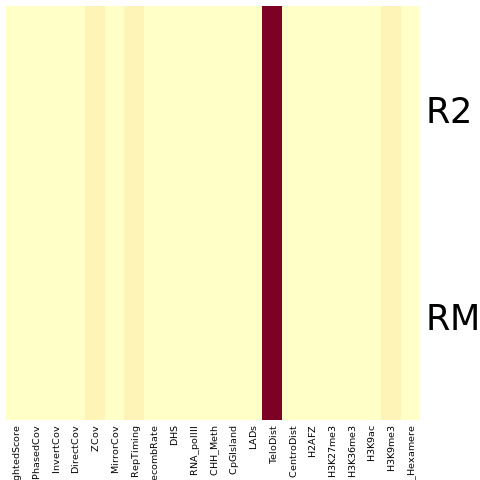

In [79]:
%%R
##### step 2: add interactions (only interactions between some of the variables that where selected in step1!) #####
###         requires this model to contain the model at step1
interactions <- c('WeightedScore:CpGIsland')
#interactions <- c(interactions, 
#                  paste('RecombRate', setdiff(names(divergence_partial_det_R2[-1])[!is.na(divergence_partial_det_R2[-1])], 
#                                              c('RecombRate',variables_forced_in)), sep = ':')) # add all interactions with RecombRate

divergence_partial_det_step2 <- compute_partial_det_with_interactions(X, Y, Z, variables_forced_in, data, variables, variables_quadratic,
                                                                      divergence_partial_det_step1, interactions)

###
### INTERACTION IS NOT SELECTED !!!!
###
# look at the model selected with RMSE (in both steps)
print(summary(divergence_partial_det_step2$elastic_net_rep_RMSE$model_elastic_select_RMSE))
# check assumption issues
par(mfrow=c(2,2))
plot(divergence_partial_det_step2$elastic_net_rep_RMSE$model_elastic_select_RMSE)

# look at the model selected with R2
print(summary(divergence_partial_det_step2$elastic_net_rep_R2$model_elastic_select_R2))
# check assumption issues
par(mfrow=c(2,2))
plot(divergence_partial_det_step2$elastic_net_rep_R2$model_elastic_select_R2)

# look at partial determination
print(divergence_partial_det_step2$partial_determinations)
par(mfrow=c(1,1))
heatmap(as.matrix(divergence_partial_det_step2$partial_determinations[,-1]), Rowv = NA, Colv = NA)
divergence_partial_det_RMSE <- divergence_partial_det_step2$partial_determinations[1,]
divergence_partial_det_R2 <- divergence_partial_det_step2$partial_determinations[2,]

[1] "DeNovo"


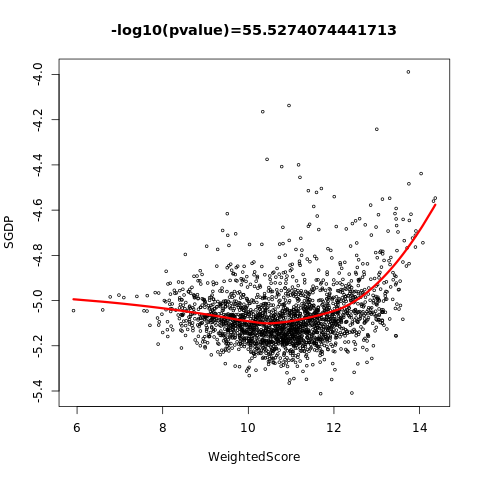

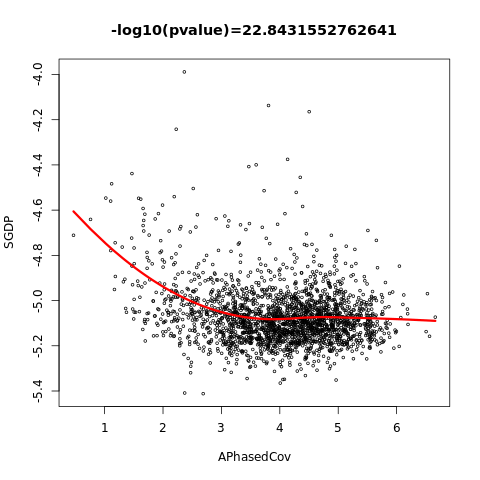

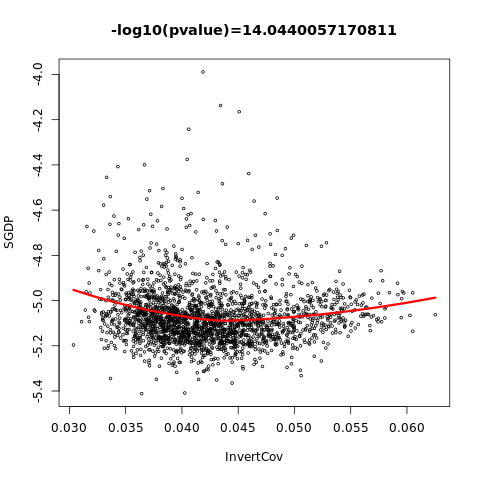

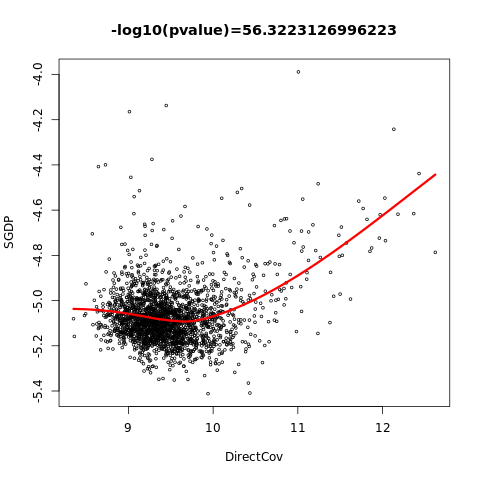

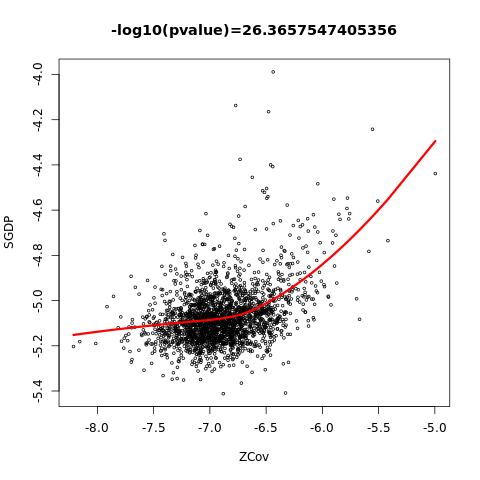

...

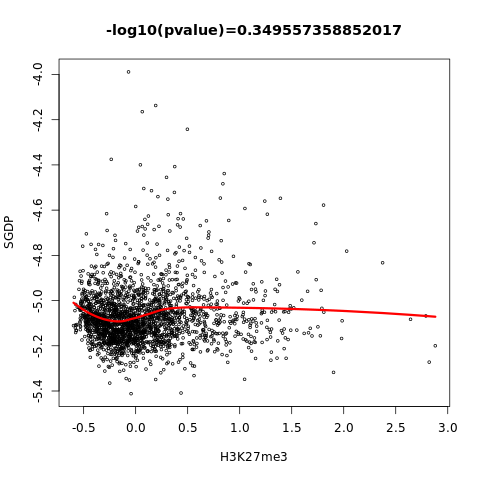

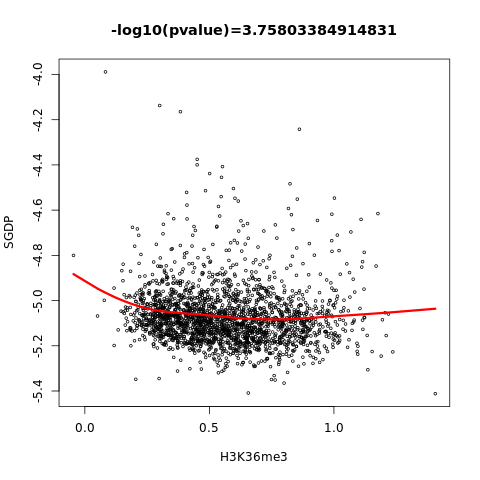

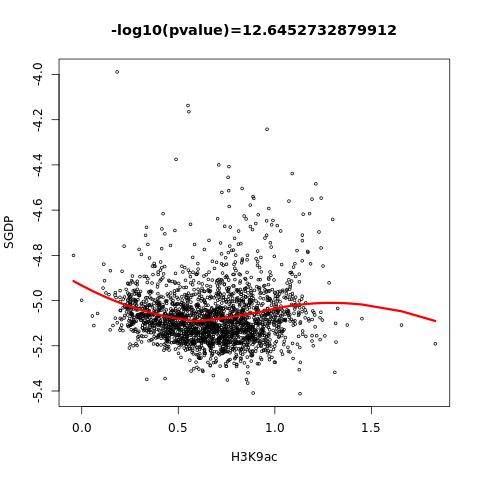

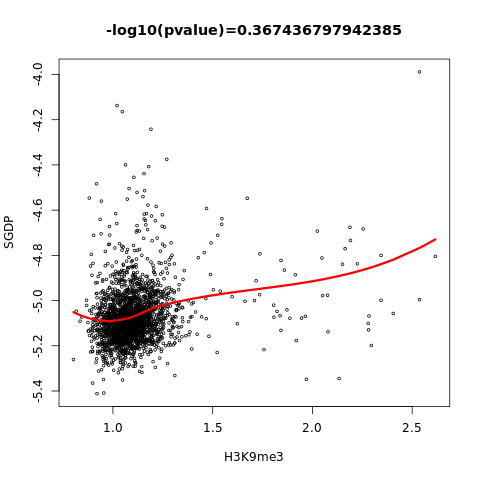

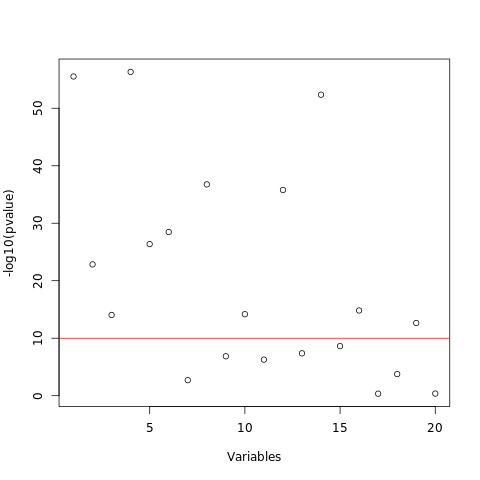

In [80]:
%%R
print('DeNovo')
Y <- data$DNMCov

##### Step 0: decide which quadratic terms to add #####
pval_quadratic = select_quadratic_terms(X, Y, Z, variables_forced_in, data, setdiff(variables, categorical))

par(mfrow=c(1,1))
for(var_i in setdiff(setdiff(variables, categorical), variables_forced_in)){
  plot(data[,var_i], Y, xlab = var_i, ylab = 'SGDP', main = paste0('-log10(pvalue)=', -log10(pval_quadratic[var_i])), cex = 0.5)
  lw <- loess(paste('Y ~ ',var_i), weights = Z, data = data)
  j <- order(data[,var_i])
  lines(data[j, var_i],lw$fitted[j], col="red", lwd=3)
}

plot(-log10(pval_quadratic), xlab = 'Variables', ylab = '-log10(pvalue)')
abline(h = 10, col = 'red')
variables_quadratic <- names(pval_quadratic)[ pval_quadratic < 1e-10 ]

In [162]:
%%R
##### Plot trends #####
# plot trend for nonB 
pdf('SGDP_nonB_trend.pdf', width = 10, height = 7)
par(mfrow=c(1,2))
nonB <- c('WeightedScore', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov')
nonB_name = c('G4 weighted coverage', 'A-phased repeats coverage', 'Inverted repeats coverage', 'Direct repeats coverage', 'Z-DNA motifs coverage', 'Mirror repeats coverage')
nonB_log = c('Log ', '', '', 'Log ', 'Log ', 'Log ')
for(i in seq_along(nonB)){
  var_i = nonB[i]
  plot(data[,var_i], Y, xlab = paste0(nonB_log[i], nonB_name[i]), ylab = 'Log SNP frequency', main = paste0(nonB_name[i], ' - Loess'), cex = 0.5)
  lw <- loess(paste('Y ~ ',var_i), weights = Z, data = data, span = 1)
  j <- order(data[,var_i])
  lines(data[j, var_i],lw$fitted[j], col="red", lwd=3)
  
  plot(data[,var_i], Y, xlab = paste0(nonB_log[i], nonB_name[i]), ylab = 'Log SNP frequency', main = paste0(nonB_name[i], ' - Model'), cex = 0.5)
  model = SGDP_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE
  xy = predict_variable(data, model, categorical, var_i)
  lines(xy$x, xy$y, col="red", lwd=3)
  text(xy$x[1], max(Y), paste(round(coef(model)[grepl(nonB[i],names(coef(model)))],5),c('x','x^2'), collapse = ' + '), pos = 4)
}
dev.off()

pdf('SGDP_nonB_trend_loess.pdf', width = 8, height = 7)
par(mfrow=c(2,3))
nonB <- c('WeightedScore', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov')
nonB_name = c('G4 weighted coverage', 'A-phased repeats coverage', 'Inverted repeats coverage', 'Direct repeats coverage', 'Z-DNA motifs coverage', 'Mirror repeats coverage')
nonB_log = c('Log ', '', '', 'Log ', 'Log ', 'Log ')
for(i in seq_along(nonB)){
  var_i = nonB[i]
  plot(data[,var_i], Y, xlab = paste0(nonB_log[i], nonB_name[i]), ylab = 'Log SNP frequency', main = nonB_name[i], cex = 0.5)
  lw <- loess(paste('Y ~ ',var_i), weights = Z, data = data, span = 1)
  j <- order(data[,var_i])
  lines(data[j, var_i],lw$fitted[j], col="red", lwd=3)
}
dev.off()

png 
  2 


[1] "Divergence"

Call:
lm(formula = paste("Y ~ ", paste(rownames(elastic_select_RMSE)[as.matrix(elastic_select_RMSE) != 
    0][-1], collapse = " + ")), data = X, weights = Z, na.action = "na.fail")

Weighted Residuals:
       Min         1Q     Median         3Q        Max 
-0.0116495 -0.0008207 -0.0000503  0.0007364  0.0125368 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         1.196e-01  1.884e-02   6.345 2.70e-10 ***
WeightedScore      -3.598e-03  7.900e-04  -4.555 5.54e-06 ***
APhasedCov         -1.372e-03  4.305e-04  -3.187 0.001460 ** 
InvertCov          -6.058e-02  1.802e-02  -3.362 0.000788 ***
DirectCov           7.827e-04  2.389e-03   0.328 0.743183    
ZCov                2.527e-02  4.652e-03   5.433 6.17e-08 ***
MirrorCov           1.216e-02  5.328e-03   2.283 0.022541 *  
RepTiming          -2.129e-04  2.910e-05  -7.315 3.61e-13 ***
RecombRate          1.149e-04  2.216e-04   0.518 0.604208    
DHS                -2.198e-02  1

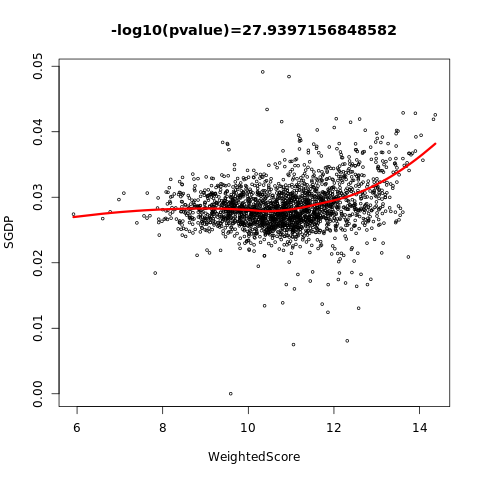

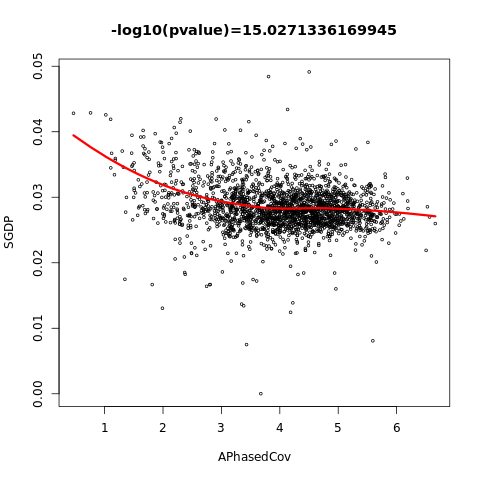

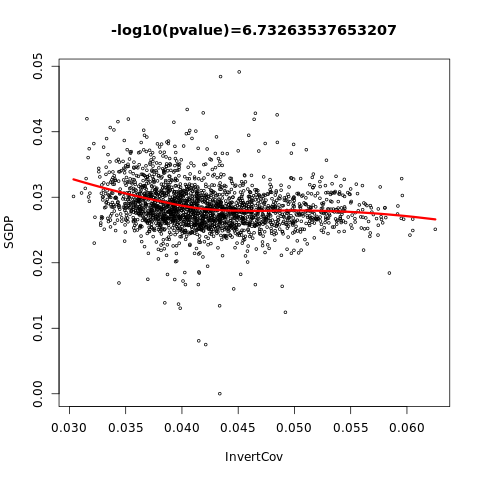

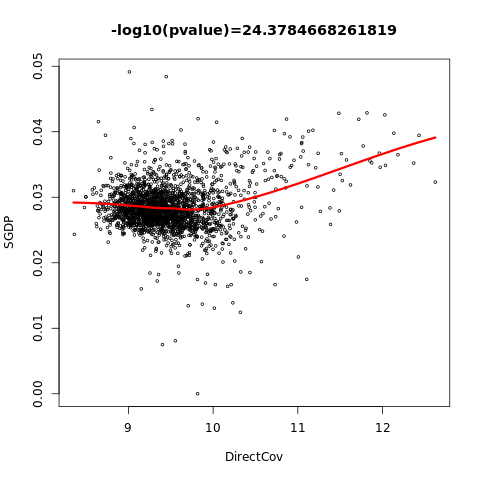

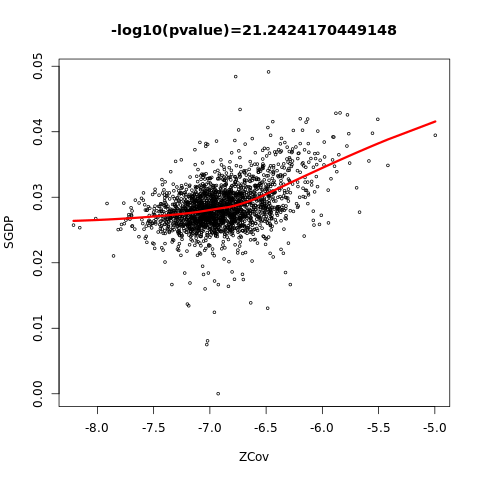

...

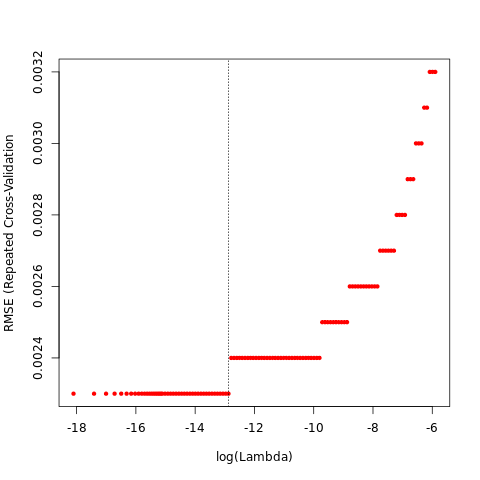

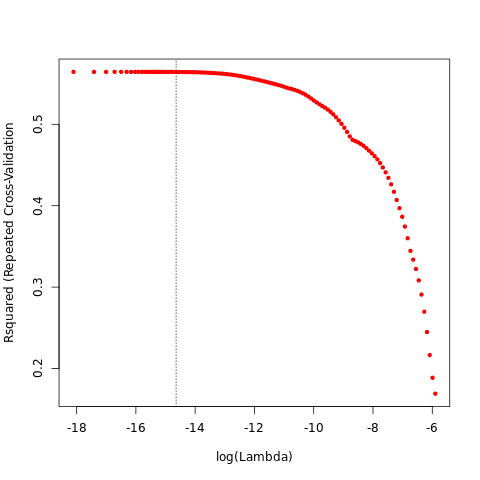

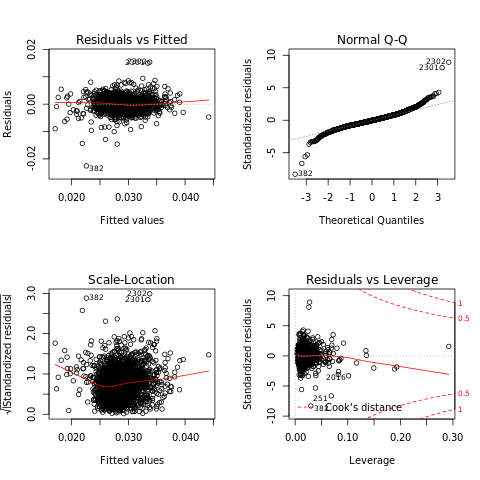

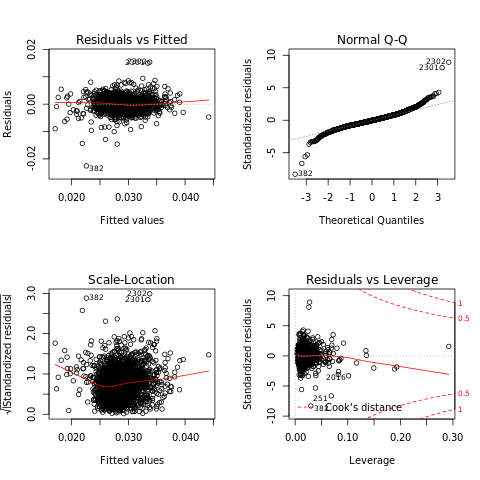

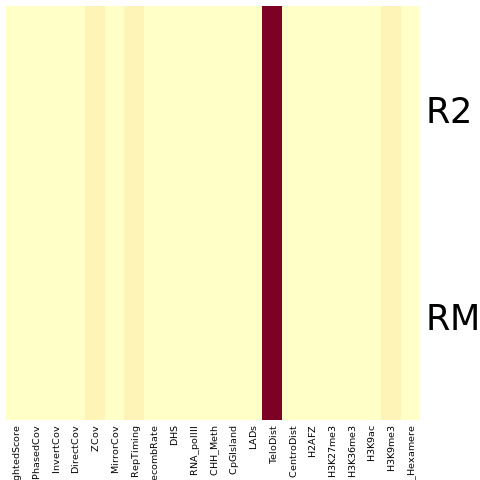

In [164]:
%%R

print('Divergence')
Y <- data$DiverCov

##### Step 0: decide which quadratic terms to add #####
pval_quadratic = select_quadratic_terms(X, Y, Z, variables_forced_in, data, setdiff(variables, categorical))

par(mfrow=c(1,1))
for(var_i in setdiff(setdiff(variables, categorical), variables_forced_in)){
  plot(data[,var_i], Y, xlab = var_i, ylab = 'SGDP', main = paste0('-log10(pvalue)=', -log10(pval_quadratic[var_i])), cex = 0.5)
  lw <- loess(paste('Y ~ ',var_i), weights = Z, data = data)
  j <- order(data[,var_i])
  lines(data[j, var_i],lw$fitted[j], col="red", lwd=3)
}

plot(-log10(pval_quadratic), xlab = 'Variables', ylab = '-log10(pvalue)')
abline(h = 10, col = 'red')
variables_quadratic <- names(pval_quadratic)[ pval_quadratic < 1e-10 ]
#####

set.seed(1)
##### Step 1: no interactions, requires variables_forced_in inside the model #####
par(mfrow=c(4,2),cex=0.5)
divergence_partial_det_step1 <- compute_partial_det(X, Y, Z, variables_forced_in, data, variables, variables_quadratic)

# look at the model selected with RMSE
print(summary(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check multicollinearity issues
print(vif(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE))
# check assumption issues
par(mfrow=c(2,2))
plot(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE)

# look at the model selected with R2
print(summary(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check multicollinearity issues
print(vif(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_R2))
# check assumption issues
par(mfrow=c(2,2))
plot(divergence_partial_det_step1$elastic_net_rep$model_elastic_select_R2)

# look at partial determination
print(divergence_partial_det_step1$partial_determinations)
par(mfrow=c(1,1))
heatmap(as.matrix(divergence_partial_det_step1$partial_determinations[,-1]), Rowv = NA, Colv = NA)
divergence_partial_det_RMSE <- divergence_partial_det_step1$partial_determinations[1,]
divergence_partial_det_R2 <- divergence_partial_det_step1$partial_determinations[2,]

# look at partial determination for nonB
nonB <- c('WeightedScore', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov')
divergence_partial_det_RMSE_nonB <- partial_determination_group(data, divergence_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE, nonB)
divergence_partial_det_R2_nonB <- partial_determination_group(data, divergence_partial_det_step1$elastic_net_rep$model_elastic_select_R2, nonB)
#####

In [166]:
%%R
##### Plot trends #####
# plot trend for nonB 
pdf('divergence_nonB_trend.pdf', width = 10, height = 7)
par(mfrow=c(1,2))
nonB <- c('WeightedScore', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov')
nonB_name = c('G4 weighted coverage', 'A-phased repeats coverage', 'Inverted repeats coverage', 'Direct repeats coverage', 'Z-DNA motifs coverage', 'Mirror repeats coverage')
nonB_log = c('Log ', '', '', 'Log ', 'Log ', 'Log ')
for(i in seq_along(nonB)){
  var_i = nonB[i]
  plot(data[,var_i], Y, xlab = paste0(nonB_log[i], nonB_name[i]), ylab = 'FNS frequency', main = paste0(nonB_name[i], ' - Loess'), cex = 0.5)
  lw <- loess(paste('Y ~ ',var_i), weights = Z, data = data, span = 1)
  j <- order(data[,var_i])
  lines(data[j, var_i],lw$fitted[j], col="red", lwd=3)
  
  plot(data[,var_i], Y, xlab = paste0(nonB_log[i], nonB_name[i]), ylab = 'FNS frequency', main = paste0(nonB_name[i], ' - Model'), cex = 0.5)
  model = divergence_partial_det_step1$elastic_net_rep$model_elastic_select_RMSE
  xy = predict_variable(data, model, categorical, var_i)
  lines(xy$x, xy$y, col="red", lwd=3)
  text(xy$x[1], max(Y), paste(round(coef(model)[grepl(nonB[i],names(coef(model)))],5),c('x','x^2'), collapse = ' + '), pos = 4)
}
dev.off()

pdf('divergence_nonB_trend_loess.pdf', width = 8, height = 7)
par(mfrow=c(2,3))
nonB <- c('WeightedScore', 'APhasedCov', 'InvertCov', 'DirectCov', 'ZCov', 'MirrorCov')
nonB_name = c('G4 weighted coverage', 'A-phased repeats coverage', 'Inverted repeats coverage', 'Direct repeats coverage', 'Z-DNA motifs coverage', 'Mirror repeats coverage')
nonB_log = c('Log ', '', '', 'Log ', 'Log ', 'Log ')
for(i in seq_along(nonB)){
  var_i = nonB[i]
  plot(data[,var_i], Y, xlab = paste0(nonB_log[i], nonB_name[i]), ylab = 'FNS frequency', main = nonB_name[i], cex = 0.5)
  lw <- loess(paste('Y ~ ',var_i), weights = Z, data = data, span = 1)
  j <- order(data[,var_i])
  lines(data[j, var_i],lw$fitted[j], col="red", lwd=3)
}
dev.off()
#####

png 
  2 


                              SGDP           Divergence
APhasedCov    0.000747193544414486   0.0046621969646959
CHH_Meth      0.000163742954314571  0.00456740726567317
CentroDist      0.0330645765257907  0.00739639983791601
CpGIsland       0.0029877288127215  0.00551251194097135
DHS            0.00971521108637849  0.00125612494869864
DirectCov        0.042330400756723  0.00305196611494979
H2AFZ          0.00489418043303611  0.00291645034358845
H3K27me3       0.00100430918365217 1.11111570496883e-06
H3K36me3        0.0032305689580502  0.00519604663678461
H3K9ac         0.00183746247574392  0.00202978198978273
H3K9me3         0.0199662265064061   0.0164554696915731
InvertCov      0.00509337598189287  0.00518350930612358
LADs           0.00753932655141261   0.0137766360264709
MirrorCov      0.00165563422151254  0.00461396639863789
RNA_pollII      0.0100562594931563  0.00652506501773896
RecombRate      0.0526965118230729   0.0051008055531097
RepTiming      0.00789783342350304   0.024075849

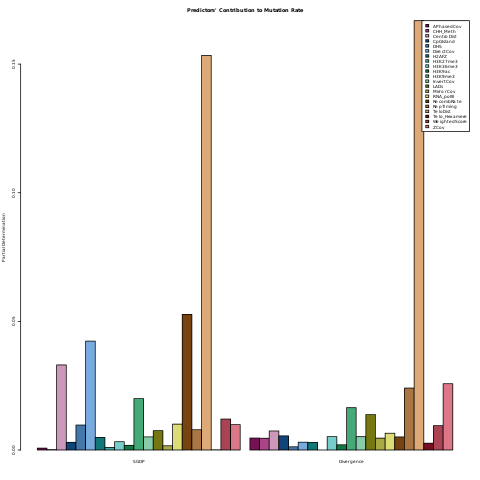

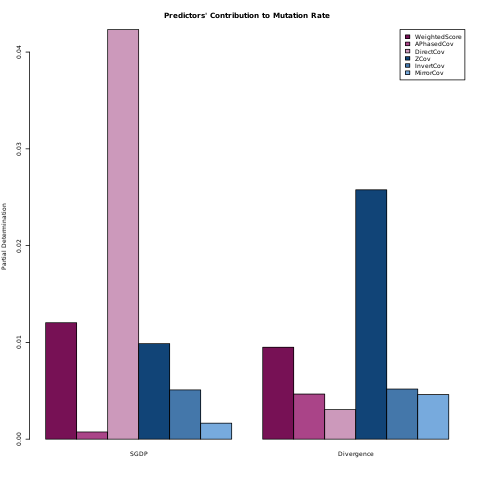

In [167]:
%%R
##### RMSE models for all mutation rates #####

SGDP <- cbind(colnames(SGDP_partial_det_RMSE[-1]),as.vector(t(SGDP_partial_det_RMSE[-1])))
colnames(SGDP) <- c('Predictors', 'Partial Determination')

divergence <- cbind(colnames(divergence_partial_det_RMSE[-1]),as.vector(t(divergence_partial_det_RMSE[-1])))
colnames(divergence) <- c('Predictors', 'Partial Determination')

partial_det_merged <- merge(SGDP,divergence, by = "Predictors", all=TRUE)

colnames(partial_det_merged) <- c('Predictors', 'SGDP', 'Divergence')
rownames(partial_det_merged) <- partial_det_merged[,1]
partial_det_merged <- partial_det_merged[,-1]

print(partial_det_merged)



partial_det_matrix <- sapply(partial_det_merged, function(x) {as.numeric(as.character(x))})
partial_det_matrix[is.na(partial_det_matrix)] <- 0

print(partial_det_matrix)

par(mfrow=c(1,1),cex=0.35)
tol21rainbow= c("#771155", "#AA4488", "#CC99BB", "#114477", "#4477AA", "#77AADD", "#117777", "#44AAAA", "#77CCCC", "#117744", "#44AA77", "#88CCAA", "#777711", "#AAAA44", "#DDDD77", "#774411", "#AA7744", "#DDAA77", "#771122", "#AA4455", "#DD7788")
barplot(partial_det_matrix, col = tol21rainbow[0:21], beside=TRUE, legend = rownames(partial_det_merged), args.legend = list(x="topright"), main = "Predictors' Contribution to Mutation Rate", ylab = "Partial Determination")


partial_det_merged_nonB <- partial_det_merged[c('WeightedScore','APhased','DirectCov','ZCov', 'InvertCov', 'MirrorCov'),]
partial_det_matrix_nonB <- sapply(partial_det_merged_nonB, function(x) {as.numeric(as.character(x))})
partial_det_matrix_nonB[is.na(partial_det_matrix_nonB)] <- 0

par(mfrow=c(1,1),cex=0.5)
tol21rainbow= c("#771155", "#AA4488", "#CC99BB", "#114477", "#4477AA", "#77AADD", "#117777", "#44AAAA", "#77CCCC", "#117744", "#44AA77", "#88CCAA", "#777711", "#AAAA44", "#DDDD77", "#774411", "#AA7744", "#DDAA77", "#771122", "#AA4455", "#DD7788")
barplot(partial_det_matrix_nonB, col = tol21rainbow[0:6], beside=TRUE, legend = rownames(partial_det_merged_nonB), args.legend = list(x="topright"), main = "Predictors' Contribution to Mutation Rate", ylab = "Partial Determination")


                              SGDP           Divergence
APhasedCov    0.000747193544414486   0.0046621969646959
CHH_Meth      0.000163742954314571  0.00456740726567317
CentroDist      0.0330645765257907  0.00739639983791601
CpGIsland       0.0029877288127215  0.00551251194097135
DHS            0.00971521108637849  0.00125612494869864
DirectCov        0.042330400756723  0.00305196611494979
H2AFZ          0.00489418043303611  0.00291645034358845
H3K27me3       0.00100430918365217 1.11111570496883e-06
H3K36me3        0.0032305689580502  0.00519604663678461
H3K9ac         0.00183746247574392  0.00202978198978273
H3K9me3         0.0199662265064061   0.0164554696915731
InvertCov      0.00509337598189287  0.00518350930612358
LADs           0.00753932655141261   0.0137766360264709
MirrorCov      0.00165563422151254  0.00461396639863789
RNA_pollII      0.0100562594931563  0.00652506501773896
RecombRate      0.0526965118230729   0.0051008055531097
RepTiming      0.00789783342350304   0.024075849

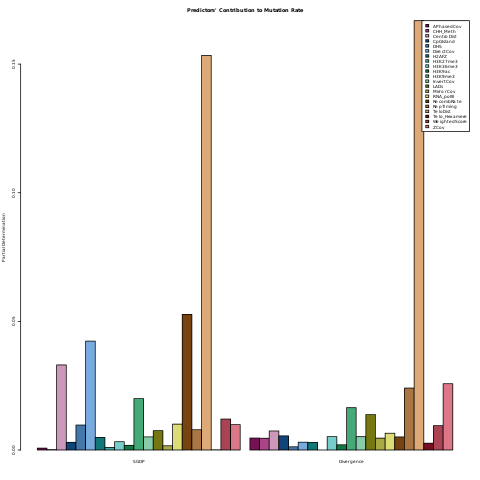

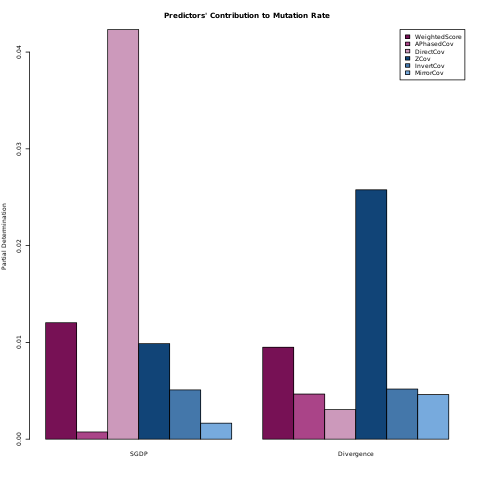

In [168]:
%%R

### R2 models for all mutation rates

SGDP <- cbind(colnames(SGDP_partial_det_R2[-1]),as.vector(t(SGDP_partial_det_R2[-1])))
colnames(SGDP) <- c('Predictors', 'Partial Determination')

divergence <- cbind(colnames(divergence_partial_det_R2[-1]),as.vector(t(divergence_partial_det_R2[-1])))
colnames(divergence) <- c('Predictors', 'Partial Determination')

partial_det_merged <- merge(SGDP, divergence, by = "Predictors", all=TRUE)

colnames(partial_det_merged) <- c('Predictors', 'SGDP', 'Divergence')
rownames(partial_det_merged) <- partial_det_merged[,1]
partial_det_merged <- partial_det_merged[,-1]

print(partial_det_merged)



partial_det_matrix <- sapply(partial_det_merged, function(x) {as.numeric(as.character(x))})
partial_det_matrix[is.na(partial_det_matrix)] <- 0

print(partial_det_matrix)

par(mfrow=c(1,1),cex=0.35)
tol21rainbow= c("#771155", "#AA4488", "#CC99BB", "#114477", "#4477AA", "#77AADD", "#117777", "#44AAAA", "#77CCCC", "#117744", "#44AA77", "#88CCAA", "#777711", "#AAAA44", "#DDDD77", "#774411", "#AA7744", "#DDAA77", "#771122", "#AA4455", "#DD7788")
barplot(partial_det_matrix, col = tol21rainbow[0:21], beside=TRUE, legend = rownames(partial_det_merged), args.legend = list(x="topright"), main = "Predictors' Contribution to Mutation Rate", ylab = "Partial Determination")


partial_det_merged_nonB <- partial_det_merged[c('WeightedScore','APhased','DirectCov','ZCov', 'InvertCov', 'MirrorCov'),]
partial_det_matrix_nonB <- sapply(partial_det_merged_nonB, function(x) {as.numeric(as.character(x))})
partial_det_matrix_nonB[is.na(partial_det_matrix_nonB)] <- 0

par(mfrow=c(1,1),cex=0.5)
tol21rainbow= c("#771155", "#AA4488", "#CC99BB", "#114477", "#4477AA", "#77AADD", "#117777", "#44AAAA", "#77CCCC", "#117744", "#44AA77", "#88CCAA", "#777711", "#AAAA44", "#DDDD77", "#774411", "#AA7744", "#DDAA77", "#771122", "#AA4455", "#DD7788")
barplot(partial_det_matrix_nonB, col = tol21rainbow[0:6], beside=TRUE, legend = rownames(partial_det_merged_nonB), args.legend = list(x="topright"), main = "Predictors' Contribution to Mutation Rate", ylab = "Partial Determination")


# File index

List of files used and generated by this notebook

**hg19_1Mb_noGap.bed**
> 1 Mb windows without gaps

**WholeSGDPsnps.vcf \ WholeSGDPsnps.bed**
>All SNPs from the Simmons Genome Diversity Project

**divergence.bed**
>All divergent sites between homo and pongo

**QuadronCustom.R**
>Script running Quadron

**hg19.fa**
>homo sapiens reference genome. hg19 and hs37d5 have identical autosome sequences

**hs37d5.quadron.bed**
> G4s annotated by Quadron

**NCNRQuadron.bed**
> Find in Supplementary code 2

**G4Intersect_1Mb**
>NCNRQuadron Intersected with 1Mb windows

**WeightedScore_1Mb.bed**
>Weighted G4s in 1Mb windows

**APhasedRepeats.bed \ InvertedRepeats.bed \ DirectRepeats.bed \ ZDNAMotifs.bed \ MirrorRepeats.bed**
> Other non-B DNA annotations

**autosomes.out**
> RepeatMasker annotations on autosomes

**hg19Interspersed.bed \ hg19RM_no_Interspersed.bed**
> RepeatMasker split into Interspersed and other repeats

**1k Up- and Downstream, 5' and 3' UTRs, Exons, and Introns .bed**
> Annotations of genic regions

**phastConsElements100way.bed \ phastConsElements100wayFlanked.bed**
> Annotation of conserved elements

**GeneHancerRegElementsDoubleElite.bed**
> Annotation of enhancers

**LADs.bed**
> Annotation of Lamina Associated Domains

**CpGs.bed**
> Annotation of CpG Islands


**ReplicationTiming.Interval \ sex_averaged_rmap_hg19.bed \ DHS.bed \ RNA_pollII.bed \ CpG_Meth.bed \ CHH_Meth.bed \ CHG_Meth.bed \ 5hMc_Meth.bed \ RepOrigin.bed**
> Multiple predictors recovered from previous project

**hg19_1Mb_noGap.RepTiming**
> Weighted replication timing in windows

**hg19_1Mb_noGap.rmap**
> Average recombination rate in windows

**hg19_1Mb_noGap.GCcontent.bed**
> GC content in 1Mb windows

**hg19_1Mb_noGap.midpoints.distances**
> Distances from Telo- and centromeres

**H1-hESC_H3K4me3.bigWig \ H1-hESC_H3K36me3.bigWig \ H1-hESC_H3K4me3.bigWig \ H1-hESC_H3K4me2.bigWig \ H1-hESC_CTCF.bigWig \ H1-hESC_H3K4me1.bigWig \ H1-hESC_H3K9ac.bigWig \ H1-hESC_H2AFZ.bigWig \ H1-hESC_H4K20me1.bigWig \ H1-hESC_H3K27ac.bigWig \ H1-hESC_H3K9me3.bigWig \ H1-hESC_H3K27me3.bigWig**
> ENCODE data

**hg19_1Mb_ENCODE.tab**
> Processed ENCODE data

**wgEncodeCrgMapabilityAlign100mer**
> Mapability data

**hg19_1Mb_Mapability.tab**
> Processed Mapability data

**CRgenome.merged.bed**
> Coding / Repetitive subgenome

**NCNRhighfreqsnps.bed \ NCNRsgdp.bed \ NCNRSingletons.bed \ NCNRdivergence.bed \ NCNRdnm.bed \ NCNRAPhasedRepeats.bed \ NCNRInvertedRepeats.bed \ NCNRDirectRepeats.bed \ NCNRZDNAMotifs.bed \ NCNRMirrorRepeats.bed \ NCNRQuadron.bed**
> Annotations restricted to NCNR subgenome

**hg19_1Mb_coverage**
> NCNR coverage of 1Mb windows

**Annotate19Refseq_1Mb**
> Annotate predictors on 1Mb windows

**NCounts**
> Counts of Ns in windows

**Intersects.csv**
>All predictors annotated in a .csv file. Input for multiple regression